In [1]:
# pip install basemap


In [4]:
import os
import sys
import pandas as pd
import numpy as np
import obspy
from tqdm import tqdm

from obspy.clients.fdsn import Client
from obspy.clients.fdsn import Client as FDSNClient

from mpl_toolkits.basemap import Basemap


from pnwstore.mseed import WaveformClient
from datetime import datetime
from matplotlib import pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

from obspy import UTCDateTime

from tqdm import tqdm
from obspy.geodetics import locations2degrees, degrees2kilometers

notebook_dir = os.getcwd()
parent_dir = os.path.abspath(os.path.join(notebook_dir, '../'))
if parent_dir not in sys.path:
    sys.path.append(parent_dir)
    
from plot_utils import *
from qc_utils import * 

## Morton Catalog

In [6]:
# Read Morton's catalog
events_morton = pd.read_csv('../data/ds01.csv')
# Convert the TSTRING to datetime
events_morton['datetime'] = pd.to_datetime(events_morton['TSTRING'], format='%Y%m%d%H%M%S', utc=True)
# Get the events in the Morton catalog 
t1 = pd.Timestamp('2011-1-1 00:00:00.000000+0000', tz='UTC')
t2 = pd.Timestamp('2015-12-31 23:59:59.999999+0000', tz='UTC')

events_morton= events_morton.loc[(events_morton['datetime'] > t1) & (events_morton['datetime'] < t2) ]

events_morton.head()

,CI YEAR,TSTRING,YEAR,MONTH,DAY,HOUR,MINUTE,SECOND,LAT,LON,...,dist to nearest stn,tt RMS,ERH,ERZ,STRIKE,DIP,RAKE,PLATE DESIGNATION,TEMPLATE EVENT?,datetime
0,1.0,2.011073e+13,2011.0,7.0,26.0,1.0,2.0,7.37,47.3217,-123.2708,...,27.4,0.19,0.8,1.2,NaN,NaN,NaN,Interface,Catalog,2011-07-26 01:02:07+00:00
1,1.0,2.011073e+13,2011.0,7.0,26.0,1.0,2.0,7.72,44.2888,-124.3340,...,163.8,0.06,13.1,3.2,NaN,NaN,NaN,Upper Plate,NaN,2011-07-26 01:02:07+00:00
2,1.0,2.011073e+13,2011.0,7.0,26.0,1.0,2.0,8.56,44.3017,-124.3180,...,131.1,0.50,35.4,22.2,NaN,NaN,NaN,Upper Plate,NaN,2011-07-26 01:02:08+00:00
3,1.0,2.011073e+13,2011.0,7.0,26.0,7.0,31.0,2.17,48.2635,-124.9298,...,44.4,0.77,3.5,6.4,NaN,NaN,NaN,Upper Plate,NaN,2011-07-26 07:31:02+00:00
4,1.0,2.011073e+13,2011.0,7.0,26.0,9.0,50.0,27.63,48.3032,-124.9157,...,46.1,0.94,4.0,6.9,NaN,NaN,NaN,Upper Plate,T,2011-07-26 09:50:27+00:00


In [7]:
events_morton

,CI YEAR,TSTRING,YEAR,MONTH,DAY,HOUR,MINUTE,SECOND,LAT,LON,...,dist to nearest stn,tt RMS,ERH,ERZ,STRIKE,DIP,RAKE,PLATE DESIGNATION,TEMPLATE EVENT?,datetime
0,1.0,2.011073e+13,2011.0,7.0,26.0,1.0,2.0,7.37,47.3217,-123.2708,...,27.4,0.19,0.8,1.2,NaN,NaN,NaN,Interface,Catalog,2011-07-26 01:02:07+00:00
1,1.0,2.011073e+13,2011.0,7.0,26.0,1.0,2.0,7.72,44.2888,-124.3340,...,163.8,0.06,13.1,3.2,NaN,NaN,NaN,Upper Plate,NaN,2011-07-26 01:02:07+00:00
2,1.0,2.011073e+13,2011.0,7.0,26.0,1.0,2.0,8.56,44.3017,-124.3180,...,131.1,0.50,35.4,22.2,NaN,NaN,NaN,Upper Plate,NaN,2011-07-26 01:02:08+00:00
3,1.0,2.011073e+13,2011.0,7.0,26.0,7.0,31.0,2.17,48.2635,-124.9298,...,44.4,0.77,3.5,6.4,NaN,NaN,NaN,Upper Plate,NaN,2011-07-26 07:31:02+00:00
4,1.0,2.011073e+13,2011.0,7.0,26.0,9.0,50.0,27.63,48.3032,-124.9157,...,46.1,0.94,4.0,6.9,NaN,NaN,NaN,Upper Plate,T,2011-07-26 09:50:27+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5277,4.0,2.015101e+13,2015.0,10.0,7.0,8.0,1.0,50.83,40.5895,-124.0455,...,5.4,0.14,0.9,0.8,NaN,NaN,NaN,Slab,NaN,2015-10-07 08:01:50+00:00
5278,4.0,2.015101e+13,2015.0,10.0,7.0,8.0,7.0,8.40,40.5380,-123.7217,...,14.9,0.09,3.3,13.5,NaN,NaN,NaN,Upper Plate,NaN,2015-10-07 08:07:08+00:00
5279,4.0,2.015101e+13,2015.0,10.0,7.0,11.0,31.0,26.69,40.5822,-124.0432,...,5.6,0.05,1.7,0.8,NaN,NaN,NaN,Slab,NaN,2015-10-07 11:31:26+00:00
5280,4.0,2.015101e+13,2015.0,10.0,7.0,18.0,11.0,9.52,40.2710,-124.3777,...,7.9,0.19,0.7,0.2,NaN,NaN,NaN,Upper Plate,NaN,2015-10-07 18:11:09+00:00


## ANSS Catalog

In [9]:
events_anss = pd.read_csv('../data/anss_2011-15.csv')
events_anss['datetime'] = pd.to_datetime(events_anss['time'], format='%Y-%m-%dT%H:%M:%S.%fZ', utc=True)
events_anss= events_anss.loc[(events_anss['datetime'] > t1) & (events_anss['datetime'] < t2) ]
events_anss

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource,datetime
0,2015-12-30T15:14:18.870Z,40.663500,-124.371333,31.190,2.65,md,18.0,215.0,0.11980,0.08,...,near the coast of Northern California,earthquake,0.88,0.87,0.204,41.0,reviewed,nc,nc,2015-12-30 15:14:18.870000+00:00
1,2015-12-30T14:56:15.320Z,43.313800,-126.770100,10.000,3.20,ml,NaN,196.0,1.83800,0.73,...,off the coast of Oregon,earthquake,8.70,2.00,0.056,42.0,reviewed,us,us,2015-12-30 14:56:15.320000+00:00
2,2015-12-30T07:39:29.310Z,48.586500,-123.300333,52.420,4.79,ml,27.0,81.0,0.11670,0.19,...,"12 km SE of North Saanich, Canada",earthquake,0.43,0.67,0.137,178.0,reviewed,uw,uw,2015-12-30 07:39:29.310000+00:00
3,2015-12-29T21:21:55.820Z,40.604667,-124.427500,28.360,2.84,ml,23.0,228.0,0.12790,0.08,...,"14 km WNW of Ferndale, California",earthquake,0.75,0.51,0.270,19.0,reviewed,nc,nc,2015-12-29 21:21:55.820000+00:00
4,2015-12-29T07:33:12.890Z,48.915500,-125.569000,33.970,1.82,ml,4.0,313.0,0.02003,0.10,...,"3 km SSW of Ucluelet, Canada",earthquake,1.23,0.78,0.210,3.0,reviewed,uw,uw,2015-12-29 07:33:12.890000+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4180,2011-01-04T11:32:14.540Z,40.305000,-124.599000,20.290,2.53,md,23.0,241.0,0.22970,0.09,...,"41 km SW of Ferndale, California",earthquake,0.51,0.24,0.211,31.0,reviewed,nc,nc,2011-01-04 11:32:14.540000+00:00
4181,2011-01-03T07:49:17.260Z,40.405333,-123.799667,29.414,2.80,ml,24.0,42.0,0.02613,0.15,...,"12 km E of Redcrest, California",earthquake,0.39,0.87,0.151,15.0,reviewed,nc,nc,2011-01-03 07:49:17.260000+00:00
4182,2011-01-02T22:40:11.410Z,40.315667,-124.593500,17.310,3.79,ml,35.0,241.0,0.22880,0.19,...,"40 km SW of Ferndale, California",earthquake,0.88,0.43,0.198,36.0,reviewed,nc,nc,2011-01-02 22:40:11.410000+00:00
4183,2011-01-02T06:00:27.060Z,40.451167,-125.909333,22.647,3.68,ml,34.0,275.0,1.24000,0.26,...,"140 km W of Ferndale, California",earthquake,3.55,14.43,0.357,12.0,reviewed,nc,nc,2011-01-02 06:00:27.060000+00:00


## Our Catalog

In [11]:
# Load all the pick assignments
year='pnsn_nor'
mycatalog_picks = pd.read_csv(f'../data/datasets_pnsn_nor/all_pick_assignments_{year}.csv')
mycatalog = mycatalog_picks.drop_duplicates(subset=['idx'])
# Convert the time series in all_pick_assignments to datetime
mycatalog['datetime'] = pd.to_datetime(mycatalog['time'], utc = True)
mycatalog=mycatalog.loc[(mycatalog['datetime'] > t1) & (mycatalog['datetime'] < t2) ]
mycatalog

/tmp/ipykernel_1717463/1994230273.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mycatalog['datetime'] = pd.to_datetime(mycatalog['time'], utc = True)


,Unnamed: 0,idx,time,x,y,z,picks,latitude,longitude,depth,event_idx,pick_idx,residual,station,phase,time_pick,datetime
0,0,0,2011-01-01 14:29:08.614577+00:00,202.621164,150.771945,13.671875,6,45.826889,-122.892390,13.671875,0,195290,0.499087,G03D,P,1.293892e+09,2011-01-01 14:29:08.614577+00:00
6,6,1,2011-01-02 06:00:27.534428+00:00,-35.109721,-404.459926,0.390625,10,40.858304,-125.916410,0.390625,1,190628,-0.070675,DBO,P,1.293948e+09,2011-01-02 06:00:27.534428+00:00
16,16,2,2011-01-02 13:54:44.570056+00:00,77.410591,14.357218,24.609375,6,44.625035,-124.524557,24.609375,2,225859,0.195931,G03D,P,1.293977e+09,2011-01-02 13:54:44.570056+00:00
22,22,3,2011-01-02 22:40:12.666739+00:00,70.642452,-423.605853,1.171875,11,40.683622,-124.664357,1.171875,3,190771,-0.345116,DBO,P,1.294008e+09,2011-01-02 22:40:12.666739+00:00
33,33,5,2011-01-03 07:49:16.221004+00:00,108.713234,-437.965297,16.015625,9,40.550207,-124.216576,16.015625,5,239529,-0.238739,DBO,P,1.294041e+09,2011-01-03 07:49:16.221004+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13559,13559,1791,2015-12-29 03:43:26.645397+00:00,30.879635,-380.527518,37.109375,7,41.073973,-125.132565,37.109375,1791,139109,0.326308,DBO,P,1.451361e+09,2015-12-29 03:43:26.645397+00:00
13566,13566,1792,2015-12-29 21:21:57.570210+00:00,53.722104,-374.544416,0.390625,9,41.126657,-124.860254,0.390625,1792,377153,1.409289,BABR,S,1.451424e+09,2015-12-29 21:21:57.570210+00:00
13575,13575,1793,2015-12-30 07:40:59.108393+00:00,148.476051,40.682868,37.890625,8,44.850651,-123.621781,37.890625,1793,352143,-0.594215,BABR,S,1.451461e+09,2015-12-30 07:40:59.108393+00:00
13583,13583,1794,2015-12-30 14:56:12.028845+00:00,-109.559251,-136.416954,8.203125,13,43.264276,-126.849400,8.203125,1794,116256,-0.308555,BABR,P,1.451487e+09,2015-12-30 14:56:12.028845+00:00


## Run this loop

In [13]:
matched_events_mycatalog2morton = []
matched_times_morton2mycatalog = []
matched_events_morton2mycatalog = []
unmatched_times_morton2mycatalog = []
unmatched_events_morton2mycatalog = []
unmatched_events_mycatalog2morton_and_anss = []
matched_events_anss2mycatalog=[]
matched_events_mycatalog2anss = []
unmatched_times_anss2mycatalog = []
unmatched_events_anss2mycatalog = []
matched_times_anss2mycatalog =[]

time_threshold = 5 # in seconds
dist_threshold =25

lat_morton2mycatalog = []
lon_morton2mycatalog = []

lat_anss2mycatalog =[]
lon_anss2mycatalog = []

# A set to keep track of matched indices in mycatalog
matched_indices_morton = set()
matched_indices_anss = set()
count_c = 0
count_d = 0
# Loop over events in Morton's catalog
for i in range(len(events_morton)):
    t11 = events_morton.iloc[i]['datetime']
    olat = events_morton.iloc[i]['LAT']
    olon = events_morton.iloc[i]['LON']
    
    
    
    condition = (mycatalog['datetime'] >= t11 - pd.Timedelta(seconds=time_threshold)) & \
                     (mycatalog['datetime'] <= t11 + pd.Timedelta(seconds=time_threshold)) & \
                     (degrees2kilometers(locations2degrees(olat, olon, mycatalog['latitude'], mycatalog['longitude'])) <= dist_threshold)                        
    matched_df = mycatalog.loc[condition]

    if len(matched_df) == 1:
        print('matched idx of Morton: ',i)
        count_c+=1
        matched_times_morton2mycatalog.append(t11)
        matched_events_morton2mycatalog.append(events_morton.iloc[i])
        lat_morton2mycatalog.append(events_morton.iloc[i]['LAT'])
        lon_morton2mycatalog.append(events_morton.iloc[i]['LON'])
        matched_events_mycatalog2morton.append(matched_df)
        matched_indices_morton.update(matched_df['idx'])
    elif len(matched_df) > 1:
        print('matched idx of Morton: ',i)

        count_d+=1
        diffs = abs(matched_df['datetime'] - t11)
        closest_index = diffs.idxmin()
        closest_event = matched_df.loc[[closest_index]]
        matched_times_morton2mycatalog.append(t11)
        matched_events_morton2mycatalog.append(events_morton.iloc[i])
        lat_morton2mycatalog.append(events_morton.iloc[i]['LAT'])
        lon_morton2mycatalog.append(events_morton.iloc[i]['LON'])
        matched_events_mycatalog2morton.append(closest_event)
        matched_indices_morton.update(closest_event['idx'])
    else:
        unmatched_times_morton2mycatalog.append(t11)
        unmatched_events_morton2mycatalog.append(events_morton.iloc[i])

# All events in mycatalog not matched with Morton's catalog are unmatched
unmatched_indices_morton = set(mycatalog.idx) - matched_indices_morton
# unmatched_events_mycatalog2morton = mycatalog.iloc[list(unmatched_indices_morton)]
count_a =0
count_b =0
# Loop over events in ANSS catalog
for i in range(len(events_anss)):
    t11 = events_anss.iloc[i]['datetime']
    time_condition = (mycatalog['datetime'] >= t11 - pd.Timedelta(seconds=time_threshold)) & \
                     (mycatalog['datetime'] <= t11 + pd.Timedelta(seconds=time_threshold))
    matched_df = mycatalog.loc[time_condition]
    
    if len(matched_df) == 1:
        
        count_a+=1
        matched_times_anss2mycatalog.append(t11)
        matched_events_anss2mycatalog.append(events_anss.iloc[i])
        lat_anss2mycatalog.append(events_anss.iloc[i]['latitude'])
        lon_anss2mycatalog.append(events_anss.iloc[i]['longitude'])
        matched_events_mycatalog2anss.append(matched_df)
        matched_indices_anss.update(matched_df['idx'])
        
    elif len(matched_df) > 1:
        count_b+=1
        diffs = abs(matched_df['datetime'] - t11)
        closest_index = diffs.idxmin()
        closest_event = matched_df.loc[[closest_index]]
        matched_times_anss2mycatalog.append(t11)
        matched_events_anss2mycatalog.append(events_anss.iloc[i])
        lat_anss2mycatalog.append(events_anss.iloc[i]['latitude'])
        lon_anss2mycatalog.append(events_anss.iloc[i]['longitude'])
        matched_events_mycatalog2anss.append(closest_event)
        matched_indices_anss.update(closest_event['idx'])
        
    else:
        unmatched_times_anss2mycatalog.append(t11)
        unmatched_events_anss2mycatalog.append(events_anss.iloc[i])

# All events in mycatalog not matched with ANSS catalog are unmatched
unmatched_indices_anss = set(mycatalog.idx) - matched_indices_anss

unmatched_indices_morton_and_anss = unmatched_indices_morton.intersection(unmatched_indices_anss)
print(len(mycatalog),len(unmatched_indices_morton_and_anss))

# unmatched_events_mycatalog2morton_and_anss = mycatalog.iloc[list(unmatched_indices_morton_and_anss)]
unmatched_events_mycatalog2morton_and_anss = mycatalog.loc[mycatalog['event_idx'].isin(list(unmatched_indices_morton_and_anss))]


print(f"length of mycatalog:{len(mycatalog)}")
print(f"length of events_morton:{len(events_morton)}")
print(f"length of events_anss:{len(events_anss)}")
print(f"matched_indices_morton:{len(matched_indices_morton)}")
print(f"matched_indices_anss:{len(matched_indices_anss)}")
print(f"unmatched_indices_morton:{len(unmatched_indices_morton)}")
print(f"unmatched_indices_anss:{len(unmatched_indices_anss)}")
print(f"unmatched_indices_morton_and_anss (new events):{len(unmatched_indices_morton_and_anss)}")



matched idx of Morton:  13
matched idx of Morton:  20
matched idx of Morton:  21
matched idx of Morton:  23
matched idx of Morton:  35
matched idx of Morton:  50
matched idx of Morton:  67
matched idx of Morton:  88
matched idx of Morton:  97
matched idx of Morton:  100
matched idx of Morton:  101
matched idx of Morton:  107
matched idx of Morton:  108
matched idx of Morton:  111
matched idx of Morton:  113
matched idx of Morton:  114
matched idx of Morton:  125
matched idx of Morton:  126
matched idx of Morton:  129
matched idx of Morton:  135
matched idx of Morton:  136
matched idx of Morton:  146
matched idx of Morton:  147
matched idx of Morton:  155
matched idx of Morton:  185
matched idx of Morton:  191
matched idx of Morton:  192
matched idx of Morton:  193
matched idx of Morton:  194
matched idx of Morton:  195
matched idx of Morton:  196
matched idx of Morton:  197
matched idx of Morton:  200
matched idx of Morton:  206
matched idx of Morton:  208
matched idx of Morton:  210
m

In [14]:
# new concat code
# Concatenate and clean up dataframes
if len(matched_events_mycatalog2morton)>0:
    matched_events_mycatalog2morton = pd.concat(matched_events_mycatalog2morton).reset_index(drop=True)
    matched_times_mycatalog2morton = matched_events_mycatalog2morton['datetime']
    lat_mycatalog2morton = matched_events_mycatalog2morton['latitude']
    lon_mycatalog2morton = matched_events_mycatalog2morton['longitude']

if len(matched_events_morton2mycatalog)>0:   
    matched_events_morton2mycatalog = pd.DataFrame(matched_events_morton2mycatalog).reset_index(drop=True)
    
if len(unmatched_events_anss2mycatalog)>0:
    unmatched_events_anss2mycatalog = pd.DataFrame(unmatched_events_anss2mycatalog).reset_index(drop=True)
    
if len(unmatched_events_morton2mycatalog)>0:
    unmatched_events_morton2mycatalog = pd.DataFrame(unmatched_events_morton2mycatalog).reset_index(drop=True)

if len(unmatched_events_mycatalog2morton_and_anss) > 0:
    unmatched_events_mycatalog2morton_and_anss = unmatched_events_mycatalog2morton_and_anss.reset_index(drop=True)

if len(matched_events_mycatalog2anss)>0:
    matched_events_mycatalog2anss = pd.concat(matched_events_mycatalog2anss).reset_index(drop=True)
    matched_times_mycatalog2anss = matched_events_mycatalog2anss['datetime']
    lat_mycatalog2anss = matched_events_mycatalog2anss['latitude']
    lon_mycatalog2anss = matched_events_mycatalog2anss['longitude']

if len(matched_events_anss2mycatalog)>0:   
    matched_events_anss2mycatalog = pd.DataFrame(matched_events_anss2mycatalog).reset_index(drop=True)
    matched_times_anss2mycatalog = matched_events_anss2mycatalog['datetime']

print(f"length of mycatalog:{len(mycatalog)}")
print(f"length of events_morton:{len(events_morton)}")
print(f"length of events_anss:{len(events_anss)}")
print(f"matched_events_mycatalog2morton:{len(matched_events_mycatalog2morton)}")
print(f"matched_events_morton2mycatalog:{len(matched_events_morton2mycatalog)}")
print(f"unmatched_events_anss2mycatalog:{len(unmatched_events_anss2mycatalog)}")
print(f"unmatched_events_morton2mycatalog:{len(unmatched_events_morton2mycatalog)}")
print(f"unmatched_events_mycatalog2morton_and_anss (new events):{len(unmatched_events_mycatalog2morton_and_anss)}")
print(f"matched_events_mycatalog2anss:{len(matched_events_mycatalog2anss)}")
print(f"matched_events_anss2mycatalog:{len(matched_events_anss2mycatalog)}")

length of mycatalog:1502
length of events_morton:5282
length of events_anss:4185
matched_events_mycatalog2morton:192
matched_events_morton2mycatalog:192
unmatched_events_anss2mycatalog:3700
unmatched_events_morton2mycatalog:5090
unmatched_events_mycatalog2morton_and_anss (new events):909
matched_events_mycatalog2anss:485
matched_events_anss2mycatalog:485


In [17]:
# Save these three catalogs to csv files
matched_events_mycatalog2morton.to_csv('../data/datasets_pnsn_nor/matched_events_with_morton_mycatalog.csv')
matched_events_anss2mycatalog.to_csv('../data/datasets_pnsn_nor/matched_events_with_mycatalog_anss.csv')
matched_events_morton2mycatalog.to_csv('../data/datasets_pnsn_nor/matched_events_with_mycatalog_morton.csv')
unmatched_events_mycatalog2morton_and_anss.to_csv('../data/datasets_pnsn_nor/new_events.csv')
matched_events_mycatalog2anss.to_csv('../data/datasets_pnsn_nor/matched_events_with_anss_mycatalog.csv')
unmatched_events_morton2mycatalog.to_csv('../data/datasets_pnsn_nor/missing_events_from_mycatalog_morton.csv')
unmatched_events_anss2mycatalog.to_csv('../data/datasets_pnsn_nor/missing_events_from_mycatalog_anss.csv')


## Plot the Origin Times

### Compare with Morton's Catalog 

In [ ]:
# Make lists for plotting the 1:1 line
x = pd.date_range(start='2011-1-1', end='2015-12-31', periods=len(matched_times_morton2mycatalog))
y = pd.date_range(start='2011-1-1', end='2015-12-31', periods=len(matched_times_morton2mycatalog))

# Plot the scatter plot
plt.figure()
plt.scatter(matched_times_mycatalog2morton,matched_times_morton2mycatalog)
plt.plot(x,y, 'k--')
plt.xlabel('Origin Time of mycatalog')
plt.ylabel('Origin Time of Morton')
plt.title('Scatter Plot: Origin Times of Matched Events')

### Compare with the ANSS Catalog 

In [ ]:
# Make lists for plotting the 1:1 line
matched_times_mycatalog2anss = pd.to_datetime(matched_times_mycatalog2anss)
matched_times_anss2mycatalog = pd.to_datetime(matched_times_anss2mycatalog)

x = pd.date_range(start='2014-1-1', end='2014-12-31', periods=len(matched_times_anss2mycatalog))
y = pd.date_range(start='2014-1-1', end='2014-12-31', periods=len(matched_times_anss2mycatalog))

# Plot the scatter plot
plt.figure()
plt.scatter(matched_times_mycatalog2anss,matched_times_anss2mycatalog)
plt.plot(x,y, 'k--')
plt.xlabel('Origin Time of mycatalog')
plt.ylabel('Origin Time of Morton')
plt.title('Scatter Plot: Origin Times of Matched Events')

## Plot the Latitudes

### Compare with Morton's Catalog 

In [ ]:
# Plot the scatter plot
plt.figure()
lat_min = min(lat_mycatalog2morton)
lat_max = max(lat_mycatalog2morton)

# Make lists for plotting the 1:1 line
x_lat = np.linspace(lat_min, lat_max, 10)
y_lat = np.linspace(lat_min, lat_max, 10)
plt.scatter(lat_mycatalog2morton,lat_morton2mycatalog, s=15)
plt.plot(x_lat,y_lat, 'k--')
plt.xlabel('Latitudes of Our Catalog ($^\circ$)')
plt.ylabel('Latitudes of Morton et al. (2023) ($^\circ$)')
plt.title('Latitudes of Our Catalog vs.Latitudes of Morton et al. (2023)')

### Compare with the ANSS Catalog 

In [ ]:
# Plot the scatter plot
plt.figure()
lat_min = min(lat_mycatalog2anss)
lat_max = max(lat_mycatalog2anss)

# Make lists for plotting the 1:1 line
x_lat = np.linspace(lat_min, lat_max, 10)
y_lat = np.linspace(lat_min, lat_max, 10)
plt.scatter(lat_mycatalog2anss,lat_anss2mycatalog, s=15)
plt.plot(x_lat,y_lat, 'k--')
plt.xlabel('Latitudes of Our Catalog ($^\circ$)')
plt.ylabel('Latitudes of ANSS Catalog ($^\circ$)')
plt.title('Latitudes of Our Catalog vs. ANSS Catalog')

## Plot the Longitudes

### Compare with Morton's Catalog 

In [ ]:
# Plot the scatter plot
plt.figure()
lon_min = min(lon_mycatalog2morton)
lon_max = max(lon_mycatalog2morton)

# Make lists for plotting the 1:1 line
x_lon = np.linspace(lon_min, lon_max, 10)
y_lon = np.linspace(lon_min, lon_max, 10)
plt.scatter(lon_mycatalog2morton,lon_morton2mycatalog)
plt.plot(x_lon,y_lon, 'k--')
plt.xlabel('Longitudes of Our Catalog ($^\circ$)')
plt.ylabel('Longitudes of Morton et al. (2023) ($^\circ$)')
plt.title('Longitudes of Our Catalog vs.Latitudes of Morton et al. (2023)')

### Compare with the ANSS Catalog 

In [ ]:
# Plot the scatter plot
plt.figure()
lon_min = min(lon_mycatalog2anss)
lon_max = max(lon_mycatalog2anss)

# Make lists for plotting the 1:1 line
x_lon = np.linspace(lon_min, lon_max, 10)
y_lon = np.linspace(lon_min, lon_max, 10)
plt.scatter(lon_mycatalog2anss,lon_anss2mycatalog)
plt.plot(x_lon,y_lon, 'k--')
plt.xlabel('Longitudes of Our Catalog ($^\circ$)')
plt.ylabel('Longitudes of Morton et al. (2023) ($^\circ$)')
plt.title('Longitudes of Our Catalog vs.Latitudes of Morton et al. (2023)')

## Histograms
Make histograms of mycatalog vs. Morton's catalog

### Histogram: All of our catalog 

In [ ]:
events = pd.read_csv('../../data/datasets_all_years/events_pnsn_wa.csv')

In [ ]:
# Plot the same histogram but overlay the histograms
bins = np.linspace(5,30,25)

plt.hist(unmatched_events_mycatalog2morton_and_anss['picks'], bins=bins,  
         alpha=0.5, # the transaparency parameter 
         label='Newly detected events') 
plt.hist(matched_events_mycatalog2anss['picks'], bins=bins,
         alpha=0.5, 
         label='Events matching the ANSS Catalog')   
plt.hist(matched_events_mycatalog2morton['picks'], bins=bins,
         alpha=0.5, 
         label='Events matching Morton et al., 2023') 

plt.xlabel('Number of Picks')
plt.ylabel('Number of Events')  
plt.legend(loc='upper right') 
plt.title('Picks vs. Number of Events') 
plt.show()


### Histogram: Matched events alone

### Compare with Morton et al. (2023)

In [ ]:
# Plot the histogram of the number of picks for the matched events
plt.figure()
bins = np.linspace(5,30,25)
plt.hist(matched_events_mycatalog2morton['picks'],bins=bins)
plt.xlabel('Number of Picks')
plt.ylabel('Number of Events')
plt.title('Histogram of Matched Events with Morton et al. (2023): Picks vs. the Number of Events')

### Compare with ANSS 

In [ ]:
# Plot the histogram of the number of picks for the matched events
plt.figure()
bins = np.linspace(5,30,25)
plt.hist(matched_events_mycatalog2anss['picks'],bins=bins)
plt.xlabel('Number of Picks')
plt.ylabel('Number of Events')
plt.title('Histogram of Matched Events with ANSS: Picks vs. the Number of Events')

## 2. Filter events 
Filter Events based on the following criteria
1. For an event, at least two stations have to be less than 50 km from the event and no station can be 100 km apart from each other.
2. An event has to have more than or equal to 6 picks


In [25]:
# Read the new events file
year= 'all_years'
new_events = pd.read_csv(f'../../data/datasets_{year}/new_events.csv')
new_events

,Unnamed: 0.1,Unnamed: 0,idx,time,x,y,z,picks,latitude,longitude,depth,event_idx,pick_idx,residual,station,phase,time_pick,datetime
0,0,0,0,2011-01-01 04:58:04.089094+00:00,216.157442,447.533808,0.390625,6,48.488822,-122.575546,0.390625,0,1940523,-0.312237,D03D,S,1.293858e+09,2011-01-01 04:58:04.089094+00:00
1,1,6,1,2011-01-01 14:29:11.243590+00:00,216.157442,129.232778,0.390625,7,45.629219,-122.727985,0.390625,1,1940526,0.547368,D03D,S,1.293892e+09,2011-01-01 14:29:11.243590+00:00
2,2,13,3,2011-01-01 19:52:46.663780+00:00,140.015877,351.804175,8.203125,6,47.649907,-123.636293,8.203125,3,1049251,1.335995,OFR,P,1.293912e+09,2011-01-01 19:52:46.663780+00:00
3,3,19,4,2011-01-01 21:15:56.111003+00:00,181.470729,464.286494,19.140625,10,48.650298,-123.037036,19.140625,4,1895188,0.575040,LRIV,S,1.293917e+09,2011-01-01 21:15:56.111003+00:00
4,4,29,6,2011-01-02 02:10:47.132623+00:00,10.575217,519.331032,37.890625,18,49.171513,-125.354975,37.890625,6,1121863,-0.297598,BTB,P,1.293934e+09,2011-01-02 02:10:47.132623+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5208,5208,60789,8358,2015-12-27 03:36:44.571758+00:00,216.157442,379.326444,0.390625,14,47.876203,-122.610217,0.390625,8358,1554473,-0.134415,CLRS,S,1.451187e+09,2015-12-27 03:36:44.571758+00:00
5209,5209,60803,8360,2015-12-27 15:16:11.166348+00:00,216.157442,129.232778,0.390625,8,45.629219,-122.727985,0.390625,8360,808158,-0.915604,D03D,P,1.451229e+09,2015-12-27 15:16:11.166348+00:00
5210,5210,60865,8364,2015-12-30 10:12:05.699841+00:00,216.157442,454.713530,25.390625,8,48.553303,-122.571829,25.390625,8364,1475194,0.353812,CLRS,S,1.451470e+09,2015-12-30 10:12:05.699841+00:00
5211,5211,60873,8365,2015-12-30 14:04:12.054474+00:00,126.479599,539.673580,6.640625,6,49.341411,-123.759503,6.640625,8365,374144,0.125840,CLRS,P,1.451484e+09,2015-12-30 14:04:12.054474+00:00


In [27]:
mycatalog_picks = pd.read_csv(f'../../data/datasets_{year}/all_pick_assignments_pnsn_wa.csv')
mycatalog = mycatalog_picks.drop_duplicates(subset=['idx'])
mycatalog

,Unnamed: 0,idx,time,x,y,z,picks,latitude,longitude,depth,event_idx,pick_idx,residual,station,phase,time_pick
0,0,0,2011-01-01 04:58:04.089094+00:00,216.157442,447.533808,0.390625,6,48.488822,-122.575546,0.390625,0,1940523,-0.312237,D03D,S,1.293858e+09
6,6,1,2011-01-01 14:29:11.243590+00:00,216.157442,129.232778,0.390625,7,45.629219,-122.727985,0.390625,1,1940526,0.547368,D03D,S,1.293892e+09
13,13,3,2011-01-01 19:52:46.663780+00:00,140.015877,351.804175,8.203125,6,47.649907,-123.636293,8.203125,3,1049251,1.335995,OFR,P,1.293912e+09
19,19,4,2011-01-01 21:15:56.111003+00:00,181.470729,464.286494,19.140625,10,48.650298,-123.037036,19.140625,4,1895188,0.575040,LRIV,S,1.293917e+09
29,29,6,2011-01-02 02:10:47.132623+00:00,10.575217,519.331032,37.890625,18,49.171513,-125.354975,37.890625,6,1121863,-0.297598,BTB,P,1.293934e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60811,60811,8362,2015-12-29 07:33:12.726531+00:00,-0.423009,493.005383,29.296875,17,48.934885,-125.505774,29.296875,8362,825437,-0.145016,BFSB,P,1.451374e+09
60828,60828,8363,2015-12-30 07:39:30.030473+00:00,158.628260,455.910151,49.609375,37,48.581236,-123.350015,49.609375,8363,817375,-0.496228,BFSB,P,1.451461e+09
60865,60865,8364,2015-12-30 10:12:05.699841+00:00,216.157442,454.713530,25.390625,8,48.553303,-122.571829,25.390625,8364,1475194,0.353812,CLRS,S,1.451470e+09
60873,60873,8365,2015-12-30 14:04:12.054474+00:00,126.479599,539.673580,6.640625,6,49.341411,-123.759503,6.640625,8365,374144,0.125840,CLRS,P,1.451484e+09


In [ ]:
count = 0

In [29]:
"""
Inputs:
1. Either of the following files can be the input:
    1. matched_events_with_morton_mycatalog.csv from the 4_quality_control file
    2. matched_events_with_anss_mycatalog.csv from the 4_quality_control file
    3. new_events.csv from the 4_quality_control file
2. The all_pick_assignments CSV file from the 3_associate file: e.g., all_pick_assignments = pd.read_csv('../data/datasets_2012/all_pick_assignments_2012.csv')


Outputs:
1. A new dataframe that only has events that fall into the following categories:
    1. For an event, at least two stations have to be less than 50 km from the event and no station can be 100 km apart from each other.
2. An event has to have more than or equal to 6 picks
"""

# Parameters
client2 = Client("IRIS")

mycatalog = mycatalog_picks.drop_duplicates(subset=['idx'])
mycatalog['datetime'] = pd.to_datetime(mycatalog['time'], utc = True)


for i, idx in tqdm(enumerate(events['idx']),total=len(events['idx'])):
    event = mycatalog
    picks = all_pick_assignments
    picks_idx = picks.loc[picks['idx']==idx]
    pick_sta = np.unique(picks_idx['station'])
    otime = UTCDateTime(str(event[event['idx'] == idx]["datetime"].values[0]))
    distances = []
    max_dist = 10
    min_dist = 0
    for station in pick_sta:


        sta_inv = client2.get_stations(network='*',
                                       station=station, channel="?H?", 
                                       starttime=otime - 1e8, endtime=otime + 1e8,level="response")
        if len(sta_inv) == 0:
            print(f"Failed to fetch for {networks} {station} {otime}")
            continue

        _network = sta_inv[0].code
        slat = sta_inv[0][0].latitude
        slon = sta_inv[0][0].longitude
        olat = event.loc[event['idx']==idx, 'latitude'].values[0]
        olon = event.loc[event['idx']==idx, 'longitude'].values[0]

        dis1 = locations2degrees(olat, olon, slat, slon)
        dist = degrees2kilometers(dis1)

        distances.append([None, _network, station, dist])

    # Sort distances
    distances = sorted(distances, key=lambda item: item[-1])

    # This is for the first criterion in the markdown above
    # Determine if any two of the numbers in the distances list are less than or equal to 50
    found = False
    for i in range(len(distances)):
        for j in range(i + 1, len(distances)):
            if distances[i][3] <= 50 and distances[j][3] <= 50:
                found = True
                break
        if found:
            break

    # Make a list that includes the differences between the consecutive numbers in the distances list.
    differences = [distances[i+1][3] - distances[i][3] for i in range(len(distances) - 1)]

    if found == False: # If there were not at least two distances between the station and the event less than or equal to 50 km
        print(distances)
        index = events[events['idx'] == idx].index
        events = events.drop(index=index)

    elif any(differences > 100 for differences in differences): # If any of the distances between two stations were greater than 100 km
        print(distances)
        index = events[events['idx'] == idx].index
        events = events.drop(index=index)

    else: 
        continue



/tmp/ipykernel_4067804/1638346390.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mycatalog['datetime'] = pd.to_datetime(mycatalog['time'], utc = True)


NameError: name 'events' is not defined

In [ ]:
new_events_filtered = filter_sta(new_events, mycatalog_picks)

/home/hbito/cascadia_obs_ensemble/qc_utils.py:718: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mycatalog['datetime'] = pd.to_datetime(mycatalog['time'], utc = True)
  0%|          | 1/5213 [00:00<1:26:33,  1.00it/s]

[[None, 'CN', 'VGZ', 55.91781560912296], [None, 'UW', 'LRIV', 83.79553376234682], [None, 'CN', 'LZB', 92.91168099430105], [None, 'TA', 'D03D', 112.76875526958126], [None, 'CN', 'SHB', 155.63774569253295]]


  0%|          | 2/5213 [00:02<1:28:51,  1.02s/it]

[[None, 'TA', 'F04D', 54.99650512014148], [None, 'TA', 'G03D', 62.51570166600507], [None, 'UW', 'FISH', 72.64348879353749], [None, 'UW', 'LEBA', 120.57462321183878], [None, 'TA', 'D03D', 213.6717432005065]]


  0%|          | 3/5213 [00:02<1:06:18,  1.31it/s]

[[None, 'UW', 'WISH', 60.12268448692834], [None, 'UW', 'SQM', 64.39100320389804], [None, 'UW', 'OFR', 64.90776654332834]]


  0%|          | 6/5213 [00:07<2:01:25,  1.40s/it]

[[None, 'CN', 'VGZ', 75.17136491196388], [None, 'CN', 'PGC', 79.63842186346999], [None, 'UW', 'WISH', 126.15057462986987], [None, 'CN', 'SHB', 158.7335407062749]]


  0%|          | 8/5213 [00:10<2:03:38,  1.43s/it]

[[None, 'CN', 'VGZ', 56.389729655129344], [None, 'UW', 'LRIV', 68.87717824515668], [None, 'CN', 'SNB', 73.15672073505101], [None, 'CN', 'PGC', 77.42547304541654], [None, 'TA', 'D03D', 85.23195246452862], [None, 'CN', 'LZB', 98.8814768852703], [None, 'CN', 'PFB', 141.1622638621686], [None, 'CN', 'NLLB', 149.76171609505957], [None, 'CN', 'SHB', 177.867048724197]]


  0%|          | 12/5213 [00:13<1:16:34,  1.13it/s]

[[None, 'CN', 'VGZ', 34.22353618529963], [None, 'CN', 'PGC', 55.49688752448215], [None, 'CN', 'LZB', 76.510126560432]]


  0%|          | 13/5213 [00:15<1:30:56,  1.05s/it]

[[None, 'CN', 'NLLB', 72.46207034572421], [None, 'CN', 'BTB', 78.14061870583022], [None, 'CN', 'OZB', 113.45916820887211], [None, 'CN', 'PFB', 133.08583207191535], [None, 'CN', 'LZB', 138.9509427310866], [None, 'CN', 'SNB', 148.75459913550353], [None, 'CN', 'VGZ', 175.01690165270514]]


  0%|          | 14/5213 [00:16<1:46:43,  1.23s/it]

[[None, 'CN', 'SHB', 51.55855300411433], [None, 'CN', 'NLLB', 72.46207034572421], [None, 'CN', 'BTB', 78.14061870583022], [None, 'CN', 'OZB', 113.45916820887211], [None, 'CN', 'PFB', 133.08583207191535], [None, 'CN', 'LZB', 138.9509427310866], [None, 'CN', 'PGC', 147.6372100965127], [None, 'CN', 'SNB', 148.75459913550353]]


  0%|          | 15/5213 [00:17<1:44:06,  1.20s/it]

[[None, 'UW', 'OFR', 10.990635484744212], [None, 'CN', 'PFB', 70.78507927683853], [None, 'CN', 'LZB', 91.674623160039], [None, 'CN', 'PGC', 112.8167021024907], [None, 'CN', 'SHB', 190.6703122818508]]


  0%|          | 16/5213 [00:18<1:31:40,  1.06s/it]

[[None, 'TA', 'D03D', 30.14614607500331], [None, 'UW', 'LRIV', 35.7245426248379], [None, 'CN', 'VGZ', 71.27449251340107], [None, 'CN', 'SHB', 207.65861171232248]]


  0%|          | 17/5213 [00:19<1:32:26,  1.07s/it]

[[None, 'CN', 'SHB', 97.400626828532], [None, 'CN', 'SNB', 126.53840224159559], [None, 'CN', 'PGC', 147.28562687172808], [None, 'CN', 'LZB', 164.27348253665897], [None, 'CN', 'PFB', 196.31111930535474], [None, 'CN', 'BTB', 216.11795467540185]]


  0%|          | 20/5213 [00:22<1:30:46,  1.05s/it]

[[None, 'CN', 'OZB', 150.90726311892735], [None, 'CN', 'BTB', 156.6338885677518], [None, 'CN', 'PFB', 232.97982251757975], [None, 'CN', 'SHB', 275.112284811994], [None, 'CN', 'LZB', 277.4680782669202]]


  0%|          | 21/5213 [00:24<1:34:04,  1.09s/it]

[[None, 'CN', 'LZB', 157.10462292762972], [None, 'UW', 'LEBA', 191.07609429833067], [None, 'CN', 'NLLB', 200.8972729843174], [None, 'CN', 'SHB', 240.48707185654604], [None, 'UW', 'FISH', 242.95749928714545], [None, 'TA', 'G03D', 322.6697282177114]]


  0%|          | 22/5213 [00:26<2:02:23,  1.41s/it]

[[None, 'CN', 'VGZ', 87.97996886823107], [None, 'CN', 'PGC', 114.9214557292932], [None, 'CN', 'SNB', 118.1257920412298], [None, 'CN', 'LZB', 128.8244730010205], [None, 'UW', 'LEBA', 154.7463322143847], [None, 'CN', 'PFB', 162.48284794013824], [None, 'CN', 'NLLB', 190.0923572141842], [None, 'TA', 'F04D', 191.02063899321226], [None, 'UW', 'MEGW', 193.54494190715246], [None, 'UW', 'FISH', 217.73906927015503], [None, 'CN', 'SHB', 222.44861253818823], [None, 'CN', 'BTB', 284.44387132202115]]


  0%|          | 23/5213 [00:27<1:47:10,  1.24s/it]

[[None, 'CN', 'NLLB', 88.19171341253336], [None, 'CN', 'SHB', 93.74619323520326], [None, 'CN', 'LZB', 96.97555666577972], [None, 'CN', 'PFB', 138.15393009070038], [None, 'CN', 'BTB', 201.91561277121573]]


  0%|          | 24/5213 [00:27<1:36:16,  1.11s/it]

[[None, 'CN', 'PGC', 33.22739101881974], [None, 'CN', 'LZB', 60.235287471621405], [None, 'CN', 'PFB', 106.65459597246111], [None, 'CN', 'SHB', 127.27369164877594]]


  0%|          | 26/5213 [00:29<1:24:44,  1.02it/s]

[[None, 'CN', 'SHB', 50.71372378500685], [None, 'CN', 'BTB', 86.50263444361345], [None, 'CN', 'OZB', 123.19257595999463], [None, 'CN', 'PFB', 141.24021583699812]]


  1%|          | 27/5213 [00:30<1:31:40,  1.06s/it]

[[None, 'CN', 'SHB', 66.43991738453168], [None, 'CN', 'BTB', 71.58626107959493], [None, 'CN', 'NLLB', 86.71525033946341], [None, 'CN', 'PFB', 142.74021331773056], [None, 'CN', 'LZB', 151.84497210132483], [None, 'CN', 'SNB', 163.55624753537415]]


  1%|          | 28/5213 [00:31<1:26:35,  1.00s/it]

[[None, 'CN', 'BTB', 51.413333520794794], [None, 'CN', 'SHB', 70.15969804812893], [None, 'CN', 'NLLB', 76.23393654557452], [None, 'CN', 'PFB', 119.93564719877176], [None, 'UW', 'LEBA', 355.1054698038314]]


  1%|          | 29/5213 [00:32<1:26:59,  1.01s/it]

[[None, 'TA', 'D03D', 48.74096613530493], [None, 'UW', 'LRIV', 70.9226016239232], [None, 'CN', 'VGZ', 83.39396812029598], [None, 'CN', 'PGC', 110.04262480927173], [None, 'CN', 'LZB', 124.72366714318007], [None, 'CN', 'PFB', 159.43789823684213]]


  1%|          | 31/5213 [00:35<1:35:31,  1.11s/it]

[[None, 'CN', 'VGZ', 114.98214557114163], [None, 'CN', 'PGC', 142.72464470414187], [None, 'CN', 'SNB', 148.50528837674779], [None, 'CN', 'LZB', 153.12439369318082], [None, 'CN', 'SHB', 251.81642918100493]]


  1%|          | 32/5213 [00:36<1:38:10,  1.14s/it]

[[None, 'CN', 'OZB', 86.9557845852686], [None, 'CN', 'BTB', 106.33567539962685], [None, 'CN', 'PFB', 167.0494692545975], [None, 'CN', 'NLLB', 199.94515031459747], [None, 'CN', 'LZB', 211.755307016621], [None, 'CN', 'SHB', 218.51231627778273], [None, 'CN', 'PGC', 238.18139988190742]]


  1%|          | 33/5213 [00:37<1:26:18,  1.00it/s]

[[None, 'CN', 'OZB', 216.0891976331728], [None, 'CN', 'SHB', 327.123260004264], [None, 'UW', 'OFR', 335.6150042885283], [None, 'CN', 'LZB', 344.5972736319573]]


  1%|          | 35/5213 [00:39<1:28:14,  1.02s/it]

[[None, 'CN', 'VGZ', 34.22353618529963], [None, 'CN', 'SNB', 54.532115052911834], [None, 'UW', 'LRIV', 54.83093507376528], [None, 'CN', 'PGC', 55.49688752448215], [None, 'CN', 'LZB', 76.510126560432], [None, 'CN', 'SHB', 159.26250181733866]]


  1%|          | 36/5213 [00:40<1:36:26,  1.12s/it]

[[None, 'CN', 'SHB', 52.34811244675435], [None, 'CN', 'NLLB', 72.94308200902812], [None, 'CN', 'BTB', 77.38199783320587], [None, 'CN', 'OZB', 112.95147526211731], [None, 'CN', 'PFB', 133.14063846474946], [None, 'CN', 'LZB', 139.283826703346], [None, 'CN', 'SNB', 149.3331778000062]]


  1%|          | 37/5213 [00:42<1:50:15,  1.28s/it]

[[None, 'CN', 'SNB', 36.41402263304675], [None, 'CN', 'PGC', 60.94098959394436], [None, 'CN', 'VGZ', 70.47142280706508], [None, 'CN', 'LZB', 87.54463209494132], [None, 'UW', 'SQM', 95.26931654103588], [None, 'CN', 'NLLB', 99.7140284424716], [None, 'UW', 'LRIV', 110.45092063871297], [None, 'CN', 'SHB', 114.66971362535322], [None, 'CN', 'PFB', 132.73032735352345]]


  1%|          | 38/5213 [00:44<2:07:30,  1.48s/it]

[[None, 'CN', 'SNB', 48.08372441037292], [None, 'CN', 'VGZ', 59.746111784620794], [None, 'CN', 'PGC', 65.09583164366335], [None, 'UW', 'SQM', 69.08251780465056], [None, 'UW', 'LRIV', 92.27069300572805], [None, 'CN', 'LZB', 92.28950896430457], [None, 'CN', 'NLLB', 124.54570341442093], [None, 'TA', 'D03D', 125.35688990181507], [None, 'CN', 'PFB', 138.70858892634558], [None, 'CN', 'SHB', 145.6889333472983]]


  1%|          | 39/5213 [00:46<2:25:29,  1.69s/it]

[[None, 'CN', 'SNB', 48.08372441037292], [None, 'CN', 'VGZ', 59.746111784620794], [None, 'CN', 'PGC', 65.09583164366335], [None, 'UW', 'SQM', 69.08251780465056], [None, 'UW', 'LRIV', 92.27069300572805], [None, 'CN', 'LZB', 92.28950896430457], [None, 'CN', 'NLLB', 124.54570341442093], [None, 'TA', 'D03D', 125.35688990181507], [None, 'CN', 'PFB', 138.70858892634558], [None, 'CN', 'SHB', 145.6889333472983], [None, 'CN', 'BTB', 235.65174976411816]]


  1%|          | 40/5213 [00:47<2:05:29,  1.46s/it]

[[None, 'CN', 'VGZ', 60.224721228459394], [None, 'CN', 'PGC', 65.05825436218838], [None, 'CN', 'LZB', 92.32576289605349], [None, 'CN', 'NLLB', 123.9169866874641], [None, 'CN', 'SHB', 144.80989509070352]]


  1%|          | 41/5213 [00:48<1:49:40,  1.27s/it]

[[None, 'CN', 'OZB', 42.39810423813487], [None, 'CN', 'BTB', 89.64092614390172], [None, 'CN', 'PFB', 109.52632657118893], [None, 'CN', 'NLLB', 153.11063618363013], [None, 'CN', 'SHB', 179.19782766003937]]


  1%|          | 42/5213 [00:49<1:46:09,  1.23s/it]

[[None, 'CN', 'SNB', 47.28320613419799], [None, 'CN', 'VGZ', 60.72311739703447], [None, 'CN', 'PGC', 65.04265240000711], [None, 'CN', 'LZB', 92.37749088708435], [None, 'CN', 'NLLB', 123.29666940452167], [None, 'CN', 'SHB', 143.93542993081238]]


  1%|          | 43/5213 [00:50<1:40:18,  1.16s/it]

[[None, 'CN', 'SHB', 76.1589183763719], [None, 'CN', 'BTB', 84.33155740484736], [None, 'CN', 'NLLB', 102.43238263678938], [None, 'CN', 'OZB', 130.49530705905718], [None, 'CN', 'LZB', 169.2239536613592], [None, 'CN', 'PGC', 177.61659066980363]]


  1%|          | 45/5213 [00:52<1:47:31,  1.25s/it]

[[None, 'UW', 'SQM', 34.25151289746061], [None, 'CN', 'VGZ', 62.25396950071121], [None, 'TA', 'D03D', 76.1626547584171], [None, 'CN', 'SNB', 82.98784688969998], [None, 'CN', 'LZB', 105.14651910861407], [None, 'CN', 'SHB', 187.86849144588794]]


  1%|          | 46/5213 [00:53<1:41:12,  1.18s/it]

[[None, 'CN', 'SHB', 55.67238074634161], [None, 'CN', 'NLLB', 80.53163034562935], [None, 'CN', 'BTB', 82.7507517525594], [None, 'CN', 'LZB', 147.8020764792814], [None, 'CN', 'SNB', 155.86890767554766]]


  1%|          | 47/5213 [00:55<1:45:33,  1.23s/it]

[[None, 'CN', 'OZB', 49.593669599246866], [None, 'CN', 'PFB', 77.69636411725631], [None, 'CN', 'BTB', 106.01771792180976], [None, 'CN', 'LZB', 124.22006163670473], [None, 'CN', 'NLLB', 136.3212157830261], [None, 'CN', 'PGC', 151.7993192429363], [None, 'CN', 'VGZ', 161.17701988929772], [None, 'CN', 'SHB', 169.08596950037074]]


  1%|          | 48/5213 [00:56<1:44:43,  1.22s/it]

[[None, 'CN', 'SHB', 38.501163111941864], [None, 'CN', 'LZB', 80.62618436256489], [None, 'CN', 'PGC', 89.04037981674583], [None, 'CN', 'SNB', 92.73403682124984], [None, 'CN', 'BTB', 100.57642798783625], [None, 'CN', 'VGZ', 116.20764304784724]]


  1%|          | 49/5213 [00:57<1:52:12,  1.30s/it]

[[None, 'CN', 'SHB', 51.56217097379921], [None, 'CN', 'BTB', 76.36203318612493], [None, 'CN', 'OZB', 111.04615369656246], [None, 'CN', 'PFB', 130.75381954081664], [None, 'CN', 'LZB', 137.0914686110093], [None, 'CN', 'SNB', 147.6049024628648]]


  1%|          | 50/5213 [00:58<1:36:33,  1.12s/it]

[[None, 'UW', 'LRIV', 275.38464662799856], [None, 'CN', 'LZB', 282.4664738890233], [None, 'TA', 'D03D', 291.90961637939284], [None, 'CN', 'NLLB', 317.1817856539904]]


  1%|          | 51/5213 [00:59<1:24:40,  1.02it/s]

[[None, 'CN', 'VGZ', 227.26307964893877], [None, 'CN', 'BTB', 230.75001569265402], [None, 'UW', 'SQM', 231.610592433176], [None, 'CN', 'PGC', 233.1172455771837]]


  1%|          | 52/5213 [01:00<1:18:00,  1.10it/s]

[[None, 'CN', 'BTB', 62.84910351984098], [None, 'CN', 'SHB', 115.06517221338213], [None, 'CN', 'OZB', 118.43954121989329], [None, 'CN', 'NLLB', 131.49502334289485]]


  1%|          | 54/5213 [01:01<1:11:10,  1.21it/s]

[[None, 'CN', 'SHB', 76.83466377424932], [None, 'CN', 'BTB', 83.75661771433501], [None, 'CN', 'NLLB', 102.87701941308134], [None, 'CN', 'LZB', 169.5603624012493]]


  1%|          | 56/5213 [01:04<1:44:00,  1.21s/it]

[[None, 'CN', 'VGZ', 69.40888812207818], [None, 'CN', 'SNB', 94.32009654937099], [None, 'CN', 'PGC', 94.40808189150827], [None, 'CN', 'LZB', 112.0540421477126], [None, 'CN', 'PFB', 150.40945575660535], [None, 'CN', 'NLLB', 168.85167533190133], [None, 'CN', 'SHB', 199.19280584937218]]


  1%|          | 57/5213 [01:05<1:39:51,  1.16s/it]

[[None, 'CN', 'NLLB', 72.46207034572421], [None, 'CN', 'BTB', 78.14061870583022], [None, 'CN', 'OZB', 113.45916820887211], [None, 'CN', 'PFB', 133.08583207191535], [None, 'CN', 'LZB', 138.9509427310866], [None, 'CN', 'SNB', 148.75459913550353]]


  1%|          | 59/5213 [01:07<1:25:06,  1.01it/s]

[[None, 'CN', 'SNB', 47.670144309757], [None, 'CN', 'VGZ', 60.224721228459394], [None, 'CN', 'PGC', 65.05825436218838], [None, 'CN', 'LZB', 92.32576289605349], [None, 'CN', 'NLLB', 123.9169866874641]]


  1%|          | 60/5213 [01:08<1:24:58,  1.01it/s]

[[None, 'CN', 'SNB', 48.08372441037292], [None, 'CN', 'VGZ', 59.746111784620794], [None, 'CN', 'PGC', 65.09583164366335], [None, 'CN', 'LZB', 92.28950896430457], [None, 'CN', 'NLLB', 124.54570341442093]]


  1%|          | 61/5213 [01:09<1:34:08,  1.10s/it]

[[None, 'CN', 'OZB', 39.90896196041499], [None, 'CN', 'PFB', 56.73491012404971], [None, 'CN', 'BTB', 69.6241653838276], [None, 'CN', 'NLLB', 75.89191586295365], [None, 'CN', 'LZB', 91.46031226735359], [None, 'CN', 'PGC', 115.2654782967174], [None, 'CN', 'SNB', 131.82140168612952]]


  1%|          | 62/5213 [01:10<1:31:57,  1.07s/it]

[[None, 'CN', 'SNB', 46.28869304343333], [None, 'CN', 'VGZ', 62.33218460661381], [None, 'CN', 'LZB', 92.62522031899674], [None, 'CN', 'PFB', 139.14681243485194], [None, 'CN', 'SHB', 141.34031904970223]]


  1%|          | 64/5213 [01:13<1:47:38,  1.25s/it]

[[None, 'CN', 'SNB', 37.62155099668584], [None, 'CN', 'PGC', 61.36201933443885], [None, 'CN', 'VGZ', 68.10418803900788], [None, 'CN', 'LZB', 88.55039484435221], [None, 'CN', 'NLLB', 105.0005667887906], [None, 'UW', 'LRIV', 107.12758365728884], [None, 'CN', 'SHB', 121.155567318856], [None, 'CN', 'PFB', 134.33794427623707], [None, 'CN', 'BTB', 218.65479227727937]]


  1%|▏         | 66/5213 [01:16<2:03:19,  1.44s/it]

[[None, 'CN', 'SNB', 49.99060550279325], [None, 'CN', 'VGZ', 58.03903132895586], [None, 'CN', 'PGC', 65.46480763892018], [None, 'UW', 'LRIV', 89.05736817441203], [None, 'CN', 'LZB', 92.29948351343407], [None, 'TA', 'D03D', 120.76541993448053], [None, 'CN', 'NLLB', 127.14204897174632], [None, 'CN', 'PFB', 138.54303930180214], [None, 'CN', 'SHB', 149.2491960640578]]


  1%|▏         | 67/5213 [01:17<1:48:46,  1.27s/it]

[[None, 'CN', 'OZB', 49.96118827472769], [None, 'CN', 'PFB', 50.376384377844495], [None, 'CN', 'LZB', 96.76169808321484], [None, 'CN', 'BTB', 102.77659905667004], [None, 'CN', 'SHB', 145.89750222718246]]


  1%|▏         | 69/5213 [01:20<1:57:54,  1.38s/it]

[[None, 'TA', 'D03D', 44.345072310322585], [None, 'UW', 'LEBA', 106.97254687460524], [None, 'CN', 'VGZ', 136.47637879182136], [None, 'CN', 'SNB', 171.46215811099574], [None, 'CN', 'LZB', 172.8228352682856]]


  1%|▏         | 70/5213 [01:22<2:23:40,  1.68s/it]

[[None, 'CN', 'OZB', 187.91746095266836], [None, 'CN', 'BTB', 196.36913868624268], [None, 'CN', 'PFB', 267.016724893299], [None, 'UW', 'OFR', 290.39374451624025], [None, 'CN', 'NLLB', 299.73443943795706], [None, 'CN', 'LZB', 312.3824538484214], [None, 'CN', 'SHB', 314.58498839593403], [None, 'CN', 'PGC', 339.0727823276541], [None, 'UW', 'LRIV', 348.34783734471773], [None, 'CN', 'VGZ', 352.0252099981889], [None, 'CN', 'SNB', 358.37570977214904], [None, 'TA', 'D03D', 397.66126965421233]]


  1%|▏         | 71/5213 [01:24<2:09:50,  1.51s/it]

[[None, 'CN', 'SHB', 53.21569696245304], [None, 'CN', 'NLLB', 77.02201329221177], [None, 'CN', 'BTB', 81.65461973184354], [None, 'CN', 'PFB', 139.00865848174865], [None, 'CN', 'LZB', 144.15620810726548], [None, 'CN', 'SNB', 152.61035106659648]]


  1%|▏         | 72/5213 [01:25<2:05:56,  1.47s/it]

[[None, 'CN', 'SHB', 49.9599820829911], [None, 'CN', 'NLLB', 70.01570769901682], [None, 'CN', 'BTB', 77.90089236146834], [None, 'CN', 'PFB', 130.64763364815065], [None, 'CN', 'LZB', 136.4194117647515], [None, 'CN', 'SNB', 146.43666784770534]]


  1%|▏         | 73/5213 [01:26<2:04:56,  1.46s/it]

[[None, 'TA', 'G03D', 42.15756939409446], [None, 'UW', 'HEBO', 79.67774027286171], [None, 'TA', 'F04D', 112.03338575410116], [None, 'UW', 'FISH', 112.42607123950945], [None, 'UW', 'LEBA', 173.44776119646582], [None, 'TA', 'D03D', 272.88811235845986]]


  1%|▏         | 74/5213 [01:27<1:44:30,  1.22s/it]

[[None, 'UW', 'SQM', 47.48343788807175], [None, 'UW', 'WISH', 71.96344649664844], [None, 'UW', 'OFR', 84.91606074743363]]


  1%|▏         | 75/5213 [01:29<1:57:44,  1.37s/it]

[[None, 'UW', 'SQM', 48.6181717201567], [None, 'CN', 'VGZ', 54.99691456556543], [None, 'CN', 'SNB', 61.68113104247351], [None, 'CN', 'PGC', 70.71842807961943], [None, 'UW', 'LRIV', 77.23699129951278], [None, 'CN', 'LZB', 95.06728344968343], [None, 'TA', 'D03D', 101.44981982689944], [None, 'CN', 'PFB', 139.6780183994122], [None, 'CN', 'SHB', 165.07251147736812]]


  1%|▏         | 76/5213 [01:30<1:57:36,  1.37s/it]

[[None, 'CN', 'SHB', 33.947421869936676], [None, 'CN', 'NLLB', 74.10417053799593], [None, 'CN', 'SNB', 138.0260387116138], [None, 'CN', 'LZB', 143.03745368461554], [None, 'CN', 'PGC', 143.86704821826564], [None, 'CN', 'VGZ', 171.7470779692687]]


  1%|▏         | 77/5213 [01:31<1:35:44,  1.12s/it]

[[None, 'UW', 'WISH', 49.49510019490168], [None, 'UW', 'OFR', 70.59602057685706], [None, 'UW', 'SQM', 72.82036638401866], [None, 'UW', 'MEGW', 144.23955821759108]]


  1%|▏         | 78/5213 [01:31<1:24:48,  1.01it/s]

[[None, 'UW', 'LEBA', 34.18189495118912], [None, 'UW', 'MEGW', 50.430664884744765], [None, 'UW', 'FISH', 92.16220076348846], [None, 'TA', 'F04D', 99.99733695824985]]


  2%|▏         | 79/5213 [01:33<1:39:34,  1.16s/it]

[[None, 'CN', 'SNB', 26.298436133179973], [None, 'CN', 'PGC', 51.01901154813973], [None, 'CN', 'VGZ', 62.72751911731048], [None, 'CN', 'LZB', 77.32574927927361], [None, 'CN', 'NLLB', 91.17049357663306], [None, 'UW', 'LRIV', 103.59147680959553], [None, 'CN', 'SHB', 108.91260810365584], [None, 'CN', 'BTB', 204.71038847788455]]


  2%|▏         | 80/5213 [01:34<1:42:02,  1.19s/it]

[[None, 'CN', 'VGZ', 59.680976797948325], [None, 'CN', 'SNB', 78.02646061767432], [None, 'CN', 'PGC', 81.60862277136985], [None, 'CN', 'LZB', 102.41245072496085], [None, 'CN', 'NLLB', 154.3899580049508]]


  2%|▏         | 81/5213 [01:36<2:05:48,  1.47s/it]

[[None, 'TA', 'G03D', 123.88854059556265], [None, 'UW', 'WISH', 126.28859289304748], [None, 'UW', 'HEBO', 141.80439586526967], [None, 'TA', 'D03D', 145.61937834944908], [None, 'UW', 'SQM', 204.1966172556271], [None, 'UW', 'LRIV', 209.73896533660076], [None, 'CN', 'VGZ', 244.82501249977375], [None, 'CN', 'PGC', 272.5048167575093], [None, 'CN', 'LZB', 275.69714986198136], [None, 'CN', 'SNB', 282.72004859926557], [None, 'CN', 'SHB', 382.25622786139985]]


  2%|▏         | 82/5213 [01:37<1:52:13,  1.31s/it]

[[None, 'UW', 'FISH', 138.24503989214222], [None, 'UW', 'LEBA', 147.77466687292093], [None, 'TA', 'G03D', 185.9368889642902], [None, 'CN', 'SNB', 345.1785737739619]]


  2%|▏         | 83/5213 [01:38<1:42:56,  1.20s/it]

[[None, 'CN', 'SHB', 12.90015114852068], [None, 'CN', 'NLLB', 53.62011479840453], [None, 'CN', 'PGC', 117.32921735289666], [None, 'CN', 'LZB', 119.46340663818621], [None, 'CN', 'BTB', 129.42889335246545]]


  2%|▏         | 85/5213 [01:41<1:58:48,  1.39s/it]

[[None, 'CN', 'SHB', 41.277647060509494], [None, 'CN', 'NLLB', 83.32207896068248], [None, 'CN', 'BTB', 135.88986272346756], [None, 'CN', 'PGC', 148.46446347286792], [None, 'CN', 'LZB', 150.55054024439795], [None, 'CN', 'OZB', 166.15079406995338], [None, 'CN', 'VGZ', 176.03376620603086]]


  2%|▏         | 86/5213 [01:44<2:34:43,  1.81s/it]

[[None, 'UW', 'SQM', 39.41761094559251], [None, 'CN', 'VGZ', 57.269189595265836], [None, 'UW', 'LRIV', 71.24501294206439], [None, 'CN', 'SNB', 72.27677118324448], [None, 'CN', 'PGC', 77.48545287195091], [None, 'TA', 'D03D', 88.09069645562975], [None, 'CN', 'LZB', 99.50767567700817], [None, 'CN', 'NLLB', 149.23871670463186], [None, 'CN', 'SHB', 176.7985825622734], [None, 'CN', 'BTB', 253.63093353357792]]


  2%|▏         | 87/5213 [01:46<2:36:25,  1.83s/it]

[[None, 'UW', 'SQM', 53.13000782220509], [None, 'CN', 'VGZ', 55.135908122791655], [None, 'CN', 'SNB', 57.7473749980472], [None, 'CN', 'PGC', 68.59176929657481], [None, 'UW', 'LRIV', 80.36080836504142], [None, 'CN', 'LZB', 93.8051958405993], [None, 'TA', 'D03D', 107.09189913552534], [None, 'CN', 'NLLB', 135.64750351337298], [None, 'CN', 'SHB', 160.31295745414974]]


  2%|▏         | 88/5213 [01:47<2:02:11,  1.43s/it]

[[None, 'CN', 'PGC', 134.86623702105257], [None, 'CN', 'LZB', 153.75379865942716], [None, 'CN', 'PFB', 188.60187567178244]]


  2%|▏         | 89/5213 [01:48<2:02:00,  1.43s/it]

[[None, 'CN', 'SHB', 52.77737147333572], [None, 'CN', 'NLLB', 73.9256566131806], [None, 'CN', 'BTB', 77.91452592974963], [None, 'CN', 'OZB', 113.91102739553673], [None, 'CN', 'PFB', 134.3341197101523], [None, 'CN', 'LZB', 140.38245171333932], [None, 'CN', 'PGC', 149.1003459136117], [None, 'CN', 'SNB', 150.20414261383928]]


  2%|▏         | 90/5213 [01:49<1:50:02,  1.29s/it]

[[None, 'CN', 'SNB', 45.097295622539356], [None, 'CN', 'PGC', 65.88642378669701], [None, 'CN', 'VGZ', 66.0193020465408], [None, 'CN', 'LZB', 93.53259093485], [None, 'CN', 'SHB', 136.2853966833006]]


  2%|▏         | 91/5213 [01:51<2:02:07,  1.43s/it]

[[None, 'CN', 'PFB', 37.580690452245314], [None, 'CN', 'OZB', 53.23184413780047], [None, 'CN', 'LZB', 83.1690814857876], [None, 'CN', 'NLLB', 95.92276200522132], [None, 'CN', 'BTB', 100.69169267679648], [None, 'CN', 'PGC', 110.39115036257081], [None, 'CN', 'VGZ', 122.69294398131053], [None, 'UW', 'LRIV', 125.42309779856397], [None, 'CN', 'SNB', 131.60209261431564], [None, 'CN', 'SHB', 132.04429928867353]]


  2%|▏         | 92/5213 [01:52<2:03:28,  1.45s/it]

[[None, 'CN', 'SHB', 50.770725303045936], [None, 'CN', 'NLLB', 71.98772553514291], [None, 'CN', 'BTB', 78.90095905125943], [None, 'CN', 'OZB', 113.97083908730276], [None, 'CN', 'PFB', 133.03634861117396], [None, 'CN', 'LZB', 138.6223899161058], [None, 'CN', 'SNB', 148.1785615817783]]


  2%|▏         | 94/5213 [01:55<1:52:28,  1.32s/it]

[[None, 'CN', 'SHB', 66.66438021096], [None, 'CN', 'NLLB', 85.0156293743669], [None, 'CN', 'PFB', 139.45402319690646], [None, 'CN', 'LZB', 149.40397995428538], [None, 'CN', 'SNB', 162.2161874525423]]


  2%|▏         | 96/5213 [01:56<1:29:28,  1.05s/it]

[[None, 'UW', 'OFR', 22.43682845636398], [None, 'CN', 'PFB', 80.49838939404646], [None, 'UW', 'LRIV', 90.1118989267153], [None, 'CN', 'LZB', 104.37273830000731]]


  2%|▏         | 97/5213 [01:58<1:54:32,  1.34s/it]

[[None, 'CN', 'VGZ', 50.72702272683635], [None, 'CN', 'SNB', 50.80884662036165], [None, 'UW', 'SQM', 54.13041299273403], [None, 'CN', 'PGC', 62.34497841784831], [None, 'UW', 'LRIV', 79.054991285913], [None, 'CN', 'LZB', 88.04789991595268], [None, 'TA', 'D03D', 110.1732460981043], [None, 'CN', 'NLLB', 128.7083117444189], [None, 'CN', 'PFB', 133.65626866678605], [None, 'UW', 'OFR', 143.30735246682173], [None, 'CN', 'SHB', 153.43398875925962]]


  2%|▏         | 99/5213 [02:02<2:01:44,  1.43s/it]

[[None, 'CN', 'SHB', 53.23005312823395], [None, 'CN', 'NLLB', 74.91444197565426], [None, 'CN', 'BTB', 78.46167923083662], [None, 'CN', 'OZB', 114.87502035099845], [None, 'CN', 'PFB', 135.5276470468537], [None, 'CN', 'LZB', 141.48265666102853], [None, 'CN', 'SNB', 151.07955396951033]]


  2%|▏         | 100/5213 [02:02<1:43:04,  1.21s/it]

[[None, 'CN', 'PFB', 56.66802337760691], [None, 'CN', 'LZB', 102.34038481821875], [None, 'CN', 'NLLB', 126.79197941011772], [None, 'CN', 'SHB', 163.7764116058137]]


  2%|▏         | 103/5213 [02:06<1:42:19,  1.20s/it]

[[None, 'CN', 'PFB', 21.445472935268242], [None, 'CN', 'PGC', 53.570193306355975], [None, 'CN', 'VGZ', 63.76204745714123], [None, 'CN', 'SNB', 77.06239017610854], [None, 'CN', 'SHB', 118.40062922624472]]


  2%|▏         | 104/5213 [02:07<1:23:42,  1.02it/s]

[[None, 'CN', 'PFB', 54.31714526310962], [None, 'CN', 'LZB', 96.99280948046197], [None, 'CN', 'PGC', 124.06582585946528]]


  2%|▏         | 105/5213 [02:07<1:10:54,  1.20it/s]

[[None, 'CN', 'PFB', 54.001717643467366], [None, 'CN', 'LZB', 94.27033293510294], [None, 'CN', 'PGC', 120.86406966169426]]


  2%|▏         | 109/5213 [02:13<1:33:43,  1.10s/it]

[[None, 'CN', 'OZB', 25.54307543266005], [None, 'CN', 'PFB', 64.64229836113702], [None, 'CN', 'NLLB', 106.0375707681923], [None, 'CN', 'LZB', 108.22649925803614]]


  2%|▏         | 111/5213 [02:14<1:23:45,  1.02it/s]

[[None, 'UW', 'LRIV', 54.60005339164299], [None, 'CN', 'VGZ', 74.64392372016043], [None, 'CN', 'PGC', 82.36898250419578], [None, 'UW', 'SQM', 88.15074708072852], [None, 'CN', 'BTB', 177.14728738515902]]


  2%|▏         | 112/5213 [02:15<1:16:15,  1.11it/s]

[[None, 'UW', 'LRIV', 43.31592159416759], [None, 'TA', 'D03D', 70.91128495474743], [None, 'CN', 'VGZ', 81.8586543745379], [None, 'CN', 'BTB', 218.19560844126588]]


  2%|▏         | 113/5213 [02:17<1:38:23,  1.16s/it]

[[None, 'TA', 'D03D', 37.51964819718729], [None, 'UW', 'WISH', 90.93078515044965], [None, 'UW', 'LRIV', 98.36353341677405], [None, 'UW', 'LEBA', 117.48538804368587], [None, 'CN', 'VGZ', 124.54478288986212], [None, 'CN', 'PGC', 152.3872063669787], [None, 'CN', 'SNB', 158.8004139007462], [None, 'CN', 'LZB', 161.84760609640963]]


  2%|▏         | 114/5213 [02:18<1:33:55,  1.11s/it]

[[None, 'UW', 'OFR', 196.28197515464464], [None, 'UW', 'FISH', 215.481702639001], [None, 'UW', 'HEBO', 244.95848544879476], [None, 'TA', 'F04D', 250.0985492095555], [None, 'TA', 'G03D', 275.13419060175465]]


  2%|▏         | 115/5213 [02:19<1:36:51,  1.14s/it]

[[None, 'UW', 'OFR', 9.698104397225798], [None, 'CN', 'PFB', 62.210909243167194], [None, 'CN', 'LZB', 80.48642274391139], [None, 'CN', 'PGC', 101.5237838046538], [None, 'CN', 'SNB', 126.06733588615175], [None, 'CN', 'NLLB', 138.77100633117863], [None, 'CN', 'SHB', 180.79837263673545]]


  2%|▏         | 118/5213 [02:21<1:23:45,  1.01it/s]

[[None, 'TA', 'F04D', 31.199625080473222], [None, 'UW', 'FISH', 56.198522757668464], [None, 'TA', 'G03D', 75.58893158580373], [None, 'UW', 'LEBA', 97.12646160084039], [None, 'UW', 'HEBO', 98.10489286759275], [None, 'TA', 'D03D', 190.8946285393738]]


  2%|▏         | 119/5213 [02:23<1:34:15,  1.11s/it]

[[None, 'TA', 'F04D', 30.845973643998857], [None, 'UW', 'FISH', 55.369146688271634], [None, 'TA', 'G03D', 75.25561837113383], [None, 'UW', 'LEBA', 96.63165650344146], [None, 'UW', 'HEBO', 97.51616405960677], [None, 'TA', 'D03D', 190.78878752088863]]


  2%|▏         | 121/5213 [02:25<1:26:55,  1.02s/it]

[[None, 'TA', 'F04D', 34.907875987540635], [None, 'UW', 'FISH', 65.85647582986697], [None, 'TA', 'G03D', 82.25045087165844], [None, 'UW', 'LEBA', 101.61267359896613]]


  2%|▏         | 122/5213 [02:26<1:31:01,  1.07s/it]

[[None, 'CN', 'NLLB', 17.54653348358655], [None, 'CN', 'SHB', 52.72947600492512], [None, 'CN', 'LZB', 57.247777216279516], [None, 'CN', 'SNB', 60.354607851186536], [None, 'CN', 'PFB', 77.7632058868797], [None, 'CN', 'OZB', 124.97595189466234], [None, 'CN', 'BTB', 130.43582737196206]]


  2%|▏         | 123/5213 [02:27<1:23:41,  1.01it/s]

[[None, 'TA', 'D03D', 121.08449252319411], [None, 'CN', 'VGZ', 132.45637480658712], [None, 'CN', 'PGC', 144.29716670085452], [None, 'CN', 'SHB', 224.68451748410618]]


  2%|▏         | 124/5213 [02:28<1:44:01,  1.23s/it]

[[None, 'CN', 'SHB', 52.77737147333572], [None, 'CN', 'NLLB', 73.9256566131806], [None, 'CN', 'BTB', 77.91452592974963], [None, 'CN', 'OZB', 113.91102739553673], [None, 'CN', 'PFB', 134.3341197101523], [None, 'CN', 'LZB', 140.38245171333932], [None, 'CN', 'PGC', 149.1003459136117], [None, 'CN', 'SNB', 150.20414261383928], [None, 'CN', 'VGZ', 176.4778000809578]]


  2%|▏         | 125/5213 [02:30<1:44:10,  1.23s/it]

[[None, 'CN', 'SNB', 51.66586963787859], [None, 'CN', 'VGZ', 56.98917835221968], [None, 'CN', 'PGC', 65.96827048678504], [None, 'CN', 'LZB', 92.46956243515059], [None, 'TA', 'D03D', 117.33188269030634], [None, 'CN', 'SHB', 151.96353421849614]]


  2%|▏         | 126/5213 [02:31<1:47:10,  1.26s/it]

[[None, 'CN', 'SHB', 53.23005312823395], [None, 'CN', 'NLLB', 74.91444197565426], [None, 'CN', 'BTB', 78.46167923083662], [None, 'CN', 'OZB', 114.87502035099845], [None, 'CN', 'PFB', 135.5276470468537], [None, 'CN', 'LZB', 141.48265666102853], [None, 'CN', 'SNB', 151.07955396951033]]


  2%|▏         | 129/5213 [02:35<1:43:00,  1.22s/it]

[[None, 'CN', 'SHB', 51.71982938500634], [None, 'CN', 'NLLB', 76.15521328308209], [None, 'CN', 'BTB', 83.12972351763662], [None, 'CN', 'OZB', 119.76392601176245], [None, 'CN', 'PFB', 138.92922769013072], [None, 'CN', 'LZB', 143.53702609289454]]


  3%|▎         | 131/5213 [02:37<1:46:45,  1.26s/it]

[[None, 'UW', 'OFR', 14.62619713747874], [None, 'CN', 'VGZ', 109.2237574694242], [None, 'CN', 'PGC', 117.74167480840252], [None, 'TA', 'D03D', 119.6434390375671], [None, 'CN', 'SHB', 194.9791537101748]]


  3%|▎         | 134/5213 [02:40<1:27:58,  1.04s/it]

[[None, 'CN', 'LZB', 42.5540857294872], [None, 'CN', 'PGC', 68.43509621010038], [None, 'CN', 'SNB', 92.98648180605336], [None, 'CN', 'SHB', 137.7325107651718], [None, 'UW', 'WISH', 146.92364157774395]]


  3%|▎         | 136/5213 [02:42<1:23:37,  1.01it/s]

[[None, 'UW', 'OFR', 101.59829669226697], [None, 'CN', 'LZB', 132.2118794577399], [None, 'CN', 'SHB', 183.6090444563324], [None, 'TA', 'D03D', 208.57910382788685], [None, 'UW', 'LEBA', 254.89382774580028]]


  3%|▎         | 137/5213 [02:44<1:44:04,  1.23s/it]

[[None, 'CN', 'LZB', 39.3966290358198], [None, 'CN', 'PGC', 64.50347327117736], [None, 'CN', 'SNB', 89.19024634209521], [None, 'CN', 'NLLB', 95.90183663048124], [None, 'CN', 'SHB', 137.97378606398885]]


  3%|▎         | 138/5213 [02:45<1:38:13,  1.16s/it]

[[None, 'UW', 'FISH', 141.2450291394966], [None, 'UW', 'LEBA', 155.88435759471838], [None, 'TA', 'G03D', 183.52234055060643], [None, 'UW', 'LRIV', 276.0643122975007]]


  3%|▎         | 139/5213 [02:47<2:01:55,  1.44s/it]

[[None, 'TA', 'D03D', 162.76930756316503], [None, 'UW', 'LRIV', 224.7437848679641], [None, 'CN', 'VGZ', 261.7106692946768], [None, 'CN', 'PGC', 289.021459883794], [None, 'CN', 'LZB', 290.11913194076385], [None, 'CN', 'SNB', 300.788917654539], [None, 'CN', 'PFB', 300.8756295711139], [None, 'CN', 'NLLB', 359.4043132442211], [None, 'CN', 'SHB', 398.15974411708476]]


  3%|▎         | 140/5213 [02:47<1:40:34,  1.19s/it]

[[None, 'UW', 'MEGW', 145.41663785425442], [None, 'UW', 'WISH', 178.1129136889568], [None, 'UW', 'HEBO', 196.60272644258734], [None, 'UW', 'LRIV', 260.8828966892494]]


  3%|▎         | 141/5213 [02:50<2:07:11,  1.50s/it]

[[None, 'UW', 'LEBA', 74.00290238494931], [None, 'TA', 'G03D', 123.88854059556265], [None, 'UW', 'HEBO', 141.80439586526967], [None, 'TA', 'D03D', 145.61937834944908], [None, 'UW', 'LRIV', 209.73896533660076], [None, 'CN', 'VGZ', 244.82501249977375], [None, 'CN', 'PGC', 272.5048167575093], [None, 'CN', 'LZB', 275.69714986198136], [None, 'CN', 'SNB', 282.72004859926557], [None, 'CN', 'PFB', 290.04826177958535], [None, 'CN', 'SHB', 382.25622786139985]]


  3%|▎         | 145/5213 [02:55<1:41:42,  1.20s/it]

[[None, 'UW', 'FISH', 112.23557630087042], [None, 'UW', 'LEBA', 120.19674422185507], [None, 'TA', 'G03D', 166.86868193575623], [None, 'CN', 'VGZ', 285.96304715296594]]


  3%|▎         | 146/5213 [02:55<1:29:48,  1.06s/it]

[[None, 'CN', 'LZB', 42.182040754006195], [None, 'CN', 'NLLB', 54.375739203075206], [None, 'CN', 'PFB', 82.42896756909344], [None, 'CN', 'SHB', 84.40592120496632]]


  3%|▎         | 147/5213 [02:56<1:28:52,  1.05s/it]

[[None, 'CN', 'SHB', 53.23005312823395], [None, 'CN', 'NLLB', 74.91444197565426], [None, 'CN', 'OZB', 114.87502035099845], [None, 'CN', 'PFB', 135.5276470468537], [None, 'CN', 'LZB', 141.48265666102853], [None, 'CN', 'PGC', 150.09799102297092]]


  3%|▎         | 149/5213 [02:59<1:34:18,  1.12s/it]

[[None, 'CN', 'PGC', 27.320118075978055], [None, 'CN', 'NLLB', 53.1230006873814], [None, 'CN', 'VGZ', 54.582254967185584], [None, 'CN', 'SHB', 83.74913593645626]]


  3%|▎         | 150/5213 [03:00<1:42:17,  1.21s/it]

[[None, 'CN', 'PFB', 43.526723127420894], [None, 'CN', 'LZB', 71.35703195555745], [None, 'CN', 'PGC', 95.88894450266787], [None, 'CN', 'SNB', 120.68309273987676], [None, 'CN', 'NLLB', 122.62469614060336], [None, 'CN', 'SHB', 164.32136688941654]]


  3%|▎         | 151/5213 [03:01<1:29:37,  1.06s/it]

[[None, 'CN', 'PFB', 54.484266404088544], [None, 'UW', 'OFR', 73.254863302587], [None, 'CN', 'LZB', 99.71245270218515], [None, 'CN', 'PGC', 127.24125837587735]]


  3%|▎         | 152/5213 [03:03<1:51:17,  1.32s/it]

[[None, 'TA', 'G03D', 125.02027144932157], [None, 'UW', 'HEBO', 142.8004158705068], [None, 'TA', 'D03D', 144.45735339316667], [None, 'UW', 'LRIV', 208.6057563766729], [None, 'CN', 'VGZ', 243.65920690811663], [None, 'CN', 'PGC', 271.3430200251041], [None, 'CN', 'LZB', 274.56984139033705], [None, 'CN', 'SNB', 281.5388348623442], [None, 'CN', 'PFB', 288.9974314714756], [None, 'CN', 'SHB', 381.1001547215613]]


  3%|▎         | 156/5213 [03:10<2:04:37,  1.48s/it]

[[None, 'CN', 'SHB', 54.00835157963365], [None, 'CN', 'NLLB', 75.38924622954683], [None, 'CN', 'OZB', 114.37983336658456], [None, 'CN', 'PFB', 135.58671580324116], [None, 'CN', 'LZB', 141.8146173725948], [None, 'CN', 'PGC', 150.5634918722319], [None, 'CN', 'SNB', 151.65395679457103]]


  3%|▎         | 158/5213 [03:12<1:57:16,  1.39s/it]

[[None, 'CN', 'SHB', 74.81764032206144], [None, 'CN', 'NLLB', 101.5582804943745], [None, 'CN', 'OZB', 131.2269046567016], [None, 'CN', 'PFB', 161.48902576282998], [None, 'CN', 'LZB', 168.56177911172304], [None, 'UW', 'LRIV', 234.62004154373523]]


  3%|▎         | 159/5213 [03:14<2:12:06,  1.57s/it]

[[None, 'UW', 'SQM', 33.60732067963318], [None, 'CN', 'VGZ', 64.01669403814971], [None, 'UW', 'LRIV', 67.5175764572509], [None, 'TA', 'D03D', 72.98282429874709], [None, 'CN', 'SNB', 86.02693550874261], [None, 'CN', 'PGC', 87.72029198406585], [None, 'CN', 'LZB', 106.91409117247589], [None, 'CN', 'PFB', 146.944991469226], [None, 'CN', 'SHB', 190.93359422131456], [None, 'UW', 'HEBO', 333.09947791859406]]


  3%|▎         | 160/5213 [03:15<1:49:30,  1.30s/it]

[[None, 'UW', 'OFR', 9.246912731557286], [None, 'CN', 'PFB', 62.285764073693294], [None, 'CN', 'LZB', 79.56955757461154], [None, 'TA', 'G03D', 323.9340925103688]]


  3%|▎         | 163/5213 [03:19<1:38:37,  1.17s/it]

[[None, 'CN', 'LZB', 11.535458902892875], [None, 'CN', 'PGC', 16.116114231344675], [None, 'CN', 'SNB', 39.893195320270564], [None, 'TA', 'G03D', 381.3405947755632]]


  3%|▎         | 165/5213 [03:20<1:21:25,  1.03it/s]

[[None, 'UW', 'OFR', 28.21007210694395], [None, 'UW', 'LRIV', 63.078497025137736], [None, 'TA', 'D03D', 84.79799999622556], [None, 'CN', 'PFB', 96.86415295977159], [None, 'CN', 'LZB', 102.556099601387]]


  3%|▎         | 166/5213 [03:21<1:26:06,  1.02s/it]

[[None, 'CN', 'VGZ', 62.82426817658184], [None, 'TA', 'D03D', 75.09862443983258], [None, 'CN', 'SNB', 83.9960602246503], [None, 'CN', 'PGC', 86.1333772915985], [None, 'CN', 'LZB', 105.72545848508965], [None, 'CN', 'PFB', 146.16399146560983]]


  3%|▎         | 169/5213 [03:25<1:42:22,  1.22s/it]

[[None, 'CN', 'SHB', 52.77737147333572], [None, 'CN', 'NLLB', 73.9256566131806], [None, 'CN', 'BTB', 77.91452592974963], [None, 'CN', 'OZB', 113.91102739553673], [None, 'CN', 'PFB', 134.3341197101523], [None, 'CN', 'LZB', 140.38245171333932], [None, 'CN', 'PGC', 149.1003459136117], [None, 'CN', 'SNB', 150.20414261383928]]


  3%|▎         | 171/5213 [03:28<1:43:15,  1.23s/it]

[[None, 'TA', 'D03D', 59.74035432164303], [None, 'CN', 'VGZ', 73.21378178948096], [None, 'CN', 'PGC', 98.82899458331192], [None, 'CN', 'SNB', 99.61960347400768], [None, 'CN', 'LZB', 115.55326828429664], [None, 'CN', 'PFB', 152.8394518892051]]


  3%|▎         | 172/5213 [03:29<1:52:23,  1.34s/it]

[[None, 'TA', 'F04D', 28.58042301369617], [None, 'UW', 'FISH', 65.43569669939673], [None, 'TA', 'G03D', 90.71155219437286], [None, 'UW', 'LEBA', 94.66090232888423], [None, 'TA', 'D03D', 180.6902073673944]]


  3%|▎         | 173/5213 [03:30<1:30:10,  1.07s/it]

[[None, 'CN', 'OZB', 196.39659600038237], [None, 'CN', 'BTB', 209.97572340199005], [None, 'CN', 'PFB', 271.7832721722765]]


  3%|▎         | 174/5213 [03:31<1:24:16,  1.00s/it]

[[None, 'CN', 'SHB', 53.613821573319626], [None, 'CN', 'BTB', 83.57740103051242], [None, 'CN', 'OZB', 121.20658124302393], [None, 'CN', 'PFB', 141.35621591875096]]


  3%|▎         | 175/5213 [03:32<1:44:34,  1.25s/it]

[[None, 'CN', 'SHB', 53.1393264819546], [None, 'CN', 'NLLB', 73.43062954294118], [None, 'CN', 'BTB', 76.62514755643959], [None, 'CN', 'OZB', 112.44781416275676], [None, 'CN', 'PFB', 133.20076124078042], [None, 'CN', 'LZB', 139.62101086962562], [None, 'CN', 'PGC', 148.57737751280237], [None, 'CN', 'SNB', 149.91426816385282]]


  3%|▎         | 176/5213 [03:34<1:39:20,  1.18s/it]

[[None, 'TA', 'D03D', 55.905179774067236], [None, 'UW', 'LRIV', 68.44393205361472], [None, 'CN', 'VGZ', 76.45848877257941], [None, 'CN', 'PGC', 102.47981901444899], [None, 'CN', 'LZB', 118.49573139195242], [None, 'CN', 'PFB', 154.92237321005493]]


  3%|▎         | 177/5213 [03:35<1:55:40,  1.38s/it]

[[None, 'CN', 'VGZ', 65.92777385587816], [None, 'UW', 'LRIV', 67.23656297690364], [None, 'TA', 'D03D', 69.8425573660538], [None, 'CN', 'SNB', 89.10689571977863], [None, 'CN', 'PGC', 90.16734129906096], [None, 'CN', 'LZB', 108.77138389601184], [None, 'CN', 'PFB', 148.18122857824065], [None, 'CN', 'NLLB', 164.2295555362758], [None, 'CN', 'SHB', 194.01667044214352]]


  3%|▎         | 178/5213 [03:36<1:46:19,  1.27s/it]

[[None, 'CN', 'SHB', 76.1589183763719], [None, 'CN', 'BTB', 84.33155740484736], [None, 'CN', 'NLLB', 102.43238263678938], [None, 'CN', 'OZB', 130.49530705905718], [None, 'CN', 'PFB', 161.6982230252377], [None, 'CN', 'LZB', 169.2239536613592]]


  3%|▎         | 179/5213 [03:37<1:34:20,  1.12s/it]

[[None, 'CN', 'SHB', 75.4865469118625], [None, 'CN', 'BTB', 84.91097986034877], [None, 'CN', 'NLLB', 101.99278120698571], [None, 'CN', 'OZB', 130.85890009901766]]


  3%|▎         | 181/5213 [03:40<1:42:44,  1.22s/it]

[[None, 'CN', 'SHB', 51.55855300411433], [None, 'CN', 'NLLB', 72.46207034572421], [None, 'CN', 'BTB', 78.14061870583022], [None, 'CN', 'OZB', 113.45916820887211], [None, 'CN', 'PFB', 133.08583207191535], [None, 'CN', 'LZB', 138.9509427310866], [None, 'CN', 'SNB', 148.75459913550353]]


  4%|▎         | 183/5213 [03:42<1:44:39,  1.25s/it]

[[None, 'TA', 'D03D', 36.85624248284583], [None, 'UW', 'SQM', 57.729645574080166], [None, 'CN', 'VGZ', 100.59190498434779], [None, 'CN', 'PGC', 128.04488103794114], [None, 'CN', 'LZB', 140.12145978919742], [None, 'CN', 'PFB', 171.1264295284608]]


  4%|▎         | 185/5213 [03:45<1:43:18,  1.23s/it]

[[None, 'TA', 'D03D', 35.762667250775415], [None, 'CN', 'VGZ', 103.61588716993366], [None, 'CN', 'PGC', 131.14880498534777], [None, 'CN', 'SNB', 136.02165074538317], [None, 'CN', 'LZB', 142.84211509168244], [None, 'CN', 'SHB', 239.7605399101712]]


  4%|▎         | 186/5213 [03:47<2:00:17,  1.44s/it]

[[None, 'UW', 'SQM', 37.52236868648816], [None, 'TA', 'D03D', 54.969643039209174], [None, 'UW', 'LRIV', 68.68577631431017], [None, 'CN', 'VGZ', 77.29466776291859], [None, 'CN', 'PGC', 103.4069832623311], [None, 'CN', 'SNB', 104.99235797562284], [None, 'CN', 'LZB', 119.25000764000681], [None, 'CN', 'PFB', 155.46176230955277], [None, 'CN', 'SHB', 209.67377986688143]]


  4%|▎         | 190/5213 [03:52<1:48:10,  1.29s/it]

[[None, 'UW', 'LRIV', 11.367399270057733], [None, 'CN', 'VGZ', 30.357921457483908], [None, 'UW', 'SQM', 30.930445033643693], [None, 'CN', 'PGC', 55.294147397502236], [None, 'UW', 'LEBA', 178.86221261235454]]


  4%|▎         | 191/5213 [03:53<1:33:50,  1.12s/it]

[[None, 'CN', 'OZB', 13.86149936424016], [None, 'CN', 'BTB', 61.614504064889694], [None, 'CN', 'PFB', 97.83895430358959], [None, 'CN', 'LZB', 140.29457653353782]]


  4%|▎         | 192/5213 [03:54<1:47:48,  1.29s/it]

[[None, 'CN', 'SHB', 50.76039120326685], [None, 'CN', 'NLLB', 70.50331658450264], [None, 'CN', 'BTB', 77.1306903621531], [None, 'CN', 'OZB', 111.56252135663216], [None, 'CN', 'PFB', 130.6980168626702], [None, 'CN', 'LZB', 136.7532527297254], [None, 'CN', 'PGC', 145.65048484600783], [None, 'CN', 'SNB', 147.01952648160085]]


  4%|▎         | 193/5213 [03:56<1:49:36,  1.31s/it]

[[None, 'CN', 'SHB', 52.34811244675435], [None, 'CN', 'NLLB', 72.94308200902812], [None, 'CN', 'BTB', 77.38199783320587], [None, 'CN', 'OZB', 112.95147526211731], [None, 'CN', 'PFB', 133.14063846474946], [None, 'CN', 'LZB', 139.283826703346], [None, 'CN', 'SNB', 149.3331778000062], [None, 'CN', 'VGZ', 175.46071090594748]]


  4%|▎         | 194/5213 [03:57<1:36:03,  1.15s/it]

[[None, 'CN', 'SNB', 78.36846326585506], [None, 'CN', 'SHB', 99.94608525264722], [None, 'CN', 'LZB', 124.02741541174815], [None, 'CN', 'PFB', 163.62807057747614]]


  4%|▎         | 195/5213 [03:58<1:49:56,  1.31s/it]

[[None, 'CN', 'SNB', 85.32050222910517], [None, 'CN', 'SHB', 100.0692885446031], [None, 'CN', 'NLLB', 108.33255223644245], [None, 'CN', 'PGC', 108.66859842164332], [None, 'CN', 'VGZ', 125.75203984818273], [None, 'CN', 'LZB', 130.22422704226017], [None, 'UW', 'LRIV', 167.07100810170564], [None, 'CN', 'PFB', 169.0487186223791]]


  4%|▍         | 196/5213 [03:59<1:33:32,  1.12s/it]

[[None, 'TA', 'G03D', 138.74438296841248], [None, 'UW', 'FISH', 167.71576755019092], [None, 'UW', 'LEBA', 224.67516091936594]]


  4%|▍         | 198/5213 [04:01<1:38:02,  1.17s/it]

[[None, 'CN', 'SHB', 50.770725303045936], [None, 'CN', 'NLLB', 71.98772553514291], [None, 'CN', 'OZB', 113.97083908730276], [None, 'CN', 'PFB', 133.03634861117396], [None, 'CN', 'LZB', 138.6223899161058], [None, 'CN', 'SNB', 148.1785615817783]]


  4%|▍         | 199/5213 [04:03<1:39:56,  1.20s/it]

[[None, 'CN', 'SHB', 54.00835157963365], [None, 'CN', 'NLLB', 75.38924622954683], [None, 'CN', 'OZB', 114.37983336658456], [None, 'CN', 'PFB', 135.58671580324116], [None, 'CN', 'LZB', 141.8146173725948], [None, 'CN', 'PGC', 150.5634918722319], [None, 'CN', 'SNB', 151.65395679457103]]


  4%|▍         | 207/5213 [04:13<1:45:06,  1.26s/it]

[[None, 'CN', 'OZB', 73.52425058865805], [None, 'CN', 'PFB', 83.37358342770106], [None, 'CN', 'LZB', 128.77907304810654], [None, 'CN', 'NLLB', 151.64758681424226], [None, 'CN', 'SHB', 187.05034784873524]]


  4%|▍         | 208/5213 [04:16<2:18:25,  1.66s/it]

[[None, 'CN', 'VGZ', 61.1676161727738], [None, 'UW', 'LRIV', 68.40296777801285], [None, 'TA', 'D03D', 78.30214235564216], [None, 'CN', 'SNB', 80.98676770283441], [None, 'CN', 'PGC', 83.82472991715821], [None, 'CN', 'LZB', 104.02024973251235], [None, 'CN', 'NLLB', 157.0252638175866], [None, 'CN', 'SHB', 185.8355136599267]]


  4%|▍         | 209/5213 [04:18<2:19:43,  1.68s/it]

[[None, 'UW', 'OFR', 56.88993526014667], [None, 'UW', 'LRIV', 121.69260624415627], [None, 'CN', 'LZB', 140.56916715185622], [None, 'CN', 'VGZ', 152.51898056598336], [None, 'CN', 'PGC', 162.0722475405841], [None, 'CN', 'SNB', 186.5521335133626], [None, 'CN', 'NLLB', 193.54993380482037], [None, 'CN', 'SHB', 234.85623470587404]]


  4%|▍         | 215/5213 [04:23<1:23:58,  1.01s/it]

[[None, 'CN', 'SNB', 70.70381365607803], [None, 'CN', 'SHB', 104.73120846163715], [None, 'CN', 'LZB', 118.24924454161503], [None, 'CN', 'PFB', 159.44444209266922]]


  4%|▍         | 216/5213 [04:24<1:29:32,  1.08s/it]

[[None, 'CN', 'SHB', 53.1393264819546], [None, 'CN', 'NLLB', 73.43062954294118], [None, 'CN', 'OZB', 112.44781416275676], [None, 'CN', 'PFB', 133.20076124078042], [None, 'CN', 'LZB', 139.62101086962562], [None, 'CN', 'PGC', 148.57737751280237], [None, 'CN', 'SNB', 149.91426816385282]]


  4%|▍         | 217/5213 [04:25<1:27:27,  1.05s/it]

[[None, 'CN', 'SHB', 66.30166147072042], [None, 'CN', 'BTB', 69.50581599977957], [None, 'CN', 'NLLB', 85.38567182893887], [None, 'CN', 'PFB', 140.5017949813472], [None, 'CN', 'PGC', 160.2835432174499], [None, 'CN', 'SNB', 162.45368065562573]]


  4%|▍         | 218/5213 [04:26<1:23:28,  1.00s/it]

[[None, 'CN', 'VGZ', 94.68723333020242], [None, 'CN', 'PGC', 97.22881859783597], [None, 'TA', 'D03D', 129.71032661142857], [None, 'CN', 'SHB', 166.61780953539463]]


  4%|▍         | 219/5213 [04:28<1:27:37,  1.05s/it]

[[None, 'CN', 'SHB', 54.00835157963365], [None, 'CN', 'NLLB', 75.38924622954683], [None, 'CN', 'OZB', 114.37983336658456], [None, 'CN', 'PFB', 135.58671580324116], [None, 'CN', 'LZB', 141.8146173725948], [None, 'CN', 'SNB', 151.65395679457103]]


  4%|▍         | 220/5213 [04:28<1:19:38,  1.04it/s]

[[None, 'CN', 'OZB', 218.29817529285899], [None, 'CN', 'PFB', 292.53365103180005], [None, 'CN', 'LZB', 338.6884463360402], [None, 'CN', 'SHB', 348.9595407974151]]


  4%|▍         | 222/5213 [04:31<1:37:25,  1.17s/it]

[[None, 'CN', 'SHB', 54.00835157963365], [None, 'CN', 'NLLB', 75.38924622954683], [None, 'CN', 'OZB', 114.37983336658456], [None, 'CN', 'PFB', 135.58671580324116], [None, 'CN', 'LZB', 141.8146173725948], [None, 'CN', 'PGC', 150.5634918722319], [None, 'CN', 'SNB', 151.65395679457103]]


  4%|▍         | 223/5213 [04:32<1:33:44,  1.13s/it]

[[None, 'CN', 'SHB', 53.44115623156847], [None, 'CN', 'NLLB', 76.45362411654952], [None, 'CN', 'OZB', 117.3068502678467], [None, 'CN', 'PFB', 137.8619176696388], [None, 'CN', 'LZB', 143.36499371288932]]


  4%|▍         | 225/5213 [04:34<1:18:01,  1.07it/s]

[[None, 'CN', 'SHB', 36.161943201695664], [None, 'CN', 'NLLB', 73.97569454992916], [None, 'CN', 'PGC', 129.11187470725224], [None, 'CN', 'LZB', 135.3681688373492], [None, 'CN', 'PFB', 154.05460475626805]]


  4%|▍         | 228/5213 [04:37<1:24:09,  1.01s/it]

[[None, 'UW', 'OFR', 83.39187070090327], [None, 'UW', 'LEBA', 83.98264814038667], [None, 'UW', 'LRIV', 103.02790051558964], [None, 'UW', 'FISH', 148.1736462084844], [None, 'TA', 'F04D', 149.8480322163976]]


  4%|▍         | 231/5213 [04:41<1:38:46,  1.19s/it]

[[None, 'UW', 'SQM', 40.61782735289893], [None, 'TA', 'D03D', 50.457323644836976], [None, 'CN', 'VGZ', 81.61016622394708], [None, 'CN', 'PGC', 108.12210688321596], [None, 'CN', 'SNB', 110.42767833843341], [None, 'CN', 'LZB', 123.1264793368521]]


  4%|▍         | 232/5213 [04:41<1:25:09,  1.03s/it]

[[None, 'UW', 'LEBA', 159.50444072815054], [None, 'UW', 'HEBO', 208.3709476645518], [None, 'TA', 'D03D', 222.9538422894519], [None, 'CN', 'BTB', 325.1656205817558]]


  4%|▍         | 233/5213 [04:42<1:24:13,  1.01s/it]

[[None, 'CN', 'SNB', 26.47492850413673], [None, 'CN', 'PGC', 34.11179010746424], [None, 'CN', 'LZB', 60.34485929244061], [None, 'CN', 'SHB', 131.37794416289586], [None, 'TA', 'F04D', 275.8359924956913]]


  4%|▍         | 234/5213 [04:44<1:38:50,  1.19s/it]

[[None, 'CN', 'OZB', 149.05194060561132], [None, 'CN', 'PFB', 234.845439975059], [None, 'CN', 'NLLB', 254.45705555553897], [None, 'CN', 'SHB', 264.16294870111096], [None, 'UW', 'OFR', 271.47315013726694], [None, 'CN', 'LZB', 277.5609183940618], [None, 'CN', 'PGC', 302.78751205933924], [None, 'CN', 'VGZ', 319.2921432249663], [None, 'CN', 'SNB', 319.68163525184724]]


  5%|▍         | 235/5213 [04:45<1:38:47,  1.19s/it]

[[None, 'TA', 'D03D', 54.969643039209174], [None, 'CN', 'VGZ', 77.29466776291859], [None, 'CN', 'PGC', 103.4069832623311], [None, 'CN', 'LZB', 119.25000764000681], [None, 'CN', 'PFB', 155.46176230955277], [None, 'CN', 'NLLB', 178.33864327949112], [None, 'CN', 'SHB', 209.67377986688143]]


  5%|▍         | 236/5213 [04:46<1:26:06,  1.04s/it]

[[None, 'CN', 'PFB', 31.806598622719193], [None, 'CN', 'LZB', 77.26715238939478], [None, 'CN', 'SHB', 128.6955511151506]]


  5%|▍         | 237/5213 [04:47<1:26:57,  1.05s/it]

[[None, 'CN', 'SHB', 52.77737147333572], [None, 'CN', 'NLLB', 73.9256566131806], [None, 'CN', 'OZB', 113.91102739553673], [None, 'CN', 'PFB', 134.3341197101523], [None, 'CN', 'LZB', 140.38245171333932], [None, 'CN', 'PGC', 149.1003459136117]]


  5%|▍         | 239/5213 [04:51<2:10:16,  1.57s/it]

[[None, 'TA', 'D03D', 41.49960189682394], [None, 'UW', 'WISH', 87.08465102557238], [None, 'UW', 'SQM', 90.26631240650089], [None, 'UW', 'LRIV', 105.02531819709075], [None, 'UW', 'LEBA', 109.26794647510616], [None, 'TA', 'F04D', 138.8032445744093], [None, 'UW', 'OFR', 148.0679200258739], [None, 'CN', 'PGC', 160.75542178030614], [None, 'CN', 'SNB', 167.77804571910625], [None, 'UW', 'FISH', 167.95363691248923], [None, 'CN', 'LZB', 169.34222697329417], [None, 'CN', 'PFB', 194.62889725301233], [None, 'CN', 'NLLB', 235.29426504226163], [None, 'TA', 'G03D', 237.67783030617454], [None, 'CN', 'SHB', 270.3456936074204]]


  5%|▍         | 240/5213 [04:51<1:48:26,  1.31s/it]

[[None, 'CN', 'SNB', 112.94559949619384], [None, 'CN', 'PGC', 134.86623702105257], [None, 'CN', 'LZB', 153.75379865942716], [None, 'CN', 'PFB', 188.60187567178244]]


  5%|▍         | 241/5213 [04:53<1:44:48,  1.26s/it]

[[None, 'CN', 'SHB', 51.55855300411433], [None, 'CN', 'NLLB', 72.46207034572421], [None, 'CN', 'OZB', 113.45916820887211], [None, 'CN', 'PFB', 133.08583207191535], [None, 'CN', 'LZB', 138.9509427310866], [None, 'CN', 'PGC', 147.6372100965127], [None, 'CN', 'SNB', 148.75459913550353]]


  5%|▍         | 243/5213 [04:55<1:37:36,  1.18s/it]

[[None, 'CN', 'SNB', 30.320724715114984], [None, 'CN', 'PGC', 55.11986817374094], [None, 'CN', 'LZB', 80.73657144900866], [None, 'CN', 'NLLB', 89.77357448305816], [None, 'CN', 'SHB', 105.36277164736012]]


  5%|▍         | 245/5213 [04:57<1:46:41,  1.29s/it]

[[None, 'CN', 'BTB', 173.74585378767074], [None, 'CN', 'OZB', 192.38243541502789], [None, 'CN', 'PFB', 280.019328008369], [None, 'CN', 'NLLB', 287.9118479516948], [None, 'CN', 'LZB', 320.11312986449906], [None, 'UW', 'OFR', 322.6130609044881], [None, 'CN', 'PGC', 343.81560134531054], [None, 'CN', 'SNB', 358.4539659123432], [None, 'UW', 'LRIV', 369.4315295355796], [None, 'UW', 'SQM', 397.9589805242698]]


  5%|▍         | 246/5213 [04:58<1:32:55,  1.12s/it]

[[None, 'TA', 'F04D', 30.697950935014834], [None, 'UW', 'FISH', 75.54401803149464], [None, 'TA', 'G03D', 123.88854059556265], [None, 'TA', 'D03D', 145.61937834944908]]


  5%|▍         | 247/5213 [04:59<1:23:22,  1.01s/it]

[[None, 'CN', 'LZB', 54.12477837200392], [None, 'CN', 'SHB', 57.47497917093767], [None, 'CN', 'PFB', 79.29412828995032], [None, 'CN', 'BTB', 137.92736666302528]]


  5%|▍         | 249/5213 [05:01<1:27:09,  1.05s/it]

[[None, 'CN', 'OZB', 31.596588998949922], [None, 'CN', 'PFB', 56.82604514358965], [None, 'CN', 'BTB', 80.58463487996478], [None, 'CN', 'NLLB', 98.69508115803787], [None, 'CN', 'LZB', 99.91598710458172], [None, 'UW', 'OFR', 110.15948678898908], [None, 'CN', 'PGC', 126.20650103531808], [None, 'CN', 'SHB', 130.0141094801794]]


  5%|▍         | 250/5213 [05:02<1:25:26,  1.03s/it]

[[None, 'TA', 'F04D', 32.28536689971008], [None, 'UW', 'FISH', 76.76933401344336], [None, 'UW', 'MEGW', 90.81780526286951], [None, 'TA', 'G03D', 126.15319483813954], [None, 'TA', 'D03D', 143.29589718590282], [None, 'UW', 'HEBO', 143.7994918111476]]


  5%|▍         | 252/5213 [05:05<1:49:22,  1.32s/it]

[[None, 'CN', 'SHB', 52.34811244675435], [None, 'CN', 'NLLB', 72.94308200902812], [None, 'CN', 'BTB', 77.38199783320587], [None, 'CN', 'OZB', 112.95147526211731], [None, 'CN', 'PFB', 133.14063846474946], [None, 'CN', 'PGC', 148.10563870389785], [None, 'CN', 'SNB', 149.3331778000062]]


  5%|▍         | 255/5213 [05:08<1:36:29,  1.17s/it]

[[None, 'TA', 'D03D', 77.23054676399953], [None, 'CN', 'SNB', 81.98468682217715], [None, 'CN', 'PGC', 84.58436461013497], [None, 'CN', 'LZB', 104.57805894903358], [None, 'CN', 'PFB', 145.41816999860754]]


  5%|▍         | 256/5213 [05:09<1:23:27,  1.01s/it]

[[None, 'UW', 'SQM', 33.953057569570376], [None, 'TA', 'D03D', 63.70406154134679], [None, 'CN', 'PGC', 95.2786381633917], [None, 'CN', 'LZB', 112.7371889996764]]


  5%|▍         | 257/5213 [05:10<1:23:40,  1.01s/it]

[[None, 'CN', 'SNB', 65.3220831956337], [None, 'CN', 'SHB', 107.38140248824199], [None, 'CN', 'LZB', 113.89862481500755], [None, 'UW', 'LRIV', 144.42780513541493], [None, 'CN', 'PFB', 156.01532180061398], [None, 'TA', 'D03D', 188.27816135430749]]


  5%|▍         | 259/5213 [05:12<1:32:45,  1.12s/it]

[[None, 'TA', 'D03D', 34.57242512285763], [None, 'UW', 'SQM', 69.94217927793508], [None, 'UW', 'LRIV', 89.20082529940257], [None, 'UW', 'LEBA', 128.48652625834956], [None, 'CN', 'SNB', 146.22671784431324], [None, 'CN', 'LZB', 151.22170050118203]]


  5%|▌         | 261/5213 [05:14<1:16:55,  1.07it/s]

[[None, 'CN', 'SHB', 52.156654503309426], [None, 'CN', 'BTB', 85.03587063147503], [None, 'CN', 'OZB', 122.191974959747], [None, 'CN', 'PFB', 141.28816221077085]]


  5%|▌         | 263/5213 [05:16<1:10:58,  1.16it/s]

[[None, 'TA', 'D03D', 50.023699503780335], [None, 'UW', 'SQM', 101.79128784455158], [None, 'CN', 'PGC', 172.10641316233549], [None, 'CN', 'LZB', 179.9598223011093]]


  5%|▌         | 264/5213 [05:17<1:19:30,  1.04it/s]

[[None, 'CN', 'OZB', 23.50016694714492], [None, 'CN', 'PFB', 65.21999622861847], [None, 'CN', 'BTB', 74.9368043367606], [None, 'CN', 'NLLB', 103.62805355020578], [None, 'CN', 'LZB', 108.04671960698207], [None, 'CN', 'SHB', 133.09070215142341], [None, 'CN', 'PGC', 134.1545406451596]]


  5%|▌         | 265/5213 [05:18<1:20:13,  1.03it/s]

[[None, 'UW', 'WISH', 42.5567666248985], [None, 'UW', 'LEBA', 52.085020699815885], [None, 'UW', 'FISH', 107.55926226121328], [None, 'TA', 'D03D', 111.4931350305064], [None, 'CN', 'LZB', 200.81927073504235], [None, 'CN', 'PGC', 209.8043802853872]]


  5%|▌         | 268/5213 [05:21<1:19:24,  1.04it/s]

[[None, 'TA', 'D03D', 95.906751815734], [None, 'UW', 'LRIV', 132.8983483810496], [None, 'CN', 'LZB', 190.498210260949], [None, 'CN', 'NLLB', 258.64965395577667], [None, 'CN', 'SHB', 299.98276111985126]]


  5%|▌         | 269/5213 [05:23<1:49:42,  1.33s/it]

[[None, 'UW', 'SQM', 55.79347286128592], [None, 'UW', 'LRIV', 79.18584658210366], [None, 'CN', 'PGC', 125.98991615757721], [None, 'CN', 'SNB', 130.39121904764022], [None, 'CN', 'LZB', 138.3297020061786], [None, 'UW', 'LEBA', 143.0158570925258], [None, 'CN', 'PFB', 169.73253388802593], [None, 'TA', 'F04D', 177.97117675062924], [None, 'UW', 'FISH', 205.22640965642861], [None, 'CN', 'SHB', 234.31994316313964]]


  5%|▌         | 271/5213 [05:25<1:30:26,  1.10s/it]

[[None, 'UW', 'OFR', 12.930072531605205], [None, 'CN', 'PFB', 59.11152962804483], [None, 'CN', 'LZB', 74.29674064163648], [None, 'CN', 'PGC', 94.83056961231243]]


  5%|▌         | 272/5213 [05:26<1:25:57,  1.04s/it]

[[None, 'UW', 'OFR', 23.898118767348635], [None, 'UW', 'LRIV', 52.17972301470789], [None, 'TA', 'D03D', 83.51060048606487], [None, 'CN', 'PFB', 86.63640938134715], [None, 'CN', 'LZB', 89.7414662442333], [None, 'CN', 'PGC', 103.67122769005785]]


  5%|▌         | 273/5213 [05:26<1:11:02,  1.16it/s]

[[None, 'CN', 'BTB', 45.65154562433336], [None, 'CN', 'PFB', 85.09181708206856], [None, 'CN', 'LZB', 110.89582412894136]]


  5%|▌         | 274/5213 [05:27<1:10:42,  1.16it/s]

[[None, 'CN', 'SNB', 70.70381365607803], [None, 'CN', 'SHB', 104.73120846163715], [None, 'CN', 'LZB', 118.24924454161503], [None, 'CN', 'PFB', 159.44444209266922]]


  5%|▌         | 275/5213 [05:27<59:56,  1.37it/s]  

[[None, 'CN', 'BTB', 40.80426993635635], [None, 'CN', 'PFB', 89.20471228402748], [None, 'CN', 'LZB', 115.67617647925472]]


  5%|▌         | 276/5213 [05:28<54:16,  1.52it/s]

[[None, 'UW', 'SQM', 169.8784384208485], [None, 'CN', 'PGC', 179.7444174596099], [None, 'CN', 'SHB', 251.32739773684327]]


  5%|▌         | 279/5213 [05:31<1:11:44,  1.15it/s]

[[None, 'CN', 'SHB', 51.55855300411433], [None, 'CN', 'NLLB', 72.46207034572421], [None, 'CN', 'BTB', 78.14061870583022], [None, 'CN', 'OZB', 113.45916820887211], [None, 'CN', 'PFB', 133.08583207191535], [None, 'CN', 'LZB', 138.9509427310866], [None, 'CN', 'SNB', 148.75459913550353]]


  5%|▌         | 281/5213 [05:32<1:03:14,  1.30it/s]

[[None, 'CN', 'SHB', 52.062877395220596], [None, 'CN', 'BTB', 86.36505569873074], [None, 'CN', 'PFB', 142.45740225019276]]


  5%|▌         | 283/5213 [05:34<1:08:38,  1.20it/s]

[[None, 'CN', 'SNB', 68.87358981818964], [None, 'CN', 'PGC', 93.1801891521484], [None, 'CN', 'LZB', 116.76806024224656], [None, 'CN', 'PFB', 158.27350902627413], [None, 'CN', 'BTB', 218.23130977221274]]


  5%|▌         | 284/5213 [05:35<1:22:17,  1.00s/it]

[[None, 'CN', 'SHB', 52.77737147333572], [None, 'CN', 'NLLB', 73.9256566131806], [None, 'CN', 'BTB', 77.91452592974963], [None, 'CN', 'OZB', 113.91102739553673], [None, 'CN', 'PFB', 134.3341197101523], [None, 'CN', 'LZB', 140.38245171333932], [None, 'CN', 'PGC', 149.1003459136117], [None, 'CN', 'SNB', 150.20414261383928]]


  5%|▌         | 285/5213 [05:37<1:32:15,  1.12s/it]

[[None, 'UW', 'SQM', 33.3389811749459], [None, 'TA', 'D03D', 69.8425573660538], [None, 'CN', 'SNB', 89.10689571977863], [None, 'CN', 'PGC', 90.16734129906096], [None, 'CN', 'LZB', 108.77138389601184], [None, 'CN', 'PFB', 148.18122857824065], [None, 'CN', 'NLLB', 164.2295555362758], [None, 'CN', 'SHB', 194.01667044214352]]


  5%|▌         | 286/5213 [05:38<1:27:53,  1.07s/it]

[[None, 'CN', 'OZB', 23.099353840500896], [None, 'CN', 'BTB', 63.228779243976376], [None, 'CN', 'PFB', 67.43285842563598], [None, 'CN', 'NLLB', 92.4410655300078], [None, 'CN', 'LZB', 106.19749321509637], [None, 'CN', 'SHB', 119.35024269654429]]


  6%|▌         | 288/5213 [05:40<1:32:13,  1.12s/it]

[[None, 'UW', 'SQM', 38.19427900279975], [None, 'CN', 'SNB', 74.16570400033108], [None, 'CN', 'PGC', 78.81120678867832], [None, 'TA', 'D03D', 85.89530093541894], [None, 'CN', 'LZB', 100.42828689327855], [None, 'CN', 'NLLB', 150.93740448126948], [None, 'CN', 'SHB', 178.79022859858063]]


  6%|▌         | 289/5213 [05:41<1:36:54,  1.18s/it]

[[None, 'CN', 'SNB', 47.401409449474016], [None, 'CN', 'PGC', 71.48133467562326], [None, 'CN', 'LZB', 98.500426774789], [None, 'CN', 'NLLB', 110.89777455257055], [None, 'UW', 'LRIV', 116.80774606687896], [None, 'CN', 'SHB', 123.83465261531401], [None, 'CN', 'PFB', 144.03985165263674], [None, 'CN', 'BTB', 225.06247017383885]]


  6%|▌         | 290/5213 [05:43<1:38:30,  1.20s/it]

[[None, 'CN', 'OZB', 37.74989124396235], [None, 'CN', 'PFB', 54.14693885184667], [None, 'CN', 'BTB', 73.11514861529899], [None, 'CN', 'LZB', 91.49818293370744], [None, 'CN', 'SHB', 110.92454968178039], [None, 'CN', 'PGC', 116.14137284257812], [None, 'CN', 'SNB', 133.62293883577468]]


  6%|▌         | 291/5213 [05:44<1:35:52,  1.17s/it]

[[None, 'UW', 'SQM', 17.156671062973167], [None, 'UW', 'LRIV', 34.162894572993245], [None, 'CN', 'SNB', 61.7102325301004], [None, 'CN', 'LZB', 68.03396044556246], [None, 'TA', 'D03D', 76.38583713472664], [None, 'CN', 'PFB', 106.40457721479311], [None, 'CN', 'BTB', 224.21492696905133]]


  6%|▌         | 293/5213 [05:46<1:37:53,  1.19s/it]

[[None, 'CN', 'SHB', 50.770725303045936], [None, 'CN', 'NLLB', 71.98772553514291], [None, 'CN', 'BTB', 78.90095905125943], [None, 'CN', 'OZB', 113.97083908730276], [None, 'CN', 'PFB', 133.03634861117396], [None, 'CN', 'LZB', 138.6223899161058], [None, 'CN', 'PGC', 147.17212328618075], [None, 'CN', 'SNB', 148.1785615817783]]


  6%|▌         | 294/5213 [05:47<1:42:32,  1.25s/it]

[[None, 'UW', 'OFR', 15.304603929169897], [None, 'CN', 'PFB', 70.06234882270891], [None, 'CN', 'LZB', 93.17023958100955], [None, 'CN', 'PGC', 114.98734488957805], [None, 'TA', 'D03D', 122.0823820755085], [None, 'CN', 'SNB', 139.61231715416443], [None, 'CN', 'NLLB', 148.73193477153328], [None, 'CN', 'SHB', 190.56994294906494]]


  6%|▌         | 295/5213 [05:49<1:46:46,  1.30s/it]

[[None, 'TA', 'D03D', 136.33991381622073], [None, 'UW', 'SQM', 194.75976955411434], [None, 'UW', 'LRIV', 200.6939375785662], [None, 'CN', 'PGC', 263.2192176532801], [None, 'CN', 'LZB', 266.6956467418696], [None, 'CN', 'SNB', 273.27411940687176], [None, 'CN', 'NLLB', 335.416099411155], [None, 'CN', 'SHB', 373.0148624804055]]


  6%|▌         | 297/5213 [05:51<1:36:09,  1.17s/it]

[[None, 'UW', 'SQM', 33.558485967369], [None, 'CN', 'SNB', 57.70242580051017], [None, 'UW', 'LRIV', 60.513535063398365], [None, 'CN', 'PGC', 60.88646288906411], [None, 'CN', 'LZB', 82.75415852445414], [None, 'CN', 'SHB', 162.61287351685462]]


  6%|▌         | 298/5213 [05:52<1:46:53,  1.30s/it]

[[None, 'TA', 'D03D', 37.2904425195995], [None, 'UW', 'SQM', 56.757210226706746], [None, 'CN', 'PGC', 127.01592040717279], [None, 'CN', 'SNB', 131.51482549124754], [None, 'CN', 'LZB', 139.22332275763588], [None, 'UW', 'LEBA', 141.96185378523137], [None, 'CN', 'PFB', 170.4267067713277], [None, 'CN', 'NLLB', 202.18261444570481], [None, 'CN', 'SHB', 235.40595841429044]]


  6%|▌         | 299/5213 [05:54<1:44:59,  1.28s/it]

[[None, 'CN', 'SHB', 51.55855300411433], [None, 'CN', 'NLLB', 72.46207034572421], [None, 'CN', 'BTB', 78.14061870583022], [None, 'CN', 'OZB', 113.45916820887211], [None, 'CN', 'PFB', 133.08583207191535], [None, 'CN', 'LZB', 138.9509427310866], [None, 'CN', 'SNB', 148.75459913550353]]


  6%|▌         | 301/5213 [05:56<1:34:44,  1.16s/it]

[[None, 'UW', 'OFR', 19.496019394945776], [None, 'CN', 'PFB', 70.78090048592381], [None, 'CN', 'LZB', 95.77098971712412], [None, 'CN', 'PGC', 118.08084383219796], [None, 'CN', 'NLLB', 149.99803544508643], [None, 'CN', 'BTB', 180.1647399675987], [None, 'CN', 'SHB', 191.7179580337047]]


  6%|▌         | 302/5213 [05:56<1:16:43,  1.07it/s]

[[None, 'UW', 'OFR', 16.141804959632665], [None, 'CN', 'PFB', 70.18637741199748], [None, 'CN', 'LZB', 93.68097645514978]]


  6%|▌         | 303/5213 [05:57<1:12:08,  1.13it/s]

[[None, 'CN', 'PFB', 53.65526727406694], [None, 'UW', 'OFR', 60.5067227296668], [None, 'CN', 'LZB', 96.21904065630993], [None, 'CN', 'PGC', 123.27573576614087]]


  6%|▌         | 304/5213 [05:58<1:21:17,  1.01it/s]

[[None, 'UW', 'SQM', 32.61571084931051], [None, 'UW', 'LRIV', 66.30339371379046], [None, 'TA', 'D03D', 66.31538852716112], [None, 'CN', 'SNB', 91.81595104493825], [None, 'CN', 'PGC', 92.09909983114139], [None, 'CN', 'LZB', 110.01229464507702], [None, 'CN', 'PFB', 148.71257502794137]]


  6%|▌         | 305/5213 [05:59<1:08:34,  1.19it/s]

[[None, 'CN', 'LZB', 144.05698841444826], [None, 'CN', 'NLLB', 150.69729382989428], [None, 'UW', 'LRIV', 177.33709376766495]]


  6%|▌         | 306/5213 [06:00<1:13:04,  1.12it/s]

[[None, 'UW', 'LRIV', 32.67817244919136], [None, 'TA', 'D03D', 53.082259930249485], [None, 'CN', 'LZB', 91.90878739057699], [None, 'CN', 'PGC', 97.11478181677737], [None, 'CN', 'PFB', 104.06211452511324], [None, 'CN', 'SNB', 115.91881778505281]]


  6%|▌         | 307/5213 [06:00<1:07:55,  1.20it/s]

[[None, 'CN', 'OZB', 31.116943915070845], [None, 'CN', 'PFB', 75.86994684856292], [None, 'CN', 'NLLB', 83.83545082054408], [None, 'CN', 'SHB', 106.19860671753376]]


  6%|▌         | 309/5213 [06:03<1:28:20,  1.08s/it]

[[None, 'CN', 'SHB', 53.1393264819546], [None, 'CN', 'NLLB', 73.43062954294118], [None, 'CN', 'OZB', 112.44781416275676], [None, 'CN', 'PFB', 133.20076124078042], [None, 'CN', 'LZB', 139.62101086962562], [None, 'CN', 'SNB', 149.91426816385282], [None, 'UW', 'SQM', 218.84721722914904]]


  6%|▌         | 310/5213 [06:04<1:34:57,  1.16s/it]

[[None, 'CN', 'OZB', 221.82028123416836], [None, 'CN', 'PFB', 307.3048888377824], [None, 'CN', 'NLLB', 325.93816015746495], [None, 'CN', 'SHB', 333.01322306154793], [None, 'UW', 'OFR', 340.75691325696863], [None, 'CN', 'LZB', 350.29841323989785], [None, 'CN', 'PGC', 375.5562885983024], [None, 'CN', 'SNB', 392.32971170433996]]


  6%|▌         | 314/5213 [06:07<1:07:37,  1.21it/s]

[[None, 'CN', 'PFB', 45.354901584684754], [None, 'CN', 'LZB', 88.50139024462416], [None, 'CN', 'NLLB', 91.50654919540632], [None, 'CN', 'SHB', 125.20590304651802]]


  6%|▌         | 316/5213 [06:09<1:19:17,  1.03it/s]

[[None, 'CN', 'SHB', 54.788577058561124], [None, 'CN', 'NLLB', 75.87045433818055], [None, 'CN', 'OZB', 113.8887373344028], [None, 'CN', 'PFB', 135.65100130561402], [None, 'CN', 'LZB', 142.15080603658447], [None, 'CN', 'PGC', 151.03226719323484], [None, 'CN', 'SNB', 152.23086469610035]]


  6%|▌         | 318/5213 [06:12<1:30:40,  1.11s/it]

[[None, 'CN', 'SHB', 53.562246502642736], [None, 'CN', 'NLLB', 74.40676843934999], [None, 'CN', 'OZB', 113.41162958086377], [None, 'CN', 'PFB', 134.3937107996384], [None, 'CN', 'LZB', 140.71700564038764], [None, 'CN', 'PGC', 149.5689495948139], [None, 'CN', 'SNB', 150.78187839019478]]


  6%|▌         | 320/5213 [06:13<1:17:02,  1.06it/s]

[[None, 'TA', 'G03D', 53.15184152349085], [None, 'TA', 'F04D', 67.12820132277149], [None, 'UW', 'FISH', 79.26162933500632], [None, 'UW', 'LEBA', 131.69598618255932], [None, 'TA', 'D03D', 226.67113324680108]]


  6%|▌         | 321/5213 [06:14<1:16:03,  1.07it/s]

[[None, 'TA', 'G03D', 51.62769362900268], [None, 'TA', 'F04D', 69.37436915979177], [None, 'UW', 'LEBA', 133.75791765034776], [None, 'TA', 'D03D', 229.03668967796287]]


  6%|▌         | 322/5213 [06:15<1:10:11,  1.16it/s]

[[None, 'CN', 'SNB', 53.51535378458014], [None, 'CN', 'NLLB', 89.74353913398451], [None, 'CN', 'SHB', 94.0317539690692], [None, 'CN', 'PFB', 140.7941433816892]]


  6%|▌         | 323/5213 [06:16<1:14:51,  1.09it/s]

[[None, 'TA', 'G03D', 52.38164440790084], [None, 'TA', 'F04D', 68.25003528970812], [None, 'UW', 'FISH', 79.94363702435777], [None, 'UW', 'LEBA', 132.72556015187484], [None, 'TA', 'D03D', 227.8538381408807]]


  6%|▌         | 325/5213 [06:19<1:42:12,  1.25s/it]

[[None, 'CN', 'SHB', 54.47707199140872], [None, 'CN', 'NLLB', 76.37781819012295], [None, 'CN', 'OZB', 115.3523149500099], [None, 'CN', 'PFB', 136.77977474237565], [None, 'CN', 'LZB', 142.91380875438867], [None, 'CN', 'PGC', 151.56094582109404], [None, 'CN', 'SNB', 152.53042668541448]]


  6%|▋         | 329/5213 [06:23<1:21:28,  1.00s/it]

[[None, 'UW', 'OFR', 15.304603929169897], [None, 'CN', 'PFB', 70.06234882270891], [None, 'CN', 'LZB', 93.17023958100955]]


  6%|▋         | 330/5213 [06:25<1:36:30,  1.19s/it]

[[None, 'UW', 'LEBA', 71.28905510638037], [None, 'TA', 'F04D', 77.21000110862254], [None, 'TA', 'D03D', 94.18758694042492], [None, 'UW', 'MEGW', 106.06610234095287], [None, 'UW', 'FISH', 112.58785054410039], [None, 'TA', 'G03D', 175.66567014588867], [None, 'CN', 'PFB', 244.09596387573782], [None, 'CN', 'SHB', 330.52084773532744]]


  6%|▋         | 331/5213 [06:26<1:31:08,  1.12s/it]

[[None, 'TA', 'F04D', 29.220445273392695], [None, 'UW', 'FISH', 74.37553024476193], [None, 'UW', 'LEBA', 75.02352574387255], [None, 'TA', 'G03D', 121.62878988051331], [None, 'TA', 'D03D', 147.9450811154556]]


  6%|▋         | 332/5213 [06:27<1:19:00,  1.03it/s]

[[None, 'CN', 'PFB', 66.24832590263588], [None, 'CN', 'BTB', 109.1830186870083], [None, 'CN', 'LZB', 112.75697049437517], [None, 'CN', 'SHB', 162.92775949979514]]


  6%|▋         | 333/5213 [06:27<1:18:15,  1.04it/s]

[[None, 'CN', 'SHB', 79.99909625394703], [None, 'CN', 'NLLB', 113.60107328544024], [None, 'CN', 'PFB', 191.98264851038942], [None, 'CN', 'OZB', 217.18746253015422]]


  6%|▋         | 334/5213 [06:28<1:16:26,  1.06it/s]

[[None, 'CN', 'SNB', 32.29404694042372], [None, 'CN', 'NLLB', 99.08977048577273], [None, 'UW', 'LRIV', 105.04460148472002], [None, 'CN', 'SHB', 116.00850847541405], [None, 'CN', 'PFB', 128.94885953765623]]


  6%|▋         | 335/5213 [06:29<1:20:19,  1.01it/s]

[[None, 'TA', 'D03D', 33.8573034758376], [None, 'UW', 'SQM', 65.35203587877308], [None, 'CN', 'VGZ', 108.3084695721769], [None, 'CN', 'SNB', 141.41592133020907], [None, 'CN', 'LZB', 146.93316833757083], [None, 'CN', 'PFB', 176.25668851187598]]


  6%|▋         | 336/5213 [06:31<1:26:01,  1.06s/it]

[[None, 'UW', 'SQM', 80.66012082617755], [None, 'CN', 'VGZ', 123.47247353492969], [None, 'CN', 'PGC', 151.30621964702325], [None, 'CN', 'LZB', 160.86612434414968], [None, 'CN', 'NLLB', 226.09833334364484], [None, 'CN', 'SHB', 260.65158761803724]]


  6%|▋         | 337/5213 [06:31<1:17:38,  1.05it/s]

[[None, 'CN', 'BTB', 99.09618019780176], [None, 'CN', 'OZB', 125.84080790841054], [None, 'CN', 'SHB', 215.30050849727684], [None, 'CN', 'LZB', 249.94271019531905]]


  6%|▋         | 338/5213 [06:33<1:22:41,  1.02s/it]

[[None, 'CN', 'BTB', 76.3274731352298], [None, 'CN', 'OZB', 82.2350704533584], [None, 'CN', 'PFB', 169.84821146788022], [None, 'CN', 'NLLB', 184.45178742833085], [None, 'CN', 'SHB', 195.32095206144993], [None, 'CN', 'LZB', 210.40934429646927], [None, 'CN', 'SNB', 250.6930642534079]]


  7%|▋         | 340/5213 [06:35<1:28:46,  1.09s/it]

[[None, 'CN', 'SHB', 32.80223207101237], [None, 'CN', 'NLLB', 74.15947849317487], [None, 'CN', 'BTB', 124.80064461505832], [None, 'CN', 'SNB', 135.4315363811783], [None, 'CN', 'PFB', 151.63324510515216], [None, 'CN', 'OZB', 154.27534967274727]]


  7%|▋         | 341/5213 [06:36<1:17:28,  1.05it/s]

[[None, 'UW', 'OFR', 23.585336851084836], [None, 'CN', 'SNB', 112.10163787760995], [None, 'CN', 'SHB', 165.54079433878954]]


  7%|▋         | 342/5213 [06:36<1:10:47,  1.15it/s]

[[None, 'CN', 'SHB', 47.843787656471434], [None, 'CN', 'BTB', 83.73755837992793], [None, 'CN', 'OZB', 118.4515099590249], [None, 'CN', 'PFB', 135.26073088499504]]


  7%|▋         | 345/5213 [06:39<1:13:46,  1.10it/s]

[[None, 'CN', 'SHB', 51.43333446169411], [None, 'CN', 'BTB', 85.76824232520707], [None, 'CN', 'OZB', 122.69039768845442], [None, 'CN', 'PFB', 141.26167413723496]]


  7%|▋         | 346/5213 [06:40<1:04:30,  1.26it/s]

[[None, 'CN', 'BTB', 63.42152915372007], [None, 'CN', 'SHB', 112.74826948209133], [None, 'CN', 'OZB', 118.70602780111145]]


  7%|▋         | 347/5213 [06:41<1:24:06,  1.04s/it]

[[None, 'CN', 'SHB', 52.34811244675435], [None, 'CN', 'NLLB', 72.94308200902812], [None, 'CN', 'BTB', 77.38199783320587], [None, 'CN', 'BMSB', 112.13916341489976], [None, 'CN', 'OZB', 112.95147526211731], [None, 'CN', 'PFB', 133.14063846474946], [None, 'CN', 'LZB', 139.283826703346], [None, 'CN', 'SNB', 149.3331778000062]]


  7%|▋         | 350/5213 [06:45<1:25:26,  1.05s/it]

[[None, 'CN', 'SNB', 18.57190299516165], [None, 'CN', 'PGC', 29.668110442193875], [None, 'CN', 'VGZ', 31.43886874079096], [None, 'CN', 'LZB', 56.95610930050004], [None, 'TA', 'F04D', 283.1329125856181]]


  7%|▋         | 351/5213 [06:46<1:36:55,  1.20s/it]

[[None, 'CN', 'OZB', 163.70903317790476], [None, 'CN', 'BTB', 164.83242440400664], [None, 'CN', 'BMSB', 192.00528227866562], [None, 'CN', 'PFB', 247.2558714534225], [None, 'CN', 'NLLB', 272.33910690054387], [None, 'CN', 'SHB', 284.15857489840596], [None, 'CN', 'LZB', 291.23350321304326], [None, 'CN', 'PGC', 317.13104249826574], [None, 'CN', 'VGZ', 332.243177092695]]


  7%|▋         | 352/5213 [06:48<1:47:38,  1.33s/it]

[[None, 'CN', 'VGZ', 47.17947947269953], [None, 'CN', 'SNB', 69.3710069550486], [None, 'CN', 'PGC', 70.31813106671072], [None, 'TA', 'D03D', 79.33862239597984], [None, 'CN', 'LZB', 90.04258028395378], [None, 'CN', 'PFB', 131.22157856684166], [None, 'CN', 'SHB', 174.22598104149773]]


  7%|▋         | 353/5213 [06:49<1:43:16,  1.27s/it]

[[None, 'TA', 'F04D', 22.84281523207206], [None, 'UW', 'FISH', 64.74662552959225], [None, 'UW', 'LEBA', 86.92004518543247], [None, 'TA', 'G03D', 98.70189328731864], [None, 'UW', 'WISH', 145.9179318560462], [None, 'TA', 'D03D', 170.97273083709]]


  7%|▋         | 355/5213 [06:51<1:24:01,  1.04s/it]

[[None, 'TA', 'D03D', 53.12993608529507], [None, 'CN', 'VGZ', 78.9948193783406], [None, 'CN', 'LZB', 120.77997911923734], [None, 'CN', 'PFB', 156.5623951505029]]


  7%|▋         | 356/5213 [06:52<1:24:23,  1.04s/it]

[[None, 'TA', 'D03D', 29.922411458904687], [None, 'CN', 'VGZ', 116.60328237694473], [None, 'UW', 'LEBA', 119.28910700210312], [None, 'CN', 'SNB', 151.44695228025995], [None, 'CN', 'LZB', 153.5758168223188]]


  7%|▋         | 357/5213 [06:52<1:09:59,  1.16it/s]

[[None, 'CN', 'OZB', 16.78812678893776], [None, 'CN', 'BTB', 72.57021582658656], [None, 'CN', 'PFB', 85.73836883899934]]


  7%|▋         | 358/5213 [06:53<1:18:46,  1.03it/s]

[[None, 'TA', 'F04D', 27.919712780691107], [None, 'UW', 'FISH', 65.48138334506139], [None, 'TA', 'G03D', 91.78453339399387], [None, 'UW', 'LEBA', 93.82440296096571], [None, 'TA', 'D03D', 179.51590184837949]]


  7%|▋         | 360/5213 [06:55<1:17:02,  1.05it/s]

[[None, 'CN', 'SHB', 39.678251577681195], [None, 'CN', 'NLLB', 67.60813017964894], [None, 'CN', 'BTB', 92.1820142618903], [None, 'CN', 'SNB', 141.20286731940226], [None, 'UW', 'SQM', 212.97162657768763]]


  7%|▋         | 361/5213 [06:56<1:25:03,  1.05s/it]

[[None, 'CN', 'SNB', 61.209966222308225], [None, 'CN', 'SHB', 68.92822117865573], [None, 'CN', 'LZB', 97.62342658585973], [None, 'CN', 'VGZ', 102.87612624988486], [None, 'CN', 'PFB', 132.95136989249346], [None, 'UW', 'LRIV', 144.38851320722264], [None, 'CN', 'BTB', 181.3734908128726]]


  7%|▋         | 362/5213 [06:58<1:47:28,  1.33s/it]

[[None, 'CN', 'SHB', 51.99432929689095], [None, 'CN', 'NLLB', 73.45107749627095], [None, 'CN', 'BTB', 78.6680097610731], [None, 'CN', 'BMSB', 113.56209638238721], [None, 'CN', 'OZB', 114.41446074726055], [None, 'CN', 'PFB', 134.2797981809753], [None, 'CN', 'LZB', 140.05217676037392], [None, 'CN', 'PGC', 148.63505002522933], [None, 'CN', 'SNB', 149.62892982145758]]


  7%|▋         | 363/5213 [06:59<1:35:12,  1.18s/it]

[[None, 'CN', 'SNB', 38.43970684714665], [None, 'CN', 'PGC', 62.140545914202555], [None, 'CN', 'NLLB', 105.78191544444638], [None, 'CN', 'SHB', 121.78363336981889]]


  7%|▋         | 365/5213 [07:03<1:59:39,  1.48s/it]

[[None, 'CN', 'VGZ', 53.3117199339086], [None, 'CN', 'SNB', 60.46417117546011], [None, 'CN', 'PGC', 69.17079242792725], [None, 'UW', 'LRIV', 75.77608820757851], [None, 'CN', 'LZB', 93.4318009932291], [None, 'TA', 'D03D', 100.88898479741964], [None, 'CN', 'PFB', 138.00607487711957], [None, 'CN', 'NLLB', 138.20149131620065], [None, 'CN', 'SHB', 164.07210351762595]]


  7%|▋         | 369/5213 [07:06<1:16:02,  1.06it/s]

[[None, 'CN', 'BTB', 64.01492170952035], [None, 'CN', 'OZB', 64.480173885341], [None, 'CN', 'PFB', 75.7128262866594]]


  7%|▋         | 370/5213 [07:07<1:20:52,  1.00s/it]

[[None, 'CN', 'SHB', 51.99432929689095], [None, 'CN', 'BTB', 78.6680097610731], [None, 'CN', 'OZB', 114.41446074726055], [None, 'CN', 'PFB', 134.2797981809753], [None, 'CN', 'LZB', 140.05217676037392], [None, 'CN', 'SNB', 149.62892982145758], [None, 'UW', 'OFR', 205.74465848494197]]


  7%|▋         | 371/5213 [07:08<1:12:18,  1.12it/s]

[[None, 'CN', 'SHB', 53.386424769613534], [None, 'CN', 'BTB', 96.43259626565163], [None, 'CN', 'OZB', 134.8686868670912], [None, 'CN', 'PFB', 151.98192381609093]]


  7%|▋         | 372/5213 [07:08<1:04:15,  1.26it/s]

[[None, 'CN', 'LZB', 22.37417930397787], [None, 'CN', 'PFB', 54.313014944533684], [None, 'CN', 'SHB', 131.78656085634205]]


  7%|▋         | 373/5213 [07:10<1:28:18,  1.09s/it]

[[None, 'UW', 'OFR', 15.304603929169897], [None, 'CN', 'PFB', 70.06234882270891], [None, 'CN', 'LZB', 93.17023958100955], [None, 'CN', 'VGZ', 107.49524869836813], [None, 'CN', 'PGC', 114.98734488957805], [None, 'TA', 'D03D', 122.0823820755085], [None, 'CN', 'SNB', 139.61231715416443], [None, 'CN', 'SHB', 190.56994294906494]]


  7%|▋         | 374/5213 [07:11<1:21:40,  1.01s/it]

[[None, 'CN', 'SNB', 57.7473749980472], [None, 'CN', 'LZB', 93.8051958405993], [None, 'TA', 'D03D', 107.09189913552534], [None, 'CN', 'SHB', 160.31295745414974]]


  7%|▋         | 375/5213 [07:12<1:25:11,  1.06s/it]

[[None, 'CN', 'SHB', 46.730315718247866], [None, 'CN', 'BTB', 125.28474508881435], [None, 'CN', 'SNB', 149.85136542840664], [None, 'CN', 'LZB', 156.12166678601758], [None, 'CN', 'OZB', 159.46152750094495], [None, 'CN', 'PFB', 163.22750634639428]]


  7%|▋         | 379/5213 [07:18<1:38:10,  1.22s/it]

[[None, 'CN', 'SNB', 51.26460704121703], [None, 'CN', 'LZB', 102.24469172952809], [None, 'CN', 'SHB', 118.28093379329208], [None, 'CN', 'PFB', 146.95140522101005]]


  7%|▋         | 380/5213 [07:19<1:46:34,  1.32s/it]

[[None, 'CN', 'SNB', 49.99060550279325], [None, 'CN', 'VGZ', 58.03903132895586], [None, 'CN', 'PGC', 65.46480763892018], [None, 'UW', 'LRIV', 89.05736817441203], [None, 'CN', 'LZB', 92.29948351343407], [None, 'TA', 'D03D', 120.76541993448053], [None, 'CN', 'NLLB', 127.14204897174632], [None, 'CN', 'SHB', 149.2491960640578]]


  7%|▋         | 382/5213 [07:23<1:59:23,  1.48s/it]

[[None, 'CN', 'SHB', 45.77996303845904], [None, 'CN', 'NLLB', 87.44474992412938], [None, 'CN', 'BTB', 132.696467421635], [None, 'CN', 'SNB', 146.50290523137468], [None, 'CN', 'LZB', 155.49916879637155], [None, 'CN', 'PFB', 165.01348147415874], [None, 'CN', 'OZB', 165.2561615371385]]


  7%|▋         | 383/5213 [07:24<1:40:41,  1.25s/it]

[[None, 'CN', 'SHB', 50.236058491223474], [None, 'CN', 'BTB', 84.61273039849273], [None, 'CN', 'OZB', 120.77287584401043], [None, 'CN', 'PFB', 138.87023563052924]]


  7%|▋         | 385/5213 [07:26<1:32:06,  1.14s/it]

[[None, 'CN', 'VGZ', 159.79169696156234], [None, 'CN', 'PGC', 187.7199155648565], [None, 'CN', 'LZB', 194.53040401133177], [None, 'CN', 'SHB', 297.5794594506676]]


  7%|▋         | 388/5213 [07:31<1:53:10,  1.41s/it]

[[None, 'CN', 'SHB', 49.161010513670305], [None, 'CN', 'BTB', 78.67259376098407], [None, 'CN', 'OZB', 112.60709884406369], [None, 'CN', 'PFB', 130.60267614694834], [None, 'CN', 'LZB', 136.08997789577396], [None, 'CN', 'SNB', 145.85635672935015]]


  7%|▋         | 389/5213 [07:31<1:32:20,  1.15s/it]

[[None, 'CN', 'BTB', 48.70334611898494], [None, 'CN', 'OZB', 83.24142356282876], [None, 'CN', 'PFB', 116.91341446480084]]


  7%|▋         | 390/5213 [07:32<1:25:50,  1.07s/it]

[[None, 'CN', 'SHB', 51.352087217815665], [None, 'CN', 'BTB', 87.0944136216752], [None, 'CN', 'OZB', 124.15363796884188], [None, 'CN', 'PFB', 142.43612171797847]]


  8%|▊         | 391/5213 [07:34<1:42:12,  1.27s/it]

[[None, 'UW', 'OFR', 8.744165932675227], [None, 'UW', 'LRIV', 65.94529705097649], [None, 'CN', 'PFB', 79.50431982692403], [None, 'CN', 'LZB', 91.61607075039187], [None, 'CN', 'VGZ', 97.03044809739808], [None, 'CN', 'PGC', 109.41371814420808], [None, 'CN', 'SNB', 133.1835850951083], [None, 'CN', 'NLLB', 153.8133169410729], [None, 'CN', 'SHB', 195.87966997877857]]


  8%|▊         | 392/5213 [07:35<1:39:59,  1.24s/it]

[[None, 'UW', 'LRIV', 28.352791571382895], [None, 'CN', 'VGZ', 54.30368691875656], [None, 'CN', 'LZB', 57.67840016824386], [None, 'CN', 'PFB', 68.10191501041346], [None, 'CN', 'PGC', 69.37727855094407], [None, 'CN', 'SNB', 91.96752935532164]]


  8%|▊         | 393/5213 [07:36<1:28:16,  1.10s/it]

[[None, 'TA', 'D03D', 114.49461787942292], [None, 'UW', 'SQM', 172.40732966809026], [None, 'UW', 'LRIV', 179.43189322223972], [None, 'CN', 'LZB', 245.49088234670666]]


  8%|▊         | 394/5213 [07:37<1:17:50,  1.03it/s]

[[None, 'CN', 'SHB', 52.062877395220596], [None, 'CN', 'BTB', 86.36505569873074], [None, 'CN', 'OZB', 123.65536464937782], [None, 'CN', 'PFB', 142.45740225019276]]


  8%|▊         | 395/5213 [07:37<1:15:11,  1.07it/s]

[[None, 'CN', 'SHB', 49.161010513670305], [None, 'CN', 'BTB', 78.67259376098407], [None, 'CN', 'OZB', 112.60709884406369], [None, 'CN', 'PFB', 130.60267614694834], [None, 'CN', 'LZB', 136.08997789577396]]


  8%|▊         | 396/5213 [07:40<1:44:34,  1.30s/it]

[[None, 'CN', 'SHB', 52.77737147333572], [None, 'CN', 'NLLB', 73.9256566131806], [None, 'CN', 'BTB', 77.91452592974963], [None, 'CN', 'BMSB', 113.25253439560275], [None, 'CN', 'OZB', 113.91102739553673], [None, 'CN', 'PFB', 134.3341197101523], [None, 'CN', 'LZB', 140.38245171333932], [None, 'CN', 'PGC', 149.1003459136117], [None, 'CN', 'SNB', 150.20414261383928], [None, 'TA', 'D03D', 271.9565783277135]]


In [ ]:
new_events_filtered.to_csv(f'../data/datasets_{year}/new_events_filtered_pnsn_wa.csv')

In [ ]:
len(new_events_filtered)

In [ ]:
count = 0
for i, idx in enumerate(range(0,10,1)):
    print(i,idx,count)
    count+=1

print(count)

## Plot using the plotting functions

In [12]:
all_picks = pd.read_csv('../data/datasets_2014/all_picks_2014_for_assoc.csv')

In [13]:
all_picks

,Unnamed: 0,event_id,source_type,station_network_code,station_channel_code,station_code,station_location_code,station_latitude_deg,station_longitude_deg,station_elevation_m,trace_name,trace_sampling_rate_hz,trace_start_time,trace_S_arrival_sample,trace_P_arrival_sample,trace_S_onset,trace_P_onset,trace_snr_db,trace_s_arrival,trace_p_arrival
0,0,,,TA,,D03D,NaN,47.534698,-123.089401,262.0,,40.000000,2014-03-04T00:00:00.000000Z,,,,,,NaN,2014-03-04T00:40:01.700000Z
1,1,,,TA,,D03D,NaN,47.534698,-123.089401,262.0,,40.000000,2014-03-04T00:00:00.000000Z,,,,,,NaN,2014-03-04T12:41:25.775000Z
2,2,,,TA,,D03D,NaN,47.534698,-123.089401,262.0,,40.000000,2014-03-04T00:00:00.000000Z,,,,,,NaN,2014-03-04T21:19:55.500000Z
3,3,,,TA,,D03D,NaN,47.534698,-123.089401,262.0,,40.000000,2014-03-04T00:00:00.000000Z,,,,,,NaN,2014-03-04T23:00:32.775000Z
4,4,,,TA,,D03D,NaN,47.534698,-123.089401,262.0,,40.000000,2014-03-04T00:00:00.000000Z,,,,,,NaN,2014-03-04T23:13:32.850000Z
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3362567,321,,,Z5,,GB080,NaN,41.982800,-125.307701,-3103.0,,100.000008,2014-05-31T00:00:00.007300Z,,,,,,2014-05-31T22:58:31.520990Z,NaN
3362568,322,,,Z5,,GB080,NaN,41.982800,-125.307701,-3103.0,,100.000008,2014-05-31T00:00:00.007300Z,,,,,,2014-05-31T23:43:05.420786Z,NaN
3362569,323,,,Z5,,GB080,NaN,41.982800,-125.307701,-3103.0,,100.000008,2014-05-31T00:00:00.007300Z,,,,,,2014-05-31T23:45:31.110774Z,NaN
3362570,324,,,Z5,,GB080,NaN,41.982800,-125.307701,-3103.0,,100.000008,2014-05-31T00:00:00.007300Z,,,,,,2014-05-31T23:57:50.820718Z,NaN


In [14]:
all_picks_networks = all_picks['station_network_code'].drop_duplicates()
list_networks = list(all_picks_networks)
all_picks_networks = ','.join(all_picks_networks)
all_picks_networks

'TA,7D,NC,CN,UW,Z5,BK,UO,NV,OO'

In [15]:
list_networks

['TA', '7D', 'NC', 'CN', 'UW', 'Z5', 'BK', 'UO', 'NV', 'OO']

In [16]:
# Clean up the memory
del all_picks

## Plot the offshore events north of 44&deg; N

In [18]:
new_events = pd.read_csv('../data/datasets_2014/new_events.csv')

In [21]:
new_events_44N_and_above= new_events.loc[(new_events['latitude']>44)&(new_events['longitude']<-124)]
new_events_44N_and_above = new_events_44N_and_above[0:50] 

  0%|          | 0/50 [00:00<?, ?it/s]

6
Second st print:3 Trace(s) in Stream:
7D.M03C..BH1 | 2014-01-01T13:33:15.368454Z - 2014-01-01T13:35:45.368454Z | 50.0 Hz, 7501 samples
7D.M03C..BH2 | 2014-01-01T13:33:15.368454Z - 2014-01-01T13:35:45.368454Z | 50.0 Hz, 7501 samples
7D.M03C..BHZ | 2014-01-01T13:33:15.368454Z - 2014-01-01T13:35:45.368454Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.M03C..BHZ | 2014-01-01T13:33:15.368454Z - 2014-01-01T13:35:45.368454Z | 50.0 Hz, 7501 samples
7D.M03C..BH1 | 2014-01-01T13:33:15.368454Z - 2014-01-01T13:35:45.368454Z | 50.0 Hz, 7501 samples
7D.M03C..BH2 | 2014-01-01T13:33:15.368454Z - 2014-01-01T13:35:45.368454Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
NV.NCBC..HHE | 2014-01-01T13:33:15.365000Z - 2014-01-01T13:35:45.365000Z | 200.0 Hz, 30001 samples
NV.NCBC..HHN | 2014-01-01T13:33:15.365000Z - 2014-01-01T13:35:45.365000Z | 200.0 Hz, 30001 samples
NV.NCBC..HHZ | 2014-01-01T13:33:15.365000Z - 2014-01-01T13:35:45.365000Z | 200.0 Hz, 30001 samples
3 Trace(s) in S

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)


3 Trace(s) in Stream:
7D.M06C..HH2 | 2014-01-01T13:33:15.365001Z - 2014-01-01T13:35:45.365011Z | 125.0 Hz, 18751 samples
7D.M06C..HH1 | 2014-01-01T13:33:15.365001Z - 2014-01-01T13:35:45.365010Z | 125.0 Hz, 18751 samples
7D.M06C..HHZ | 2014-01-01T13:33:15.365001Z - 2014-01-01T13:35:45.365010Z | 125.0 Hz, 18751 samples
0
1
2


  2%|▏         | 1/50 [00:02<02:19,  2.84s/it]

7
Second st print:3 Trace(s) in Stream:
NV.NC89..HHE | 2014-01-01T15:13:12.455000Z - 2014-01-01T15:15:42.455000Z | 200.0 Hz, 30001 samples
NV.NC89..HHN | 2014-01-01T15:13:12.455000Z - 2014-01-01T15:15:42.455000Z | 200.0 Hz, 30001 samples
NV.NC89..HHZ | 2014-01-01T15:13:12.455000Z - 2014-01-01T15:15:42.455000Z | 200.0 Hz, 30001 samples
3 Trace(s) in Stream:
NV.NC89..HHZ | 2014-01-01T15:13:12.455000Z - 2014-01-01T15:15:42.455000Z | 200.0 Hz, 30001 samples
NV.NC89..HHN | 2014-01-01T15:13:12.455000Z - 2014-01-01T15:15:42.455000Z | 200.0 Hz, 30001 samples
NV.NC89..HHE | 2014-01-01T15:13:12.455000Z - 2014-01-01T15:15:42.455000Z | 200.0 Hz, 30001 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.M03C..BH1 | 2014-01-01T15:13:12.448650Z - 2014-01-01T15:15:42.448650Z | 50.0 Hz, 7501 samples
7D.M03C..BH2 | 2014-01-01T15:13:12.448650Z - 2014-01-01T15:15:42.448650Z | 50.0 Hz, 7501 samples
7D.M03C..BHZ | 2014-01-01T15:13:12.448650Z - 2014-01-01T15:15:42.448650Z | 50.0 Hz, 7501 samples
3 Trace(s

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
  4%|▍         | 2/50 [00:06<02:34,  3.21s/it]

13
Second st print:3 Trace(s) in Stream:
7D.M01C..BH1 | 2014-01-01T16:55:07.939322Z - 2014-01-01T16:57:37.939322Z | 50.0 Hz, 7501 samples
7D.M01C..BH2 | 2014-01-01T16:55:07.939322Z - 2014-01-01T16:57:37.939322Z | 50.0 Hz, 7501 samples
7D.M01C..BHZ | 2014-01-01T16:55:07.939322Z - 2014-01-01T16:57:37.939322Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.M01C..BHZ | 2014-01-01T16:55:07.939322Z - 2014-01-01T16:57:37.939322Z | 50.0 Hz, 7501 samples
7D.M01C..BH1 | 2014-01-01T16:55:07.939322Z - 2014-01-01T16:57:37.939322Z | 50.0 Hz, 7501 samples
7D.M01C..BH2 | 2014-01-01T16:55:07.939322Z - 2014-01-01T16:57:37.939322Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
NV.NC89..HHE | 2014-01-01T16:55:07.945000Z - 2014-01-01T16:57:37.945000Z | 200.0 Hz, 30001 samples
NV.NC89..HHN | 2014-01-01T16:55:07.945000Z - 2014-01-01T16:57:37.945000Z | 200.0 Hz, 30001 samples
NV.NC89..HHZ | 2014-01-01T16:55:07.945000Z - 2014-01-01T16:57:37.945000Z | 200.0 Hz, 30001 samples
3 Trace(s) in 

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)


3 Trace(s) in Stream:
CN.NLLB..BHZ | 2014-01-01T16:55:07.950000Z - 2014-01-01T16:57:37.950000Z | 40.0 Hz, 6001 samples
CN.NLLB..BHE | 2014-01-01T16:55:07.950000Z - 2014-01-01T16:57:37.950000Z | 40.0 Hz, 6001 samples
CN.NLLB..BHN | 2014-01-01T16:55:07.950000Z - 2014-01-01T16:57:37.950000Z | 40.0 Hz, 6001 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J58C..HH1 | 2014-01-01T16:55:07.948300Z - 2014-01-01T16:57:37.948300Z | 125.0 Hz, 18751 samples
7D.J58C..HH2 | 2014-01-01T16:55:07.948300Z - 2014-01-01T16:57:37.948300Z | 125.0 Hz, 18751 samples
7D.J58C..HHZ | 2014-01-01T16:55:07.948300Z - 2014-01-01T16:57:37.948300Z | 125.0 Hz, 18751 samples
3 Trace(s) in Stream:
7D.J58C..HH2 | 2014-01-01T16:55:07.948300Z - 2014-01-01T16:57:37.948300Z | 125.0 Hz, 18751 samples
7D.J58C..HH1 | 2014-01-01T16:55:07.948300Z - 2014-01-01T16:57:37.948300Z | 125.0 Hz, 18751 samples
7D.J58C..HHZ | 2014-01-01T16:55:07.948300Z - 2014-01-01T16:57:37.948300Z | 125.0 Hz, 18751 samples
0
1
2
Second st print:3 Tra

  6%|▌         | 3/50 [00:11<03:11,  4.07s/it]

7
Second st print:3 Trace(s) in Stream:
7D.M01C..BH1 | 2014-01-01T16:55:39.739319Z - 2014-01-01T16:58:09.739319Z | 50.0 Hz, 7501 samples
7D.M01C..BH2 | 2014-01-01T16:55:39.739319Z - 2014-01-01T16:58:09.739319Z | 50.0 Hz, 7501 samples
7D.M01C..BHZ | 2014-01-01T16:55:39.739319Z - 2014-01-01T16:58:09.739319Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.M01C..BHZ | 2014-01-01T16:55:39.739319Z - 2014-01-01T16:58:09.739319Z | 50.0 Hz, 7501 samples
7D.M01C..BH1 | 2014-01-01T16:55:39.739319Z - 2014-01-01T16:58:09.739319Z | 50.0 Hz, 7501 samples
7D.M01C..BH2 | 2014-01-01T16:55:39.739319Z - 2014-01-01T16:58:09.739319Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
NV.NC89..HHE | 2014-01-01T16:55:39.730000Z - 2014-01-01T16:58:09.730000Z | 200.0 Hz, 30001 samples
NV.NC89..HHN | 2014-01-01T16:55:39.730000Z - 2014-01-01T16:58:09.730000Z | 200.0 Hz, 30001 samples
NV.NC89..HHZ | 2014-01-01T16:55:39.730000Z - 2014-01-01T16:58:09.730000Z | 200.0 Hz, 30001 samples
3 Trace(s) in S

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
  8%|▊         | 4/50 [00:14<02:54,  3.78s/it]

6
Second st print:3 Trace(s) in Stream:
7D.J33C..BH1 | 2014-01-02T12:52:04.535564Z - 2014-01-02T12:54:34.535564Z | 50.0 Hz, 7501 samples
7D.J33C..BH2 | 2014-01-02T12:52:04.535564Z - 2014-01-02T12:54:34.535564Z | 50.0 Hz, 7501 samples
7D.J33C..BHZ | 2014-01-02T12:52:04.535564Z - 2014-01-02T12:54:34.535564Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.J33C..BHZ | 2014-01-02T12:52:04.535564Z - 2014-01-02T12:54:34.535564Z | 50.0 Hz, 7501 samples
7D.J33C..BH1 | 2014-01-02T12:52:04.535564Z - 2014-01-02T12:54:34.535564Z | 50.0 Hz, 7501 samples
7D.J33C..BH2 | 2014-01-02T12:52:04.535564Z - 2014-01-02T12:54:34.535564Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.M06C..HH1 | 2014-01-02T12:52:04.531702Z - 2014-01-02T12:54:34.531711Z | 125.0 Hz, 18751 samples
7D.M06C..HH2 | 2014-01-02T12:52:04.531701Z - 2014-01-02T12:54:34.531710Z | 125.0 Hz, 18751 samples
7D.M06C..HHZ | 2014-01-02T12:52:04.531702Z - 2014-01-02T12:54:34.531711Z | 125.0 Hz, 18751 samples
3 Trace(s) in S

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
 10%|█         | 5/50 [00:17<02:40,  3.56s/it]

8
Second st print:3 Trace(s) in Stream:
7D.M02C..BH1 | 2014-01-02T19:34:14.398683Z - 2014-01-02T19:36:44.398683Z | 50.0 Hz, 7501 samples
7D.M02C..BH2 | 2014-01-02T19:34:14.398683Z - 2014-01-02T19:36:44.398683Z | 50.0 Hz, 7501 samples
7D.M02C..BHZ | 2014-01-02T19:34:14.398683Z - 2014-01-02T19:36:44.398683Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.M02C..BHZ | 2014-01-02T19:34:14.398683Z - 2014-01-02T19:36:44.398683Z | 50.0 Hz, 7501 samples
7D.M02C..BH1 | 2014-01-02T19:34:14.398683Z - 2014-01-02T19:36:44.398683Z | 50.0 Hz, 7501 samples
7D.M02C..BH2 | 2014-01-02T19:34:14.398683Z - 2014-01-02T19:36:44.398683Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.M03C..BH1 | 2014-01-02T19:34:14.391968Z - 2014-01-02T19:36:44.391968Z | 50.0 Hz, 7501 samples
7D.M03C..BH2 | 2014-01-02T19:34:14.391968Z - 2014-01-02T19:36:44.391968Z | 50.0 Hz, 7501 samples
7D.M03C..BHZ | 2014-01-02T19:34:14.391968Z - 2014-01-02T19:36:44.391968Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 12%|█▏        | 6/50 [00:21<02:39,  3.61s/it]

7
Second st print:3 Trace(s) in Stream:
CN.SHB..BHE | 2014-01-02T23:22:45.000000Z - 2014-01-02T23:25:15.000000Z | 40.0 Hz, 6001 samples
CN.SHB..BHN | 2014-01-02T23:22:45.000000Z - 2014-01-02T23:25:15.000000Z | 40.0 Hz, 6001 samples
CN.SHB..BHZ | 2014-01-02T23:22:45.000000Z - 2014-01-02T23:25:15.000000Z | 40.0 Hz, 6001 samples
3 Trace(s) in Stream:
CN.SHB..BHZ | 2014-01-02T23:22:45.000000Z - 2014-01-02T23:25:15.000000Z | 40.0 Hz, 6001 samples
CN.SHB..BHE | 2014-01-02T23:22:45.000000Z - 2014-01-02T23:25:15.000000Z | 40.0 Hz, 6001 samples
CN.SHB..BHN | 2014-01-02T23:22:45.000000Z - 2014-01-02T23:25:15.000000Z | 40.0 Hz, 6001 samples
0
1
2
Second st print:3 Trace(s) in Stream:
CN.BTB..HHE | 2014-01-02T23:22:45.010000Z - 2014-01-02T23:25:15.010000Z | 100.0 Hz, 15001 samples
CN.BTB..HHN | 2014-01-02T23:22:45.010000Z - 2014-01-02T23:25:15.010000Z | 100.0 Hz, 15001 samples
CN.BTB..HHZ | 2014-01-02T23:22:45.010000Z - 2014-01-02T23:25:15.010000Z | 100.0 Hz, 15001 samples
3 Trace(s) in Stream:
CN

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
 14%|█▍        | 7/50 [00:24<02:20,  3.27s/it]

6
Second st print:3 Trace(s) in Stream:
7D.J26C..HH1 | 2014-01-03T03:08:40.291900Z - 2014-01-03T03:11:10.291900Z | 125.0 Hz, 18751 samples
7D.J26C..HH2 | 2014-01-03T03:08:40.291900Z - 2014-01-03T03:11:10.291900Z | 125.0 Hz, 18751 samples
7D.J26C..HHZ | 2014-01-03T03:08:40.291900Z - 2014-01-03T03:11:10.291900Z | 125.0 Hz, 18751 samples
3 Trace(s) in Stream:
7D.J26C..HH2 | 2014-01-03T03:08:40.291900Z - 2014-01-03T03:11:10.291900Z | 125.0 Hz, 18751 samples
7D.J26C..HH1 | 2014-01-03T03:08:40.291900Z - 2014-01-03T03:11:10.291900Z | 125.0 Hz, 18751 samples
7D.J26C..HHZ | 2014-01-03T03:08:40.291900Z - 2014-01-03T03:11:10.291900Z | 125.0 Hz, 18751 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J34C..HH1 | 2014-01-03T03:08:40.290500Z - 2014-01-03T03:11:10.290500Z | 125.0 Hz, 18751 samples
7D.J34C..HH2 | 2014-01-03T03:08:40.290500Z - 2014-01-03T03:11:10.290500Z | 125.0 Hz, 18751 samples
7D.J34C..HHZ | 2014-01-03T03:08:40.290500Z - 2014-01-03T03:11:10.290500Z | 125.0 Hz, 18751 samples
3 T

 16%|█▌        | 8/50 [00:28<02:27,  3.52s/it]

6
Second st print:3 Trace(s) in Stream:
7D.J26C..HH1 | 2014-01-03T09:30:29.667600Z - 2014-01-03T09:32:59.667600Z | 125.0 Hz, 18751 samples
7D.J26C..HH2 | 2014-01-03T09:30:29.667600Z - 2014-01-03T09:32:59.667600Z | 125.0 Hz, 18751 samples
7D.J26C..HHZ | 2014-01-03T09:30:29.667600Z - 2014-01-03T09:32:59.667600Z | 125.0 Hz, 18751 samples
3 Trace(s) in Stream:
7D.J26C..HH2 | 2014-01-03T09:30:29.667600Z - 2014-01-03T09:32:59.667600Z | 125.0 Hz, 18751 samples
7D.J26C..HH1 | 2014-01-03T09:30:29.667600Z - 2014-01-03T09:32:59.667600Z | 125.0 Hz, 18751 samples
7D.J26C..HHZ | 2014-01-03T09:30:29.667600Z - 2014-01-03T09:32:59.667600Z | 125.0 Hz, 18751 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J25C..BH1 | 2014-01-03T09:30:29.674031Z - 2014-01-03T09:32:59.674031Z | 50.0 Hz, 7501 samples
7D.J25C..BH2 | 2014-01-03T09:30:29.674031Z - 2014-01-03T09:32:59.674031Z | 50.0 Hz, 7501 samples
7D.J25C..BHZ | 2014-01-03T09:30:29.674031Z - 2014-01-03T09:32:59.674031Z | 50.0 Hz, 7501 samples
3 Trace(s

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 18%|█▊        | 9/50 [00:31<02:21,  3.44s/it]

6
Second st print:3 Trace(s) in Stream:
7D.J65C..BH1 | 2014-01-03T11:41:38.046346Z - 2014-01-03T11:44:08.046346Z | 50.0 Hz, 7501 samples
7D.J65C..BH2 | 2014-01-03T11:41:38.046346Z - 2014-01-03T11:44:08.046346Z | 50.0 Hz, 7501 samples
7D.J65C..BHZ | 2014-01-03T11:41:38.046346Z - 2014-01-03T11:44:08.046346Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.J65C..BHZ | 2014-01-03T11:41:38.046346Z - 2014-01-03T11:44:08.046346Z | 50.0 Hz, 7501 samples
7D.J65C..BH1 | 2014-01-03T11:41:38.046346Z - 2014-01-03T11:44:08.046346Z | 50.0 Hz, 7501 samples
7D.J65C..BH2 | 2014-01-03T11:41:38.046346Z - 2014-01-03T11:44:08.046346Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.M03C..BH1 | 2014-01-03T11:41:38.053854Z - 2014-01-03T11:44:08.053854Z | 50.0 Hz, 7501 samples
7D.M03C..BH2 | 2014-01-03T11:41:38.053854Z - 2014-01-03T11:44:08.053854Z | 50.0 Hz, 7501 samples
7D.M03C..BHZ | 2014-01-03T11:41:38.053854Z - 2014-01-03T11:44:08.053854Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 20%|██        | 10/50 [00:34<02:17,  3.44s/it]

13
Second st print:3 Trace(s) in Stream:
CN.SHB..BHE | 2014-01-03T23:30:55.225000Z - 2014-01-03T23:33:25.225000Z | 40.0 Hz, 6001 samples
CN.SHB..BHN | 2014-01-03T23:30:55.225000Z - 2014-01-03T23:33:25.225000Z | 40.0 Hz, 6001 samples
CN.SHB..BHZ | 2014-01-03T23:30:55.225000Z - 2014-01-03T23:33:25.225000Z | 40.0 Hz, 6001 samples
3 Trace(s) in Stream:
CN.SHB..BHZ | 2014-01-03T23:30:55.225000Z - 2014-01-03T23:33:25.225000Z | 40.0 Hz, 6001 samples
CN.SHB..BHE | 2014-01-03T23:30:55.225000Z - 2014-01-03T23:33:25.225000Z | 40.0 Hz, 6001 samples
CN.SHB..BHN | 2014-01-03T23:30:55.225000Z - 2014-01-03T23:33:25.225000Z | 40.0 Hz, 6001 samples
0
1
2
Second st print:3 Trace(s) in Stream:
CN.NLLB..BHE | 2014-01-03T23:30:55.225000Z - 2014-01-03T23:33:25.225000Z | 40.0 Hz, 6001 samples
CN.NLLB..BHN | 2014-01-03T23:30:55.225000Z - 2014-01-03T23:33:25.225000Z | 40.0 Hz, 6001 samples
CN.NLLB..BHZ | 2014-01-03T23:30:55.225000Z - 2014-01-03T23:33:25.225000Z | 40.0 Hz, 6001 samples
3 Trace(s) in Stream:
CN.N

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
 22%|██▏       | 11/50 [00:38<02:12,  3.40s/it]

8
Second st print:3 Trace(s) in Stream:
7D.J73C..BH1 | 2014-01-04T04:10:02.171054Z - 2014-01-04T04:12:32.171054Z | 50.0 Hz, 7501 samples
7D.J73C..BH2 | 2014-01-04T04:10:02.171054Z - 2014-01-04T04:12:32.171054Z | 50.0 Hz, 7501 samples
7D.J73C..BHZ | 2014-01-04T04:10:02.171054Z - 2014-01-04T04:12:32.171054Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.J73C..BHZ | 2014-01-04T04:10:02.171054Z - 2014-01-04T04:12:32.171054Z | 50.0 Hz, 7501 samples
7D.J73C..BH1 | 2014-01-04T04:10:02.171054Z - 2014-01-04T04:12:32.171054Z | 50.0 Hz, 7501 samples
7D.J73C..BH2 | 2014-01-04T04:10:02.171054Z - 2014-01-04T04:12:32.171054Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
CN.BFSB..HHE | 2014-01-04T04:10:02.180000Z - 2014-01-04T04:12:32.180000Z | 100.0 Hz, 15001 samples
CN.BFSB..HHN | 2014-01-04T04:10:02.180000Z - 2014-01-04T04:12:32.180000Z | 100.0 Hz, 15001 samples
CN.BFSB..HHZ | 2014-01-04T04:10:02.180000Z - 2014-01-04T04:12:32.180000Z | 100.0 Hz, 15001 samples
3 Trace(s) in S

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
 24%|██▍       | 12/50 [00:41<02:12,  3.50s/it]

6
Second st print:3 Trace(s) in Stream:
7D.M02C..BH1 | 2014-01-04T09:27:41.001804Z - 2014-01-04T09:30:11.001804Z | 50.0 Hz, 7501 samples
7D.M02C..BH2 | 2014-01-04T09:27:41.001804Z - 2014-01-04T09:30:11.001804Z | 50.0 Hz, 7501 samples
7D.M02C..BHZ | 2014-01-04T09:27:41.001804Z - 2014-01-04T09:30:11.001804Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.M02C..BHZ | 2014-01-04T09:27:41.001804Z - 2014-01-04T09:30:11.001804Z | 50.0 Hz, 7501 samples
7D.M02C..BH1 | 2014-01-04T09:27:41.001804Z - 2014-01-04T09:30:11.001804Z | 50.0 Hz, 7501 samples
7D.M02C..BH2 | 2014-01-04T09:27:41.001804Z - 2014-01-04T09:30:11.001804Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J65C..BH1 | 2014-01-04T09:27:41.005532Z - 2014-01-04T09:29:55.325532Z | 50.0 Hz, 6717 samples
7D.J65C..BH2 | 2014-01-04T09:27:41.005532Z - 2014-01-04T09:29:55.325532Z | 50.0 Hz, 6717 samples
7D.J65C..BHZ | 2014-01-04T09:27:41.005532Z - 2014-01-04T09:29:55.325532Z | 50.0 Hz, 6717 samples
3 Trace(s) in Stream:

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 26%|██▌       | 13/50 [00:45<02:06,  3.41s/it]

19
Second st print:3 Trace(s) in Stream:
7D.J73C..BH1 | 2014-01-04T13:20:57.211058Z - 2014-01-04T13:23:27.211058Z | 50.0 Hz, 7501 samples
7D.J73C..BH2 | 2014-01-04T13:20:57.211058Z - 2014-01-04T13:23:27.211058Z | 50.0 Hz, 7501 samples
7D.J73C..BHZ | 2014-01-04T13:20:57.211058Z - 2014-01-04T13:23:27.211058Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.J73C..BHZ | 2014-01-04T13:20:57.211058Z - 2014-01-04T13:23:27.211058Z | 50.0 Hz, 7501 samples
7D.J73C..BH1 | 2014-01-04T13:20:57.211058Z - 2014-01-04T13:23:27.211058Z | 50.0 Hz, 7501 samples
7D.J73C..BH2 | 2014-01-04T13:20:57.211058Z - 2014-01-04T13:23:27.211058Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
CN.OZB..BHE | 2014-01-04T13:20:57.225000Z - 2014-01-04T13:23:27.225000Z | 40.0 Hz, 6001 samples
CN.OZB..BHN | 2014-01-04T13:20:57.225000Z - 2014-01-04T13:23:27.225000Z | 40.0 Hz, 6001 samples
CN.OZB..BHZ | 2014-01-04T13:20:57.225000Z - 2014-01-04T13:23:27.225000Z | 40.0 Hz, 6001 samples
3 Trace(s) in Stream:
C

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)


Second st print:3 Trace(s) in Stream:
7D.J42C..HH1 | 2014-01-04T13:20:57.219900Z - 2014-01-04T13:23:27.219900Z | 125.0 Hz, 18751 samples
7D.J42C..HH2 | 2014-01-04T13:20:57.219900Z - 2014-01-04T13:23:27.219900Z | 125.0 Hz, 18751 samples
7D.J42C..HHZ | 2014-01-04T13:20:57.219900Z - 2014-01-04T13:23:27.219900Z | 125.0 Hz, 18751 samples
3 Trace(s) in Stream:
7D.J42C..HH2 | 2014-01-04T13:20:57.219900Z - 2014-01-04T13:23:27.219900Z | 125.0 Hz, 18751 samples
7D.J42C..HH1 | 2014-01-04T13:20:57.219900Z - 2014-01-04T13:23:27.219900Z | 125.0 Hz, 18751 samples
7D.J42C..HHZ | 2014-01-04T13:20:57.219900Z - 2014-01-04T13:23:27.219900Z | 125.0 Hz, 18751 samples
0
1
2


 28%|██▊       | 14/50 [00:49<02:16,  3.79s/it]

9
Second st print:3 Trace(s) in Stream:
7D.M01C..BH1 | 2014-01-04T13:57:13.782893Z - 2014-01-04T13:59:43.782893Z | 50.0 Hz, 7501 samples
7D.M01C..BH2 | 2014-01-04T13:57:13.782893Z - 2014-01-04T13:59:43.782893Z | 50.0 Hz, 7501 samples
7D.M01C..BHZ | 2014-01-04T13:57:13.782893Z - 2014-01-04T13:59:43.782893Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.M01C..BHZ | 2014-01-04T13:57:13.782893Z - 2014-01-04T13:59:43.782893Z | 50.0 Hz, 7501 samples
7D.M01C..BH1 | 2014-01-04T13:57:13.782893Z - 2014-01-04T13:59:43.782893Z | 50.0 Hz, 7501 samples
7D.M01C..BH2 | 2014-01-04T13:57:13.782893Z - 2014-01-04T13:59:43.782893Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.M03C..BH1 | 2014-01-04T13:57:13.776928Z - 2014-01-04T13:59:43.776928Z | 50.0 Hz, 7501 samples
7D.M03C..BH2 | 2014-01-04T13:57:13.776928Z - 2014-01-04T13:59:43.776928Z | 50.0 Hz, 7501 samples
7D.M03C..BHZ | 2014-01-04T13:57:13.776928Z - 2014-01-04T13:59:43.776928Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
 30%|███       | 15/50 [00:53<02:10,  3.73s/it]

15
Second st print:3 Trace(s) in Stream:
7D.M01C..BH1 | 2014-01-04T13:58:06.802890Z - 2014-01-04T14:00:36.802890Z | 50.0 Hz, 7501 samples
7D.M01C..BH2 | 2014-01-04T13:58:06.802890Z - 2014-01-04T14:00:36.802890Z | 50.0 Hz, 7501 samples
7D.M01C..BHZ | 2014-01-04T13:58:06.802890Z - 2014-01-04T14:00:36.802890Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.M01C..BHZ | 2014-01-04T13:58:06.802890Z - 2014-01-04T14:00:36.802890Z | 50.0 Hz, 7501 samples
7D.M01C..BH1 | 2014-01-04T13:58:06.802890Z - 2014-01-04T14:00:36.802890Z | 50.0 Hz, 7501 samples
7D.M01C..BH2 | 2014-01-04T13:58:06.802890Z - 2014-01-04T14:00:36.802890Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.M03C..BH1 | 2014-01-04T13:58:06.796929Z - 2014-01-04T14:00:36.796929Z | 50.0 Hz, 7501 samples
7D.M03C..BH2 | 2014-01-04T13:58:06.796929Z - 2014-01-04T14:00:36.796929Z | 50.0 Hz, 7501 samples
7D.M03C..BHZ | 2014-01-04T13:58:06.796929Z - 2014-01-04T14:00:36.796929Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)


Second st print:3 Trace(s) in Stream:
CN.SHB..BHE | 2014-01-04T13:58:06.800000Z - 2014-01-04T14:00:36.800000Z | 40.0 Hz, 6001 samples
CN.SHB..BHN | 2014-01-04T13:58:06.800000Z - 2014-01-04T14:00:36.800000Z | 40.0 Hz, 6001 samples
CN.SHB..BHZ | 2014-01-04T13:58:06.800000Z - 2014-01-04T14:00:36.800000Z | 40.0 Hz, 6001 samples
3 Trace(s) in Stream:
CN.SHB..BHZ | 2014-01-04T13:58:06.800000Z - 2014-01-04T14:00:36.800000Z | 40.0 Hz, 6001 samples
CN.SHB..BHE | 2014-01-04T13:58:06.800000Z - 2014-01-04T14:00:36.800000Z | 40.0 Hz, 6001 samples
CN.SHB..BHN | 2014-01-04T13:58:06.800000Z - 2014-01-04T14:00:36.800000Z | 40.0 Hz, 6001 samples
0
1
2
Second st print:3 Trace(s) in Stream:
CN.VGZ..HHE | 2014-01-04T13:58:06.800000Z - 2014-01-04T14:00:36.800000Z | 100.0 Hz, 15001 samples
CN.VGZ..HHN | 2014-01-04T13:58:06.800000Z - 2014-01-04T14:00:36.800000Z | 100.0 Hz, 15001 samples
CN.VGZ..HHZ | 2014-01-04T13:58:06.800000Z - 2014-01-04T14:00:36.800000Z | 100.0 Hz, 15001 samples
3 Trace(s) in Stream:
CN.V

 32%|███▏      | 16/50 [00:57<02:07,  3.76s/it]

7
Second st print:3 Trace(s) in Stream:
CN.OZB..BHE | 2014-01-04T13:58:12.575000Z - 2014-01-04T14:00:42.575000Z | 40.0 Hz, 6001 samples
CN.OZB..BHN | 2014-01-04T13:58:12.575000Z - 2014-01-04T14:00:42.575000Z | 40.0 Hz, 6001 samples
CN.OZB..BHZ | 2014-01-04T13:58:12.575000Z - 2014-01-04T14:00:42.575000Z | 40.0 Hz, 6001 samples
3 Trace(s) in Stream:
CN.OZB..BHZ | 2014-01-04T13:58:12.575000Z - 2014-01-04T14:00:42.575000Z | 40.0 Hz, 6001 samples
CN.OZB..BHE | 2014-01-04T13:58:12.575000Z - 2014-01-04T14:00:42.575000Z | 40.0 Hz, 6001 samples
CN.OZB..BHN | 2014-01-04T13:58:12.575000Z - 2014-01-04T14:00:42.575000Z | 40.0 Hz, 6001 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.M02C..BH1 | 2014-01-04T13:58:12.562175Z - 2014-01-04T14:00:42.562175Z | 50.0 Hz, 7501 samples
7D.M02C..BH2 | 2014-01-04T13:58:12.562175Z - 2014-01-04T14:00:42.562175Z | 50.0 Hz, 7501 samples
7D.M02C..BHZ | 2014-01-04T13:58:12.562175Z - 2014-01-04T14:00:42.562175Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.M0

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 34%|███▍      | 17/50 [01:00<01:58,  3.58s/it]

8
Second st print:3 Trace(s) in Stream:
CN.BFSB..HHE | 2014-01-05T02:59:01.210000Z - 2014-01-05T03:01:31.210000Z | 100.0 Hz, 15001 samples
CN.BFSB..HHN | 2014-01-05T02:59:01.210000Z - 2014-01-05T03:01:31.210000Z | 100.0 Hz, 15001 samples
CN.BFSB..HHZ | 2014-01-05T02:59:01.210000Z - 2014-01-05T03:01:31.210000Z | 100.0 Hz, 15001 samples
3 Trace(s) in Stream:
CN.BFSB..HHZ | 2014-01-05T02:59:01.210000Z - 2014-01-05T03:01:31.210000Z | 100.0 Hz, 15001 samples
CN.BFSB..HHN | 2014-01-05T02:59:01.210000Z - 2014-01-05T03:01:31.210000Z | 100.0 Hz, 15001 samples
CN.BFSB..HHE | 2014-01-05T02:59:01.210000Z - 2014-01-05T03:01:31.210000Z | 100.0 Hz, 15001 samples
0
1
2
Second st print:3 Trace(s) in Stream:
CN.OZB..BHE | 2014-01-05T02:59:01.200000Z - 2014-01-05T03:01:31.200000Z | 40.0 Hz, 6001 samples
CN.OZB..BHN | 2014-01-05T02:59:01.200000Z - 2014-01-05T03:01:31.200000Z | 40.0 Hz, 6001 samples
CN.OZB..BHZ | 2014-01-05T02:59:01.200000Z - 2014-01-05T03:01:31.200000Z | 40.0 Hz, 6001 samples
3 Trace(s) i

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
 36%|███▌      | 18/50 [01:03<01:48,  3.38s/it]

6
Second st print:3 Trace(s) in Stream:
7D.M02C..BH1 | 2014-01-06T07:38:31.505606Z - 2014-01-06T07:41:01.505606Z | 50.0 Hz, 7501 samples
7D.M02C..BH2 | 2014-01-06T07:38:31.505606Z - 2014-01-06T07:41:01.505606Z | 50.0 Hz, 7501 samples
7D.M02C..BHZ | 2014-01-06T07:38:31.505606Z - 2014-01-06T07:41:01.505606Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.M02C..BHZ | 2014-01-06T07:38:31.505606Z - 2014-01-06T07:41:01.505606Z | 50.0 Hz, 7501 samples
7D.M02C..BH1 | 2014-01-06T07:38:31.505606Z - 2014-01-06T07:41:01.505606Z | 50.0 Hz, 7501 samples
7D.M02C..BH2 | 2014-01-06T07:38:31.505606Z - 2014-01-06T07:41:01.505606Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J73C..BH1 | 2014-01-06T07:38:31.511077Z - 2014-01-06T07:41:01.511077Z | 50.0 Hz, 7501 samples
7D.J73C..BH2 | 2014-01-06T07:38:31.511077Z - 2014-01-06T07:41:01.511077Z | 50.0 Hz, 7501 samples
7D.J73C..BHZ | 2014-01-06T07:38:31.511077Z - 2014-01-06T07:41:01.511077Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 38%|███▊      | 19/50 [01:07<01:49,  3.55s/it]

11
Second st print:3 Trace(s) in Stream:
7D.J25C..BH1 | 2014-01-06T08:38:02.321016Z - 2014-01-06T08:40:32.321016Z | 50.0 Hz, 7501 samples
7D.J25C..BH2 | 2014-01-06T08:38:02.321016Z - 2014-01-06T08:40:32.321016Z | 50.0 Hz, 7501 samples
7D.J25C..BHZ | 2014-01-06T08:38:02.321016Z - 2014-01-06T08:40:32.321016Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.J25C..BHZ | 2014-01-06T08:38:02.321016Z - 2014-01-06T08:40:32.321016Z | 50.0 Hz, 7501 samples
7D.J25C..BH1 | 2014-01-06T08:38:02.321016Z - 2014-01-06T08:40:32.321016Z | 50.0 Hz, 7501 samples
7D.J25C..BH2 | 2014-01-06T08:38:02.321016Z - 2014-01-06T08:40:32.321016Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
UW.BABR..BHE | 2014-01-06T08:38:02.325000Z - 2014-01-06T08:40:32.325000Z | 40.0 Hz, 6001 samples
UW.BABR..BHN | 2014-01-06T08:38:02.325000Z - 2014-01-06T08:40:32.325000Z | 40.0 Hz, 6001 samples
UW.BABR..BHZ | 2014-01-06T08:38:02.325000Z - 2014-01-06T08:40:32.325000Z | 40.0 Hz, 6001 samples
3 Trace(s) in Stream

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
 40%|████      | 20/50 [01:13<02:08,  4.29s/it]

7


/home/hbito/cascadia_obs_ensemble/plot_utils.py:1269: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axs = plt.subplots(1,4,figsize=(18,6))


Second st print:3 Trace(s) in Stream:
7D.J59C..HH1 | 2014-01-06T14:13:35.259800Z - 2014-01-06T14:16:05.259800Z | 125.0 Hz, 18751 samples
7D.J59C..HH2 | 2014-01-06T14:13:35.259800Z - 2014-01-06T14:16:05.259800Z | 125.0 Hz, 18751 samples
7D.J59C..HHZ | 2014-01-06T14:13:35.259800Z - 2014-01-06T14:16:05.259800Z | 125.0 Hz, 18751 samples
3 Trace(s) in Stream:
7D.J59C..HH2 | 2014-01-06T14:13:35.259800Z - 2014-01-06T14:16:05.259800Z | 125.0 Hz, 18751 samples
7D.J59C..HH1 | 2014-01-06T14:13:35.259800Z - 2014-01-06T14:16:05.259800Z | 125.0 Hz, 18751 samples
7D.J59C..HHZ | 2014-01-06T14:13:35.259800Z - 2014-01-06T14:16:05.259800Z | 125.0 Hz, 18751 samples
0
1
2
Second st print:3 Trace(s) in Stream:
CN.PFB..HHE | 2014-01-06T14:13:35.260000Z - 2014-01-06T14:16:05.260000Z | 100.0 Hz, 15001 samples
CN.PFB..HHN | 2014-01-06T14:13:35.260000Z - 2014-01-06T14:16:05.260000Z | 100.0 Hz, 15001 samples
CN.PFB..HHZ | 2014-01-06T14:13:35.260000Z - 2014-01-06T14:16:05.260000Z | 100.0 Hz, 15001 samples
3 Trace(

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 42%|████▏     | 21/50 [01:17<02:00,  4.15s/it]

7
Second st print:3 Trace(s) in Stream:
CN.SHB..BHE | 2014-01-06T19:54:23.250000Z - 2014-01-06T19:56:53.250000Z | 40.0 Hz, 6001 samples
CN.SHB..BHN | 2014-01-06T19:54:23.250000Z - 2014-01-06T19:56:53.250000Z | 40.0 Hz, 6001 samples
CN.SHB..BHZ | 2014-01-06T19:54:23.250000Z - 2014-01-06T19:56:53.250000Z | 40.0 Hz, 6001 samples
3 Trace(s) in Stream:
CN.SHB..BHZ | 2014-01-06T19:54:23.250000Z - 2014-01-06T19:56:53.250000Z | 40.0 Hz, 6001 samples
CN.SHB..BHE | 2014-01-06T19:54:23.250000Z - 2014-01-06T19:56:53.250000Z | 40.0 Hz, 6001 samples
CN.SHB..BHN | 2014-01-06T19:54:23.250000Z - 2014-01-06T19:56:53.250000Z | 40.0 Hz, 6001 samples
0
1
2
Second st print:3 Trace(s) in Stream:
CN.BTB..HHE | 2014-01-06T19:54:23.260000Z - 2014-01-06T19:56:53.260000Z | 100.0 Hz, 15001 samples
CN.BTB..HHN | 2014-01-06T19:54:23.260000Z - 2014-01-06T19:56:53.260000Z | 100.0 Hz, 15001 samples
CN.BTB..HHZ | 2014-01-06T19:54:23.260000Z - 2014-01-06T19:56:53.260000Z | 100.0 Hz, 15001 samples
3 Trace(s) in Stream:
CN

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
 44%|████▍     | 22/50 [01:19<01:40,  3.59s/it]

7
Second st print:3 Trace(s) in Stream:
7D.J33C..BH1 | 2014-01-06T23:38:06.101099Z - 2014-01-06T23:40:36.101099Z | 50.0 Hz, 7501 samples
7D.J33C..BH2 | 2014-01-06T23:38:06.101099Z - 2014-01-06T23:40:36.101099Z | 50.0 Hz, 7501 samples
7D.J33C..BHZ | 2014-01-06T23:38:06.101099Z - 2014-01-06T23:40:36.101099Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.J33C..BHZ | 2014-01-06T23:38:06.101099Z - 2014-01-06T23:40:36.101099Z | 50.0 Hz, 7501 samples
7D.J33C..BH1 | 2014-01-06T23:38:06.101099Z - 2014-01-06T23:40:36.101099Z | 50.0 Hz, 7501 samples
7D.J33C..BH2 | 2014-01-06T23:38:06.101099Z - 2014-01-06T23:40:36.101099Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J41C..HH1 | 2014-01-06T23:38:06.088300Z - 2014-01-06T23:40:36.088300Z | 125.0 Hz, 18751 samples
7D.J41C..HH2 | 2014-01-06T23:38:06.088300Z - 2014-01-06T23:40:36.088300Z | 125.0 Hz, 18751 samples
7D.J41C..HHZ | 2014-01-06T23:38:06.088300Z - 2014-01-06T23:40:36.088300Z | 125.0 Hz, 18751 samples
3 Trace(s) in S

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)


3 Trace(s) in Stream:
Z5.BB630..HH2 | 2014-01-06T23:38:06.089729Z - 2014-01-06T23:40:36.089729Z | 100.0 Hz, 15001 samples
Z5.BB630..HH1 | 2014-01-06T23:38:06.089729Z - 2014-01-06T23:40:36.089729Z | 100.0 Hz, 15001 samples
Z5.BB630..HHZ | 2014-01-06T23:38:06.089729Z - 2014-01-06T23:40:36.089729Z | 100.0 Hz, 15001 samples
0
1
2


 46%|████▌     | 23/50 [01:22<01:34,  3.51s/it]

6
Second st print:3 Trace(s) in Stream:
7D.FN13C..HH1 | 2014-01-07T00:25:12.567600Z - 2014-01-07T00:27:42.567600Z | 125.0 Hz, 18751 samples
7D.FN13C..HH2 | 2014-01-07T00:25:12.567600Z - 2014-01-07T00:27:42.567600Z | 125.0 Hz, 18751 samples
7D.FN13C..HHZ | 2014-01-07T00:25:12.567600Z - 2014-01-07T00:27:42.567600Z | 125.0 Hz, 18751 samples
3 Trace(s) in Stream:
7D.FN13C..HH2 | 2014-01-07T00:25:12.567600Z - 2014-01-07T00:27:42.567600Z | 125.0 Hz, 18751 samples
7D.FN13C..HH1 | 2014-01-07T00:25:12.567600Z - 2014-01-07T00:27:42.567600Z | 125.0 Hz, 18751 samples
7D.FN13C..HHZ | 2014-01-07T00:25:12.567600Z - 2014-01-07T00:27:42.567600Z | 125.0 Hz, 18751 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J50C..HH1 | 2014-01-07T00:25:12.560500Z - 2014-01-07T00:27:42.560518Z | 125.0 Hz, 18751 samples
7D.J50C..HH2 | 2014-01-07T00:25:12.560403Z - 2014-01-07T00:27:42.560421Z | 125.0 Hz, 18751 samples
7D.J50C..HHZ | 2014-01-07T00:25:12.560502Z - 2014-01-07T00:27:42.560520Z | 125.0 Hz, 18751 sampl

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 48%|████▊     | 24/50 [01:26<01:32,  3.57s/it]

6
Second st print:3 Trace(s) in Stream:
7D.FN13C..HH1 | 2014-01-07T05:08:44.351500Z - 2014-01-07T05:11:14.351500Z | 125.0 Hz, 18751 samples
7D.FN13C..HH2 | 2014-01-07T05:08:44.351500Z - 2014-01-07T05:11:14.351500Z | 125.0 Hz, 18751 samples
7D.FN13C..HHZ | 2014-01-07T05:08:44.351500Z - 2014-01-07T05:11:14.351500Z | 125.0 Hz, 18751 samples
3 Trace(s) in Stream:
7D.FN13C..HH2 | 2014-01-07T05:08:44.351500Z - 2014-01-07T05:11:14.351500Z | 125.0 Hz, 18751 samples
7D.FN13C..HH1 | 2014-01-07T05:08:44.351500Z - 2014-01-07T05:11:14.351500Z | 125.0 Hz, 18751 samples
7D.FN13C..HHZ | 2014-01-07T05:08:44.351500Z - 2014-01-07T05:11:14.351500Z | 125.0 Hz, 18751 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J43C..BH1 | 2014-01-07T05:08:44.356498Z - 2014-01-07T05:11:14.356498Z | 50.0 Hz, 7501 samples
7D.J43C..BH2 | 2014-01-07T05:08:44.356498Z - 2014-01-07T05:11:14.356498Z | 50.0 Hz, 7501 samples
7D.J43C..BHZ | 2014-01-07T05:08:44.356500Z - 2014-01-07T05:11:14.356500Z | 50.0 Hz, 7501 samples
3 T

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 50%|█████     | 25/50 [01:29<01:24,  3.39s/it]

6
Second st print:3 Trace(s) in Stream:
7D.J57C..HH1 | 2014-01-07T13:52:54.192200Z - 2014-01-07T13:55:24.192200Z | 125.0 Hz, 18751 samples
7D.J57C..HH2 | 2014-01-07T13:52:54.192200Z - 2014-01-07T13:55:24.192200Z | 125.0 Hz, 18751 samples
7D.J57C..HHZ | 2014-01-07T13:52:54.192200Z - 2014-01-07T13:55:24.192200Z | 125.0 Hz, 18751 samples
3 Trace(s) in Stream:
7D.J57C..HH2 | 2014-01-07T13:52:54.192200Z - 2014-01-07T13:55:24.192200Z | 125.0 Hz, 18751 samples
7D.J57C..HH1 | 2014-01-07T13:52:54.192200Z - 2014-01-07T13:55:24.192200Z | 125.0 Hz, 18751 samples
7D.J57C..HHZ | 2014-01-07T13:52:54.192200Z - 2014-01-07T13:55:24.192200Z | 125.0 Hz, 18751 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J41C..HH1 | 2014-01-07T13:52:54.191900Z - 2014-01-07T13:55:24.191900Z | 125.0 Hz, 18751 samples
7D.J41C..HH2 | 2014-01-07T13:52:54.191900Z - 2014-01-07T13:55:24.191900Z | 125.0 Hz, 18751 samples
7D.J41C..HHZ | 2014-01-07T13:52:54.191900Z - 2014-01-07T13:55:24.191900Z | 125.0 Hz, 18751 samples
3 T

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 52%|█████▏    | 26/50 [01:32<01:18,  3.27s/it]

7
Second st print:3 Trace(s) in Stream:
7D.FN13C..HH1 | 2014-01-07T15:16:50.511100Z - 2014-01-07T15:19:20.511100Z | 125.0 Hz, 18751 samples
7D.FN13C..HH2 | 2014-01-07T15:16:50.511100Z - 2014-01-07T15:19:20.511100Z | 125.0 Hz, 18751 samples
7D.FN13C..HHZ | 2014-01-07T15:16:50.511100Z - 2014-01-07T15:19:20.511100Z | 125.0 Hz, 18751 samples
3 Trace(s) in Stream:
7D.FN13C..HH2 | 2014-01-07T15:16:50.511100Z - 2014-01-07T15:19:20.511100Z | 125.0 Hz, 18751 samples
7D.FN13C..HH1 | 2014-01-07T15:16:50.511100Z - 2014-01-07T15:19:20.511100Z | 125.0 Hz, 18751 samples
7D.FN13C..HHZ | 2014-01-07T15:16:50.511100Z - 2014-01-07T15:19:20.511100Z | 125.0 Hz, 18751 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.M04C..BH1 | 2014-01-07T15:16:50.523041Z - 2014-01-07T15:19:20.523041Z | 50.0 Hz, 7501 samples
7D.M04C..BH2 | 2014-01-07T15:16:50.523041Z - 2014-01-07T15:19:20.523041Z | 50.0 Hz, 7501 samples
7D.M04C..BHZ | 2014-01-07T15:16:50.523041Z - 2014-01-07T15:19:20.523041Z | 50.0 Hz, 7501 samples
3 T

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 54%|█████▍    | 27/50 [01:36<01:19,  3.47s/it]

6
Second st print:3 Trace(s) in Stream:
7D.J73C..BH1 | 2014-01-08T14:16:57.951101Z - 2014-01-08T14:19:27.951101Z | 50.0 Hz, 7501 samples
7D.J73C..BH2 | 2014-01-08T14:16:57.951101Z - 2014-01-08T14:19:27.951101Z | 50.0 Hz, 7501 samples
7D.J73C..BHZ | 2014-01-08T14:16:57.951101Z - 2014-01-08T14:19:27.951101Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.J73C..BHZ | 2014-01-08T14:16:57.951101Z - 2014-01-08T14:19:27.951101Z | 50.0 Hz, 7501 samples
7D.J73C..BH1 | 2014-01-08T14:16:57.951101Z - 2014-01-08T14:19:27.951101Z | 50.0 Hz, 7501 samples
7D.J73C..BH2 | 2014-01-08T14:16:57.951101Z - 2014-01-08T14:19:27.951101Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
CN.BFSB..HHE | 2014-01-08T14:16:57.940000Z - 2014-01-08T14:19:27.940000Z | 100.0 Hz, 15001 samples
CN.BFSB..HHN | 2014-01-08T14:16:57.940000Z - 2014-01-08T14:19:27.940000Z | 100.0 Hz, 15001 samples
CN.BFSB..HHZ | 2014-01-08T14:16:57.940000Z - 2014-01-08T14:19:27.940000Z | 100.0 Hz, 15001 samples
3 Trace(s) in S

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 56%|█████▌    | 28/50 [01:40<01:19,  3.61s/it]

6
Second st print:3 Trace(s) in Stream:
7D.J58C..HH1 | 2014-01-08T14:53:33.980300Z - 2014-01-08T14:56:03.980300Z | 125.0 Hz, 18751 samples
7D.J58C..HH2 | 2014-01-08T14:53:33.980300Z - 2014-01-08T14:56:03.980300Z | 125.0 Hz, 18751 samples
7D.J58C..HHZ | 2014-01-08T14:53:33.980300Z - 2014-01-08T14:56:03.980300Z | 125.0 Hz, 18751 samples
3 Trace(s) in Stream:
7D.J58C..HH2 | 2014-01-08T14:53:33.980300Z - 2014-01-08T14:56:03.980300Z | 125.0 Hz, 18751 samples
7D.J58C..HH1 | 2014-01-08T14:53:33.980300Z - 2014-01-08T14:56:03.980300Z | 125.0 Hz, 18751 samples
7D.J58C..HHZ | 2014-01-08T14:53:33.980300Z - 2014-01-08T14:56:03.980300Z | 125.0 Hz, 18751 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J59C..HH1 | 2014-01-08T14:53:33.982100Z - 2014-01-08T14:56:03.982100Z | 125.0 Hz, 18751 samples
7D.J59C..HH2 | 2014-01-08T14:53:33.982100Z - 2014-01-08T14:56:03.982100Z | 125.0 Hz, 18751 samples
7D.J59C..HHZ | 2014-01-08T14:53:33.982100Z - 2014-01-08T14:56:03.982100Z | 125.0 Hz, 18751 samples
3 T

 58%|█████▊    | 29/50 [01:43<01:14,  3.54s/it]

16
Second st print:3 Trace(s) in Stream:
7D.J25C..BH1 | 2014-01-09T14:31:33.684862Z - 2014-01-09T14:34:03.684862Z | 50.0 Hz, 7501 samples
7D.J25C..BH2 | 2014-01-09T14:31:33.684862Z - 2014-01-09T14:34:03.684862Z | 50.0 Hz, 7501 samples
7D.J25C..BHZ | 2014-01-09T14:31:33.684862Z - 2014-01-09T14:34:03.684862Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.J25C..BHZ | 2014-01-09T14:31:33.684862Z - 2014-01-09T14:34:03.684862Z | 50.0 Hz, 7501 samples
7D.J25C..BH1 | 2014-01-09T14:31:33.684862Z - 2014-01-09T14:34:03.684862Z | 50.0 Hz, 7501 samples
7D.J25C..BH2 | 2014-01-09T14:31:33.684862Z - 2014-01-09T14:34:03.684862Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
UW.BABR..BHE | 2014-01-09T14:31:33.700000Z - 2014-01-09T14:34:03.700000Z | 40.0 Hz, 6001 samples
UW.BABR..BHN | 2014-01-09T14:31:33.700000Z - 2014-01-09T14:34:03.700000Z | 40.0 Hz, 6001 samples
UW.BABR..BHZ | 2014-01-09T14:31:33.700000Z - 2014-01-09T14:34:03.700000Z | 40.0 Hz, 6001 samples
3 Trace(s) in Stream

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)


Second st print:3 Trace(s) in Stream:
TA.I03D..BHE | 2014-01-09T14:31:33.700000Z - 2014-01-09T14:34:03.700000Z | 40.0 Hz, 6001 samples
TA.I03D..BHN | 2014-01-09T14:31:33.700000Z - 2014-01-09T14:34:03.700000Z | 40.0 Hz, 6001 samples
TA.I03D..BHZ | 2014-01-09T14:31:33.700000Z - 2014-01-09T14:34:03.700000Z | 40.0 Hz, 6001 samples
3 Trace(s) in Stream:
TA.I03D..BHZ | 2014-01-09T14:31:33.700000Z - 2014-01-09T14:34:03.700000Z | 40.0 Hz, 6001 samples
TA.I03D..BHE | 2014-01-09T14:31:33.700000Z - 2014-01-09T14:34:03.700000Z | 40.0 Hz, 6001 samples
TA.I03D..BHN | 2014-01-09T14:31:33.700000Z - 2014-01-09T14:34:03.700000Z | 40.0 Hz, 6001 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J35C..BH1 | 2014-01-09T14:31:33.699700Z - 2014-01-09T14:34:03.699700Z | 50.0 Hz, 7501 samples
7D.J35C..BH2 | 2014-01-09T14:31:33.699700Z - 2014-01-09T14:34:03.699700Z | 50.0 Hz, 7501 samples
7D.J35C..BHZ | 2014-01-09T14:31:33.699700Z - 2014-01-09T14:34:03.699700Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7

 60%|██████    | 30/50 [01:49<01:26,  4.32s/it]

6
Second st print:3 Trace(s) in Stream:
7D.J34C..HH1 | 2014-01-09T14:31:58.505500Z - 2014-01-09T14:34:28.505500Z | 125.0 Hz, 18751 samples
7D.J34C..HH2 | 2014-01-09T14:31:58.505500Z - 2014-01-09T14:34:28.505500Z | 125.0 Hz, 18751 samples
7D.J34C..HHZ | 2014-01-09T14:31:58.505500Z - 2014-01-09T14:34:28.505500Z | 125.0 Hz, 18751 samples
3 Trace(s) in Stream:
7D.J34C..HH2 | 2014-01-09T14:31:58.505500Z - 2014-01-09T14:34:28.505500Z | 125.0 Hz, 18751 samples
7D.J34C..HH1 | 2014-01-09T14:31:58.505500Z - 2014-01-09T14:34:28.505500Z | 125.0 Hz, 18751 samples
7D.J34C..HHZ | 2014-01-09T14:31:58.505500Z - 2014-01-09T14:34:28.505500Z | 125.0 Hz, 18751 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.M06C..HH1 | 2014-01-09T14:31:58.500601Z - 2014-01-09T14:34:28.500610Z | 125.0 Hz, 18751 samples
7D.M06C..HH2 | 2014-01-09T14:31:58.500601Z - 2014-01-09T14:34:28.500610Z | 125.0 Hz, 18751 samples
7D.M06C..HHZ | 2014-01-09T14:31:58.500601Z - 2014-01-09T14:34:28.500610Z | 125.0 Hz, 18751 samples
3 T

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 62%|██████▏   | 31/50 [01:52<01:14,  3.92s/it]

7
Second st print:3 Trace(s) in Stream:
CN.SHB..BHE | 2014-01-10T00:05:00.775000Z - 2014-01-10T00:07:30.775000Z | 40.0 Hz, 6001 samples
CN.SHB..BHN | 2014-01-10T00:05:00.775000Z - 2014-01-10T00:07:30.775000Z | 40.0 Hz, 6001 samples
CN.SHB..BHZ | 2014-01-10T00:05:00.775000Z - 2014-01-10T00:07:30.775000Z | 40.0 Hz, 6001 samples
3 Trace(s) in Stream:
CN.SHB..BHZ | 2014-01-10T00:05:00.775000Z - 2014-01-10T00:07:30.775000Z | 40.0 Hz, 6001 samples
CN.SHB..BHE | 2014-01-10T00:05:00.775000Z - 2014-01-10T00:07:30.775000Z | 40.0 Hz, 6001 samples
CN.SHB..BHN | 2014-01-10T00:05:00.775000Z - 2014-01-10T00:07:30.775000Z | 40.0 Hz, 6001 samples
0
1
2
Second st print:3 Trace(s) in Stream:
CN.BTB..HHE | 2014-01-10T00:05:00.780000Z - 2014-01-10T00:07:30.780000Z | 100.0 Hz, 15001 samples
CN.BTB..HHN | 2014-01-10T00:05:00.780000Z - 2014-01-10T00:07:30.780000Z | 100.0 Hz, 15001 samples
CN.BTB..HHZ | 2014-01-10T00:05:00.780000Z - 2014-01-10T00:07:30.780000Z | 100.0 Hz, 15001 samples
3 Trace(s) in Stream:
CN

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
 64%|██████▍   | 32/50 [01:56<01:11,  3.98s/it]

9
Second st print:3 Trace(s) in Stream:
7D.J73C..BH1 | 2014-01-10T00:15:41.491116Z - 2014-01-10T00:18:11.491116Z | 50.0 Hz, 7501 samples
7D.J73C..BH2 | 2014-01-10T00:15:41.491116Z - 2014-01-10T00:18:11.491116Z | 50.0 Hz, 7501 samples
7D.J73C..BHZ | 2014-01-10T00:15:41.491116Z - 2014-01-10T00:18:11.491116Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.J73C..BHZ | 2014-01-10T00:15:41.491116Z - 2014-01-10T00:18:11.491116Z | 50.0 Hz, 7501 samples
7D.J73C..BH1 | 2014-01-10T00:15:41.491116Z - 2014-01-10T00:18:11.491116Z | 50.0 Hz, 7501 samples
7D.J73C..BH2 | 2014-01-10T00:15:41.491116Z - 2014-01-10T00:18:11.491116Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.M03C..BH1 | 2014-01-10T00:15:41.492177Z - 2014-01-10T00:18:11.492177Z | 50.0 Hz, 7501 samples
7D.M03C..BH2 | 2014-01-10T00:15:41.492177Z - 2014-01-10T00:18:11.492177Z | 50.0 Hz, 7501 samples
7D.M03C..BHZ | 2014-01-10T00:15:41.492177Z - 2014-01-10T00:18:11.492177Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
 66%|██████▌   | 33/50 [02:01<01:11,  4.23s/it]

7
Second st print:5 Trace(s) in Stream:
CN.PGC..BHE | 2014-01-10T00:16:07.175000Z - 2014-01-10T00:16:47.975000Z | 40.0 Hz, 1633 samples
CN.PGC..BHE | 2014-01-10T00:16:54.000000Z - 2014-01-10T00:17:29.975000Z | 40.0 Hz, 1440 samples
CN.PGC..BHE | 2014-01-10T00:17:36.000000Z - 2014-01-10T00:18:37.175000Z | 40.0 Hz, 2448 samples
CN.PGC..BHN | 2014-01-10T00:16:07.175000Z - 2014-01-10T00:18:37.175000Z | 40.0 Hz, 6001 samples
CN.PGC..BHZ | 2014-01-10T00:16:07.175000Z - 2014-01-10T00:18:37.175000Z | 40.0 Hz, 6001 samples
3 Trace(s) in Stream:
CN.PGC..BHZ | 2014-01-10T00:16:07.175000Z - 2014-01-10T00:18:37.175000Z | 40.0 Hz, 6001 samples
CN.PGC..BHE | 2014-01-10T00:16:07.175000Z - 2014-01-10T00:18:37.175000Z | 40.0 Hz, 6001 samples
CN.PGC..BHN | 2014-01-10T00:16:07.175000Z - 2014-01-10T00:18:37.175000Z | 40.0 Hz, 6001 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J58C..HH1 | 2014-01-10T00:16:07.169000Z - 2014-01-10T00:18:37.169000Z | 125.0 Hz, 18751 samples
7D.J58C..HH2 | 2014-01-10T0

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (20.0). Applying a high-pass instead.
  warnings.warn(msg)
/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 68%|██████▊   | 34/50 [02:05<01:05,  4.11s/it]

6
Second st print:3 Trace(s) in Stream:
7D.J25C..BH1 | 2014-01-10T03:33:30.958810Z - 2014-01-10T03:36:00.958810Z | 50.0 Hz, 7501 samples
7D.J25C..BH2 | 2014-01-10T03:33:30.958810Z - 2014-01-10T03:36:00.958810Z | 50.0 Hz, 7501 samples
7D.J25C..BHZ | 2014-01-10T03:33:30.958810Z - 2014-01-10T03:36:00.958810Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.J25C..BHZ | 2014-01-10T03:33:30.958810Z - 2014-01-10T03:36:00.958810Z | 50.0 Hz, 7501 samples
7D.J25C..BH1 | 2014-01-10T03:33:30.958810Z - 2014-01-10T03:36:00.958810Z | 50.0 Hz, 7501 samples
7D.J25C..BH2 | 2014-01-10T03:33:30.958810Z - 2014-01-10T03:36:00.958810Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
Z5.GB050..HH1 | 2014-01-10T03:33:30.957200Z - 2014-01-10T03:36:00.957200Z | 100.0 Hz, 15001 samples
Z5.GB050..HH2 | 2014-01-10T03:33:30.957200Z - 2014-01-10T03:36:00.957200Z | 100.0 Hz, 15001 samples
Z5.GB050..HHZ | 2014-01-10T03:33:30.957200Z - 2014-01-10T03:36:00.957200Z | 100.0 Hz, 15001 samples
3 Trace(s) i

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)


Second st print:3 Trace(s) in Stream:
NC.KEB..HHE | 2014-01-10T03:33:30.967700Z - 2014-01-10T03:36:00.957700Z | 100.0 Hz, 15000 samples
NC.KEB..HHN | 2014-01-10T03:33:30.967700Z - 2014-01-10T03:36:00.957700Z | 100.0 Hz, 15000 samples
NC.KEB..HHZ | 2014-01-10T03:33:30.967700Z - 2014-01-10T03:36:00.957700Z | 100.0 Hz, 15000 samples
3 Trace(s) in Stream:
NC.KEB..HHZ | 2014-01-10T03:33:30.967700Z - 2014-01-10T03:36:00.957700Z | 100.0 Hz, 15000 samples
NC.KEB..HHN | 2014-01-10T03:33:30.967700Z - 2014-01-10T03:36:00.957700Z | 100.0 Hz, 15000 samples
NC.KEB..HHE | 2014-01-10T03:33:30.967700Z - 2014-01-10T03:36:00.957700Z | 100.0 Hz, 15000 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J50C..HH1 | 2014-01-10T03:33:30.961900Z - 2014-01-10T03:36:00.961918Z | 125.0 Hz, 18751 samples
7D.J50C..HH2 | 2014-01-10T03:33:30.961902Z - 2014-01-10T03:36:00.961920Z | 125.0 Hz, 18751 samples
7D.J50C..HHZ | 2014-01-10T03:33:30.961902Z - 2014-01-10T03:36:00.961920Z | 125.0 Hz, 18751 samples
3 Trace(s) 

 70%|███████   | 35/50 [02:09<01:02,  4.14s/it]

6
Second st print:3 Trace(s) in Stream:
7D.J35C..BH1 | 2014-01-10T10:44:10.699700Z - 2014-01-10T10:46:40.699700Z | 50.0 Hz, 7501 samples
7D.J35C..BH2 | 2014-01-10T10:44:10.699700Z - 2014-01-10T10:46:40.699700Z | 50.0 Hz, 7501 samples
7D.J35C..BHZ | 2014-01-10T10:44:10.699700Z - 2014-01-10T10:46:40.699700Z | 50.0 Hz, 7501 samples
3 Trace(s) in Stream:
7D.J35C..BHZ | 2014-01-10T10:44:10.699700Z - 2014-01-10T10:46:40.699700Z | 50.0 Hz, 7501 samples
7D.J35C..BH1 | 2014-01-10T10:44:10.699700Z - 2014-01-10T10:46:40.699700Z | 50.0 Hz, 7501 samples
7D.J35C..BH2 | 2014-01-10T10:44:10.699700Z - 2014-01-10T10:46:40.699700Z | 50.0 Hz, 7501 samples
0
1
2
Second st print:3 Trace(s) in Stream:
7D.J26C..HH1 | 2014-01-10T10:44:10.692300Z - 2014-01-10T10:46:40.692300Z | 125.0 Hz, 18751 samples
7D.J26C..HH2 | 2014-01-10T10:44:10.692300Z - 2014-01-10T10:46:40.692300Z | 125.0 Hz, 18751 samples
7D.J26C..HHZ | 2014-01-10T10:44:10.692300Z - 2014-01-10T10:46:40.692300Z | 125.0 Hz, 18751 samples
3 Trace(s) in S

/home/jupyter_share/miniconda3/envs/seismo/lib/python3.9/site-packages/obspy/signal/filter.py:62: UserWarning: Selected high corner frequency (25) of bandpass is at or above Nyquist (25.0). Applying a high-pass instead.
  warnings.warn(msg)
 72%|███████▏  | 36/50 [02:13<00:56,  4.03s/it]

8


 72%|███████▏  | 36/50 [02:14<00:52,  3.73s/it]


NotImplementedError: Multi-day streaming not implemented.
Start/end time should be in the same day.

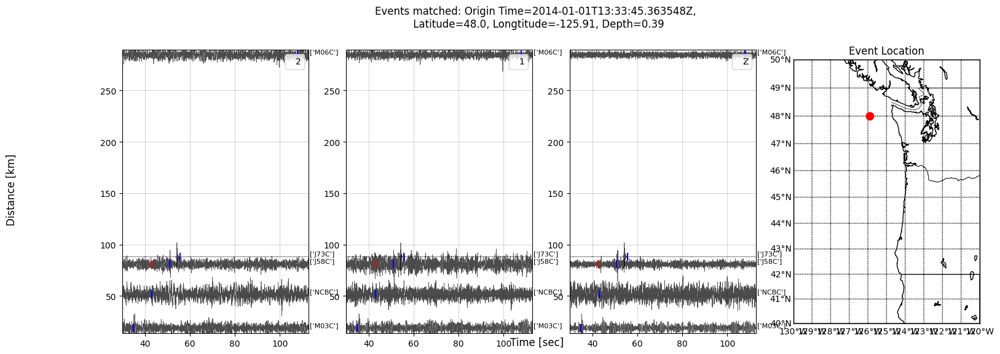

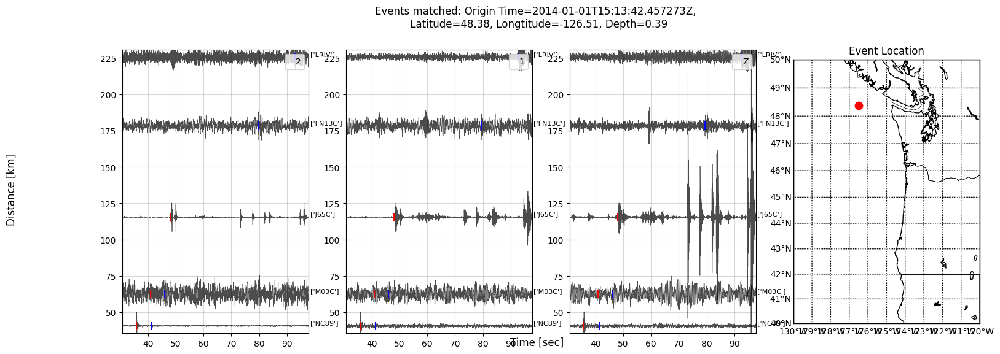

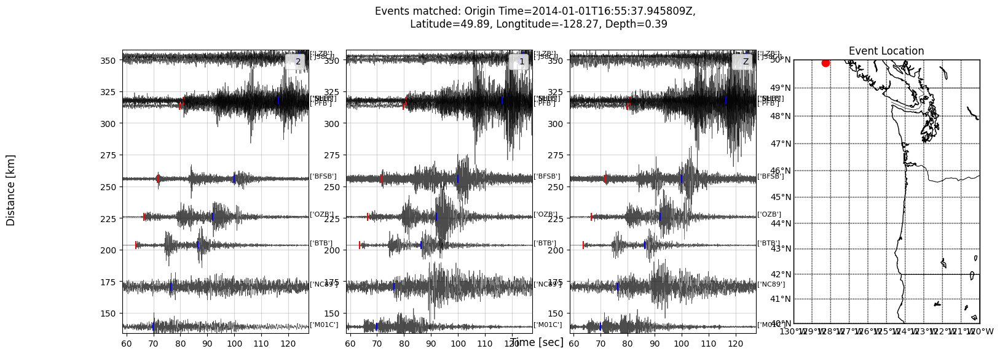

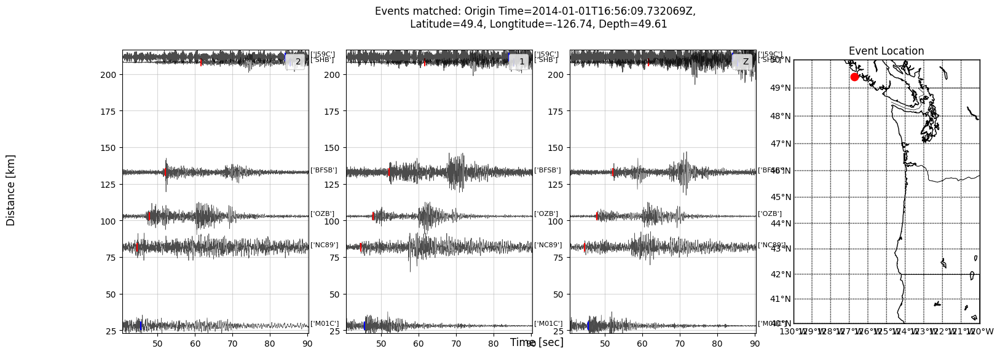

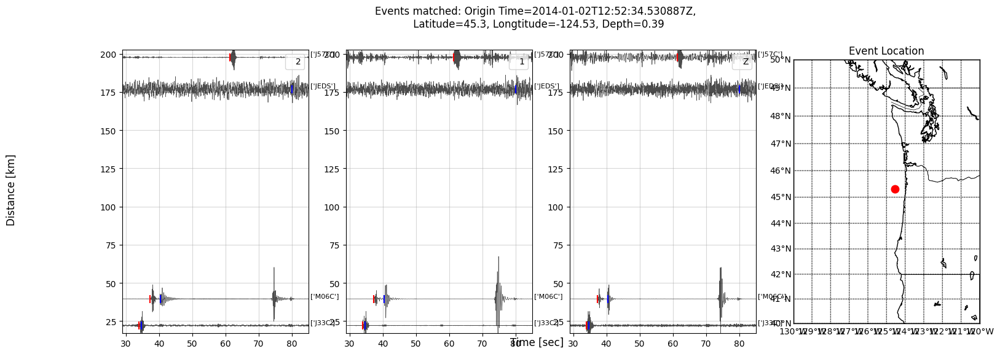

...

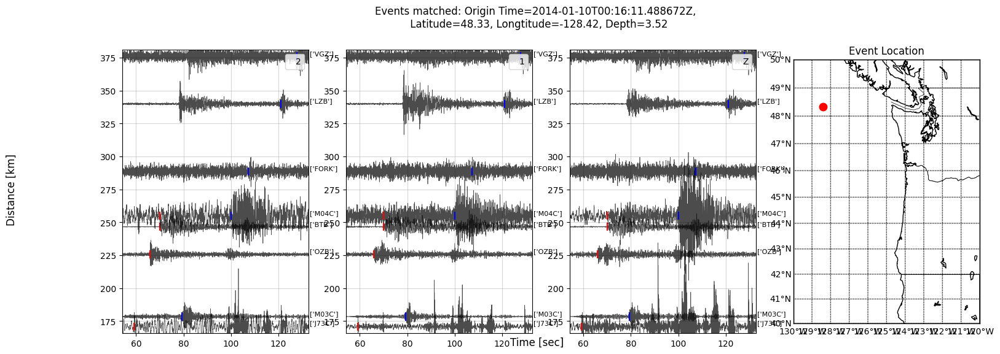

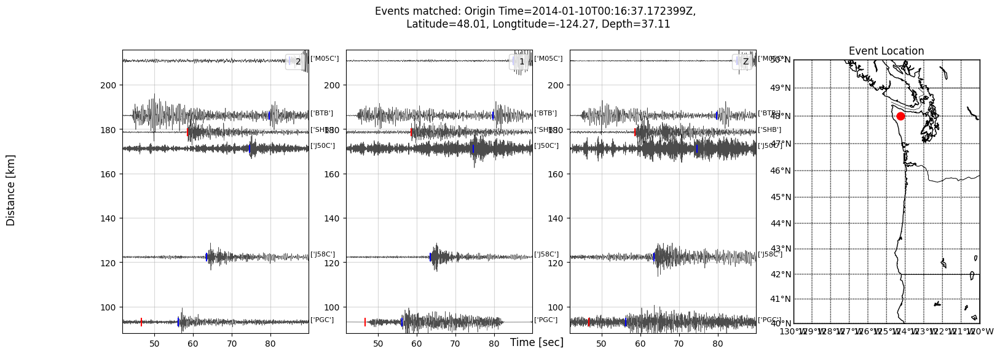

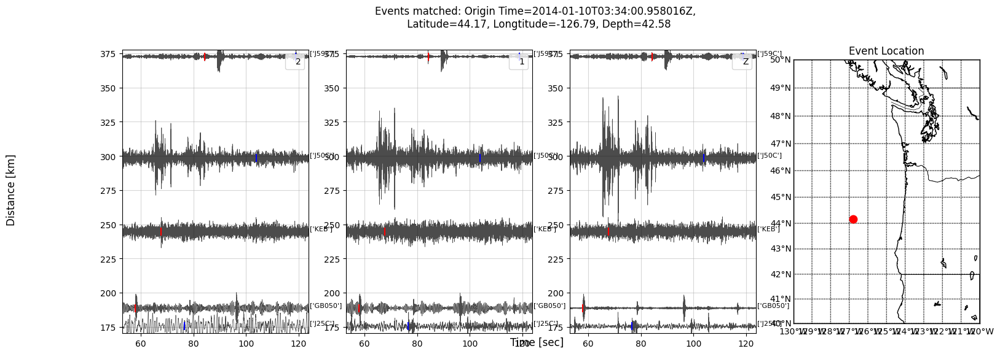

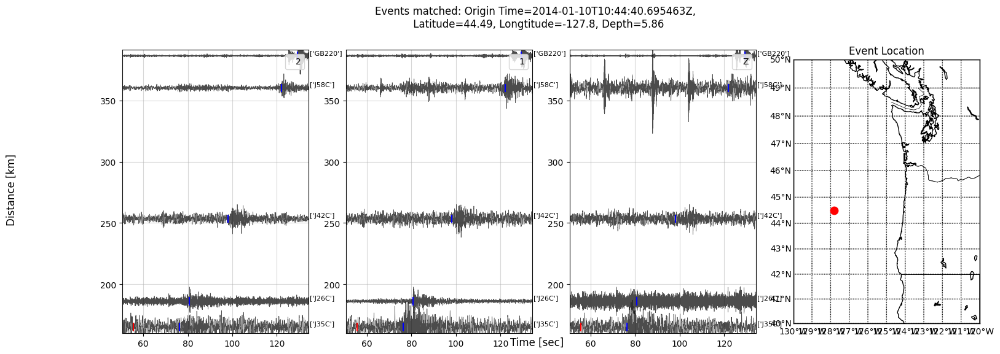

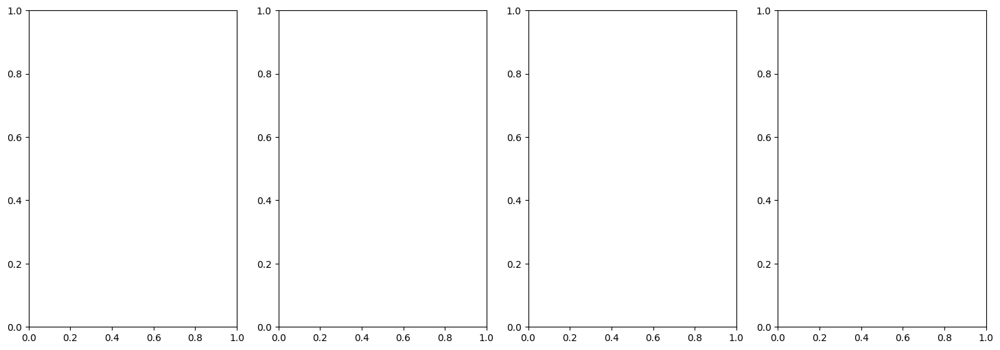

In [22]:
# parameters for subplots_cluster_scale
mycatalog= mycatalog
mycatalog_picks=mycatalog_picks
networks= all_picks_networks
channel= "?H?"
idx_sta= 50
title= "Events matched"
fig_title= "new_events_filtered_44N_and_above_plots.pdf"

subplots_cluster_scale(new_events_44N_and_above,mycatalog_picks,networks,channel,idx_sta,title,fig_title)

## Plot one of the cluster events at around 46.5&deg; N, 125&deg; W using the plotting functions 

In [ ]:
def subplots_cluster_scale_p(idx, mycatalog, mycatalog_picks, networks, channel, idx_sta, title, fig_title):
    """
    idx: event_idx
    mycatalog: dataframe that contains only the unique picks (i.e., mycatalog_picks.drop_duplicates(subset=['idx']).copy())
    mycatalog_picks: all pick assignments csv file (e.g., pd.read_csv('../data/datasets_OR/all_pick_assignments_OR.csv'))
    networks: string of networks (e.g., "NV,OO,7A")
    channel: specify the direction of the channel (i.e., "?HZ", "?HE" or "?HN")
    idx_sta: choose the station to which you want to show the waveforms
    title: title in a string
    fig_title: figure title in as string
    """
        
    # Define the clients 
    client_waveform = WaveformClient()
    client2 = Client("IRIS")
    client_ncedc = Client('NCEDC')


    # Plot the earthquake moveout for one of the unmatched events for all stations 
    event = mycatalog
    picks = mycatalog_picks
    picks_idx = picks.loc[picks['idx']==idx]
    pick_sta = np.unique(picks_idx['station'])
    
    otime = UTCDateTime(str(event[event['idx'] == idx]["datetime"].values[0]))
    distances = []
    max_dist = 10
    min_dist = 0
    
    print(event[event['idx'] == idx]['picks'].values[0])
    for station in pick_sta:
        
        
        sta_inv = client2.get_stations(network=networks,
                                       station=station, channel="?H?", 
                                       starttime=otime - 1e8, endtime=otime + 1e8,level="response")
        if len(sta_inv) == 0:
#             print(f"Failed to fetch for {networks} {station} {otime}")
            continue
            
        _network = sta_inv[0].code
        slat = sta_inv[0][0].latitude
        slon = sta_inv[0][0].longitude
        olat = event.loc[event['idx']==idx, 'latitude'].values[0]
        olon = event.loc[event['idx']==idx, 'longitude'].values[0]
        
        dis1 = locations2degrees(olat, olon, slat, slon)
        dist = degrees2kilometers(dis1)
#         if max_dist < dist:
#             max_dist = dist
            
#         if min_dist > dist:
#             min_dist = dist
            
        distances.append([None, _network, station, dist])

    # Sort distances
    distances = sorted(distances, key=lambda item: item[-1])
    distances = distances[:idx_sta+1]
    
    # Set up to define the xlim and ylim
    max_y = 0
    min_y = 0
    # This count is for the if statements. Only used to ensure that min_y_count 
    #is changed from 0 to either the first positive value of the distance of one of the stations from the event
    min_y_count = 0 
    
    max_x = 0
    min_x = 0
    
    # This count is for the if statements. Only used to ensure that min_x_count 
    #is changed from 0 to either the first positive value of P pick time or the first positive value of S pick time
    min_x_count= 0
    # Create a figure
    fig,axs = plt.subplots(1,4,figsize=(18,6))
    gs = fig.add_gridspec(3, hspace=0, figure=fig)
#     axs = gs.subplots(sharex=True, sharey=True)
    starttime = otime -30
    endtime = otime + 120
    
    # Define texts
    texts = []
    
    for i, ii in enumerate(distances):
            
        if ii[1] in ['NC', 'BK']:
            # Query waveforms
            st = client_ncedc.get_waveforms(network=ii[1], station=ii[2], location="*", channel=channel,starttime=starttime, endtime=endtime)

        elif ii[1] in networks: 
            st = client_waveform.get_waveforms(network=ii[1], station=ii[2], channel=channel,starttime=starttime, endtime=endtime)
  
        else: 
            st =  Stream()
            print(f"WARNING: No data for {ii[1]}.{ii[2]}.{channel} on {otime}.")    
            continue
            
#         print(f"len(st):{len(st)}")
#         print(st)
    
        # Skip empty traces
        if len(st) == 0:
                continue
                
        sta_picks = picks_idx[picks_idx['station'] == ii[2]]
        p_picks = sta_picks.loc[sta_picks['phase'] == 'P']
        s_picks = sta_picks.loc[sta_picks['phase'] == 'S']
#         print(len(p_picks),len(s_picks))
        
        # Define the xlim values
        # Define the maximum x value
        if len(s_picks) > 0:
            if max_x < UTCDateTime(s_picks.iloc[0]['time_pick']) - starttime:
                max_x = UTCDateTime(s_picks.iloc[0]['time_pick']+5) - starttime
        elif len(p_picks) > 0:
            if max_x < UTCDateTime(p_picks.iloc[0]['time_pick']) - starttime: 
                max_x = UTCDateTime(p_picks.iloc[0]['time_pick']+5) - starttime
        else:
            print('No picks for this station. Skipping.')
            continue 
            
        # Define the minimum x value
        if len(p_picks) > 0:
            if min_x_count == 0:
                if min_x < UTCDateTime(p_picks.iloc[0]['time_pick']) - starttime:
                    min_x = UTCDateTime(p_picks.iloc[0]['time_pick']-5) - starttime
                    min_x_count += 1           
            else:
                if min_x >= UTCDateTime(p_picks.iloc[0]['time_pick']) - starttime:
                    min_x = UTCDateTime(p_picks.iloc[0]['time_pick']-5) - starttime            
        elif len(s_picks) > 0:
            if min_x_count == 0:
                if min_x < UTCDateTime(s_picks.iloc[0]['time_pick'])- starttime:
                    min_x = UTCDateTime(s_picks.iloc[0]['time_pick']-5)- starttime
                    min_x_count += 1                
            else:
                if min_x >= UTCDateTime(s_picks.iloc[0]['time_pick'])- starttime:
                    min_x = UTCDateTime(s_picks.iloc[0]['time_pick']-5) - starttime
        else:
            print('No picks for this station. Skipping.')
            continue    
            
        if len(p_picks) == 0:
            continue
            
#         print('This is after the p_pick continue statement')
    
        # Define ylim values
        if min_y_count == 0:
            if min_y < ii[3]:
                min_y = ii[3] - 5
                min_y_count += 1           
        else:
            if min_y >= ii[3]:
                min_y = ii[3] - 5 
                
        max_y = ii[3] + 5
        
    scaling_factor = (1/2)*(max_y-min_y)   
        
    for i, ii in enumerate(distances):
            
        if ii[1] in ['NC', 'BK']:
            # Query waveforms
            st = client_ncedc.get_waveforms(network=ii[1], station=ii[2], location="*", channel=channel,starttime=starttime, endtime=endtime)

        elif ii[1] in networks: 
            st = client_waveform.get_waveforms(network=ii[1], station=ii[2], channel=channel,starttime=starttime, endtime=endtime)
  
        else: 
            st =  Stream()
            print(f"WARNING: No data for {ii[1]}.{ii[2]}.{channel} on {otime}.")    
            continue
            
#         print(f"len(st):{len(st)}")
#         print(st)
    
        # Skip empty traces
        if len(st) == 0:
                continue
        _st = Stream()
        # Check for HH and BH channels presence
        has_HH = bool(st.select(channel="HH?"))
        has_BH = bool(st.select(channel="BH?"))

        # Apply selection logic based on channel presence
        if has_HH and has_BH:
            # If both HH and BH channels are present, select only HH
            _st += st.select(channel="HH?")
        elif has_HH:
            # If only HH channels are present
            _st += st.select(channel="HH?")
        elif has_BH:
            # If only BH channels are present
            _st += st.select(channel="BH?")

        st = _st

        print(f'Second st print:{_st}')
              
        st = Stream(filter(lambda st: st.stats.sampling_rate > 10, st))
        st.taper(max_percentage=0.05)
        st.filter(type='bandpass', freqmin=2, freqmax=25)
        st.merge(fill_value='interpolate') # fill gaps if there are any.

#         print(st)
        # Select only one trace per channel
        unique_channels = set(tr.stats.channel for tr in st)
        selected_traces = []
        
        for ch in unique_channels:
            selected_traces.append(next(tr for tr in st if tr.stats.channel == ch))
        st = Stream(selected_traces)
                   
        trim_st = st.copy()
        sta_picks = picks_idx[picks_idx['station'] == ii[2]]
        p_picks = sta_picks.loc[sta_picks['phase'] == 'P']
        s_picks = sta_picks.loc[sta_picks['phase'] == 'S']
#         print(len(p_picks),len(s_picks))
        
        
                
            
        if len(p_picks) == 0:
            continue 
#         print('This is after the p_pick continue statement')
        print(trim_st)
        
        for iax in range(len(trim_st)):
            print(iax)
            sampling_rate = trim_st[iax].stats.sampling_rate
            trim_st = trim_st.normalize()
            
            tp = UTCDateTime(p_picks.iloc[0]['time_pick']) - otime + 30
            i1 = int((tp-5)*sampling_rate)
            i2 = int((tp+15)*sampling_rate)

            offsets1 = ii[3]
            try: 
                wave = trim_st[iax].data
                wave = wave / (np.nanmax(wave[i1:i2], axis=-1)*10)
            except:
                continue 
            
#             print(trim_st[iax].stats.sampling_rate)
            axs[iax].plot(trim_st[iax].times(), wave * scaling_factor + offsets1, 
                          color='black', label=f"{trim_st[iax].stats.channel}", alpha=0.7, lw=0.5)
#             axs[iax].plot(trim_st[iax].times(), wave * 30 + offsets1, color='black', label=f"{trim_st[iax].stats.channel}", alpha=0.7, lw=0.5)

#             axs[iax].text(xlim[-1] + 2,   offsets1, 
#                               [ii[2]], fontsize=8, verticalalignment='bottom')

            if len(p_picks) > 0:
                axs[iax].vlines(UTCDateTime(p_picks.iloc[0]['time_pick']) - otime + 30, offsets1 - (1/35) * scaling_factor, 
                                offsets1 + (1/35) * scaling_factor, color='r')
            if len(s_picks) > 0:
                axs[iax].vlines(UTCDateTime(s_picks.iloc[0]['time_pick']) - otime + 30, offsets1 - (1/35) * scaling_factor, 
                                offsets1 + (1/35) * scaling_factor, color='b')
        texts.append([ii[2],ii[3]])

    
#     print(max_y,min_y)
    chs = ['2','1','Z']
    for iax in range(3):
        for i, ii in enumerate(texts):
            offsets1 = ii[1]
            axs[iax].text(max_x + 0.5, offsets1, 
                                  [ii[0]], fontsize=8, verticalalignment='bottom')
        axs[iax].legend(chs[iax],loc='upper right', handlelength=0)
        axs[iax].set_ylim([min_y,max_y])
        axs[iax].set_xlim([min_x,max_x])
        axs[iax].grid(alpha=0.5)
    fig.supxlabel('Time [sec]', y=0.07)
    fig.supylabel('Distance [km]')
    fig.suptitle(f"{title}: Origin Time={otime}, \n Latitude={round(event[event['idx']==idx]['latitude'].values[0], 2)}, Longtitude={round(event[event['idx']==idx]['longitude'].values[0], 2)}, Depth={round(event[event['idx']==idx]['depth'].values[0], 2)}", y=1)
    
    m = Basemap(projection='merc', llcrnrlat=40, urcrnrlat=50, llcrnrlon=-130, urcrnrlon=-120, resolution='i', ax=axs[3])
    m.drawcoastlines()
    m.drawcountries()
    m.drawstates()
    m.drawmapboundary()
    m.drawparallels(np.arange(40, 51, 1), labels=[1,0,0,0])
    m.drawmeridians(np.arange(-130, -119, 1), labels=[0,0,0,1])
    x, y = m(event[event['idx']==idx]['longitude'].values[0], event[event['idx']==idx]['latitude'].values[0])
    m.plot(x, y, 'ro', markersize=9)
    axs[3].set_title('Event Location')
    
    plt.show()


In [ ]:
def subplots_cluster_scale(idx, mycatalog, mycatalog_picks, networks, channel, idx_sta, title, fig_title):
    """
    idx: event_idx
    mycatalog: dataframe that contains only the unique picks (i.e., mycatalog_picks.drop_duplicates(subset=['idx']).copy())
    mycatalog_picks: all pick assignments csv file (e.g., pd.read_csv('../data/datasets_OR/all_pick_assignments_OR.csv'))
    networks: string of networks (e.g., "NV,OO,7A")
    channel: specify the direction of the channel (i.e., "?HZ", "?HE" or "?HN")
    idx_sta: choose the station to which you want to show the waveforms
    title: title in a string
    fig_title: figure title in as string
    """
        
    # Define the clients 
    client_waveform = WaveformClient()
    client2 = Client("IRIS")
    client_ncedc = Client('NCEDC')


    # Plot the earthquake moveout for one of the unmatched events for all stations 
    event = mycatalog
    picks = mycatalog_picks
    
    p = PdfPages(fig_title) 
    
    for idx in event['idx']:
        
        picks_idx = picks.loc[picks['idx']==idx]
        pick_sta = np.unique(picks_idx['station'])

        otime = UTCDateTime(str(event[event['idx'] == idx]["datetime"].values[0]))
        distances = []
        max_dist = 10
        min_dist = 0

        print(event[event['idx'] == idx]['picks'].values[0])
        for station in pick_sta:


            sta_inv = client2.get_stations(network=networks,
                                           station=station, channel="?H?", 
                                           starttime=otime - 1e8, endtime=otime + 1e8,level="response")
            if len(sta_inv) == 0:
    #             print(f"Failed to fetch for {networks} {station} {otime}")
                continue

            _network = sta_inv[0].code
            slat = sta_inv[0][0].latitude
            slon = sta_inv[0][0].longitude
            olat = event.loc[event['idx']==idx, 'latitude'].values[0]
            olon = event.loc[event['idx']==idx, 'longitude'].values[0]

            dis1 = locations2degrees(olat, olon, slat, slon)
            dist = degrees2kilometers(dis1)
    #         if max_dist < dist:
    #             max_dist = dist

    #         if min_dist > dist:
    #             min_dist = dist

            distances.append([None, _network, station, dist])

        # Sort distances
        distances = sorted(distances, key=lambda item: item[-1])
        distances = distances[:idx_sta+1]

        # Set up to define the xlim and ylim
        max_y = 0
        min_y = 0
        # This count is for the if statements. Only used to ensure that min_y_count 
        #is changed from 0 to either the first positive value of the distance of one of the stations from the event
        min_y_count = 0 

        max_x = 0
        min_x = 0

        # This count is for the if statements. Only used to ensure that min_x_count 
        #is changed from 0 to either the first positive value of P pick time or the first positive value of S pick time
        min_x_count= 0
        # Create a figure
        fig,axs = plt.subplots(1,4,figsize=(18,6))
        gs = fig.add_gridspec(3, hspace=0, figure=fig)
    #     axs = gs.subplots(sharex=True, sharey=True)
        starttime = otime -30
        endtime = otime + 120

        # Define texts
        texts = []

        for i, ii in enumerate(distances):

            if ii[1] in ['NC', 'BK']:
                # Query waveforms
                st = client_ncedc.get_waveforms(network=ii[1], station=ii[2], location="*", channel=channel,starttime=starttime, endtime=endtime)

            elif ii[1] in networks: 
                st = client_waveform.get_waveforms(network=ii[1], station=ii[2], channel=channel,starttime=starttime, endtime=endtime)

            else: 
                st =  Stream()
                print(f"WARNING: No data for {ii[1]}.{ii[2]}.{channel} on {otime}.")    
                continue

    #         print(f"len(st):{len(st)}")
    #         print(st)

            # Skip empty traces
            if len(st) == 0:
                    continue

            sta_picks = picks_idx[picks_idx['station'] == ii[2]]
            p_picks = sta_picks.loc[sta_picks['phase'] == 'P']
            s_picks = sta_picks.loc[sta_picks['phase'] == 'S']
    #         print(len(p_picks),len(s_picks))

            # Define the xlim values
            # Define the maximum x value
            if len(s_picks) > 0:
                if max_x < UTCDateTime(s_picks.iloc[0]['time_pick']) - starttime:
                    max_x = UTCDateTime(s_picks.iloc[0]['time_pick']+5) - starttime
            elif len(p_picks) > 0:
                if max_x < UTCDateTime(p_picks.iloc[0]['time_pick']) - starttime: 
                    max_x = UTCDateTime(p_picks.iloc[0]['time_pick']+5) - starttime
            else:
                print('No picks for this station. Skipping.')
                continue 

            # Define the minimum x value
            if len(p_picks) > 0:
                if min_x_count == 0:
                    if min_x < UTCDateTime(p_picks.iloc[0]['time_pick']) - starttime:
                        min_x = UTCDateTime(p_picks.iloc[0]['time_pick']-5) - starttime
                        min_x_count += 1           
                else:
                    if min_x >= UTCDateTime(p_picks.iloc[0]['time_pick']) - starttime:
                        min_x = UTCDateTime(p_picks.iloc[0]['time_pick']-5) - starttime            
            elif len(s_picks) > 0:
                if min_x_count == 0:
                    if min_x < UTCDateTime(s_picks.iloc[0]['time_pick'])- starttime:
                        min_x = UTCDateTime(s_picks.iloc[0]['time_pick']-5)- starttime
                        min_x_count += 1                
                else:
                    if min_x >= UTCDateTime(s_picks.iloc[0]['time_pick'])- starttime:
                        min_x = UTCDateTime(s_picks.iloc[0]['time_pick']-5) - starttime
            else:
                print('No picks for this station. Skipping.')
                continue    

    #         if len(p_picks) == 0:
    #             continue

    #         print('This is after the p_pick continue statement')

            # Define ylim values
            if min_y_count == 0:
                if min_y < ii[3]:
                    min_y = ii[3] - 5
                    min_y_count += 1           
            else:
                if min_y >= ii[3]:
                    min_y = ii[3] - 5 

            max_y = ii[3] + 5

        scaling_factor = (1/2)*(max_y-min_y)   

        for i, ii in enumerate(distances):

            if ii[1] in ['NC', 'BK']:
                # Query waveforms
                st = client_ncedc.get_waveforms(network=ii[1], station=ii[2], location="*", channel=channel,starttime=starttime, endtime=endtime)

            elif ii[1] in networks: 
                st = client_waveform.get_waveforms(network=ii[1], station=ii[2], channel=channel,starttime=starttime, endtime=endtime)

            else: 
                st =  Stream()
                print(f"WARNING: No data for {ii[1]}.{ii[2]}.{channel} on {otime}.")    
                continue

    #         print(f"len(st):{len(st)}")
    #         print(st)

            # Skip empty traces
            if len(st) == 0:
                    continue
            _st = Stream()
            # Check for HH and BH channels presence
            has_HH = bool(st.select(channel="HH?"))
            has_BH = bool(st.select(channel="BH?"))

            # Apply selection logic based on channel presence
            if has_HH and has_BH:
                # If both HH and BH channels are present, select only HH
                _st += st.select(channel="HH?")
            elif has_HH:
                # If only HH channels are present
                _st += st.select(channel="HH?")
            elif has_BH:
                # If only BH channels are present
                _st += st.select(channel="BH?")

            st = _st

            print(f'Second st print:{_st}')

            st = Stream(filter(lambda st: st.stats.sampling_rate > 10, st))
            st.taper(max_percentage=0.05)
            st.filter(type='bandpass', freqmin=2, freqmax=25)
            st.merge(fill_value='interpolate') # fill gaps if there are any.

    #         print(st)
            # Select only one trace per channel
            unique_channels = set(tr.stats.channel for tr in st)
            selected_traces = []

            for ch in unique_channels:
                selected_traces.append(next(tr for tr in st if tr.stats.channel == ch))
            st = Stream(selected_traces)

            trim_st = st.copy()
            sta_picks = picks_idx[picks_idx['station'] == ii[2]]
            p_picks = sta_picks.loc[sta_picks['phase'] == 'P']
            s_picks = sta_picks.loc[sta_picks['phase'] == 'S']
    #         print(len(p_picks),len(s_picks))




    #         if len(p_picks) == 0:
    #             continue 
    #         print('This is after the p_pick continue statement')
            print(trim_st)

            for iax in range(len(trim_st)):
                print(iax)
                sampling_rate = trim_st[iax].stats.sampling_rate
                trim_st = trim_st.normalize()

                if len(p_picks)>0:
                    tp = UTCDateTime(p_picks.iloc[0]['time_pick']) - otime + 30
                    i1 = int((tp-5)*sampling_rate)
                    i2 = int((tp+15)*sampling_rate)
                elif len(s_picks)>0:
                    ts = UTCDateTime(s_picks.iloc[0]['time_pick']) - otime + 30
                    i1 = int((ts-10)*sampling_rate)
                    i2 = int((ts+10)*sampling_rate)
                else:
                    print(f"WARNING: No pick time for {ii[1]}.{ii[2]}.{channel} on {otime}.")

                offsets1 = ii[3]
                try: 
                    wave = trim_st[iax].data
                    wave = wave / (np.nanmax(wave[i1:i2], axis=-1)*10)
                except:
                    continue 

    #             print(trim_st[iax].stats.sampling_rate)
                axs[iax].plot(trim_st[iax].times(), wave * scaling_factor + offsets1, 
                              color='black', label=f"{trim_st[iax].stats.channel}", alpha=0.7, lw=0.5)
    #             axs[iax].plot(trim_st[iax].times(), wave * 30 + offsets1, color='black', label=f"{trim_st[iax].stats.channel}", alpha=0.7, lw=0.5)

    #             axs[iax].text(xlim[-1] + 2,   offsets1, 
    #                               [ii[2]], fontsize=8, verticalalignment='bottom')

                if len(p_picks) > 0:
                    axs[iax].vlines(UTCDateTime(p_picks.iloc[0]['time_pick']) - otime + 30, offsets1 - (1/35) * scaling_factor, 
                                    offsets1 + (1/35) * scaling_factor, color='r')
                if len(s_picks) > 0:
                    axs[iax].vlines(UTCDateTime(s_picks.iloc[0]['time_pick']) - otime + 30, offsets1 - (1/35) * scaling_factor, 
                                    offsets1 + (1/35) * scaling_factor, color='b')
            texts.append([ii[2],ii[3]])


    #     print(max_y,min_y)
        chs = ['2','1','Z']
        for iax in range(3):
            for i, ii in enumerate(texts):
                offsets1 = ii[1]
                axs[iax].text(max_x + 0.5, offsets1, 
                                      [ii[0]], fontsize=8, verticalalignment='bottom')
            axs[iax].legend(chs[iax],loc='upper right', handlelength=0)
            axs[iax].set_ylim([min_y,max_y])
            axs[iax].set_xlim([min_x,max_x])
            axs[iax].grid(alpha=0.5)
        fig.supxlabel('Time [sec]', y=0.07)
        fig.supylabel('Distance [km]')
        fig.suptitle(f"{title}: Origin Time={otime}, \n Latitude={round(event[event['idx']==idx]['latitude'].values[0], 2)}, Longtitude={round(event[event['idx']==idx]['longitude'].values[0], 2)}, Depth={round(event[event['idx']==idx]['depth'].values[0], 2)}", y=1)

        m = Basemap(projection='merc', llcrnrlat=40, urcrnrlat=50, llcrnrlon=-130, urcrnrlon=-120, resolution='i', ax=axs[3])
        m.drawcoastlines()
        m.drawcountries()
        m.drawstates()
        m.drawmapboundary()
        m.drawparallels(np.arange(40, 51, 1), labels=[1,0,0,0])
        m.drawmeridians(np.arange(-130, -119, 1), labels=[0,0,0,1])
        x, y = m(event[event['idx']==idx]['longitude'].values[0], event[event['idx']==idx]['latitude'].values[0])
        m.plot(x, y, 'ro', markersize=9)
        axs[3].set_title('Event Location')
        
        fig.savefig(p, format='pdf')  

    p.close()

### Specify the latitudes and longitudes

In [ ]:
new_events = pd.read_csv('../data/datasets_2014/new_events.csv')

In [ ]:
idx = new_events[new_events['station']=='J25B']['idx'].values
idx

In [ ]:
new_events = new_events[new_events["idx"].isin(idx)]
new_events

In [ ]:
new_events_specific_lat_lon = new_events.loc[(new_events['latitude']>46)&(new_events['latitude']<47.5)&(new_events['longitude']<-124)&(new_events['longitude']>-126)]
new_events_specific_lat_lon

In [ ]:
# new_events = new_events_specific_lat_lon.loc[(new_events_specific_lat_lon['depth']>1)&(new_events_specific_lat_lon['depth']<40)]
new_events = new_events_specific_lat_lon.loc[new_events_specific_lat_lon['picks']>=6][0:30]
new_events

### Histogram: Depths of events

In [ ]:
# Plot the histogram of the number of picks for the matched events
plt.figure()
bins = np.linspace(0,50,25)
plt.hist(new_events['depth'],bins=bins)
plt.xlabel('Depth (km)')
plt.ylabel('Number of Events')
plt.title('Histogram of the depths of the events in the cluster at ~46.5$^\circ$ N')

### Plot HH?

In [ ]:
# parameters
mycatalog= mycatalog
mycatalog_picks=mycatalog_picks
networks= all_picks_networks
channel= "HH?"
idx_sta= 50
title= "Events matched"
fig_title= "events_matched.png"
ylim= [0,300]
xlim= [30,45]

for idx in new_events['idx']:
    subplots_cluster_scale_p(idx,mycatalog,mycatalog_picks,networks,channel,idx_sta,title,fig_title,ylim,xlim)

### Plot BH?

In [ ]:
# parameters
mycatalog= mycatalog
mycatalog_picks=mycatalog_picks
networks= all_picks_networks
channel= "BH?"
idx_sta= 50
title= "Events matched"
fig_title= "events_matched.png"
ylim= [0,300]
xlim= [30,45]

for idx in new_events['idx']:
    subplots_cluster_scale_p(idx,mycatalog,mycatalog_picks,networks,channel,idx_sta,title,fig_title,ylim,xlim)

### Plot both HH? and BH?

In [ ]:
new_events['datetime'] = pd.to_datetime(new_events['datetime'], utc = True)
new_events

In [ ]:
# parameters for subplots_cluster_scale_p
mycatalog= mycatalog
mycatalog_picks=mycatalog_picks
networks= all_picks_networks
channel= "?H?"
idx_sta= 50
title= "Events matched"
fig_title= "events_matched.png"

for idx in new_events['idx']:
    subplots_cluster_scale_p(idx,new_events,mycatalog_picks,networks,channel,idx_sta,title,fig_title)

In [ ]:
# parameters for subplots_cluster_scale
mycatalog= mycatalog
mycatalog_picks=mycatalog_picks
networks= all_picks_networks
channel= "?H?"
idx_sta= 50
title= "Events matched"
fig_title= "new_events_plots.pdf"

subplots_cluster_scale(new_events,mycatalog_picks,networks,channel,idx_sta,title,fig_title)

In [ ]:
# Plot the histogram of the number of picks for the matched events
new_events['time'] = pd.to_datetime(new_events['time'])
year1 = 2012
time1 = datetime(year=year1, month=1, day=1)
time2 = datetime(year=year1 + 1, month=1, day=1)
time_bins = pd.date_range(start=time1, end=time2, freq='5D')
plt.figure()
plt.hist(new_events['time'], bins=time_bins)
plt.xlabel('Days')
plt.ylabel('Number of Events')
plt.title('Histogram for the frequency of the events in the cluster at ~46.5$^\circ$ N')
plt.xticks(rotation=45)  # Optional: Rotate x-axis labels for better readability
plt.show()

In [ ]:
import matplotlib 
from matplotlib import pyplot as plt 
from matplotlib.backends.backend_pdf import PdfPages 

# customizing runtime configuration stored 
# in matplotlib.rcParams 
plt.rcParams["figure.figsize"] = [7.00, 3.50] 
plt.rcParams["figure.autolayout"] = True

fig1 = plt.figure() 
plt.plot([17, 45, 7, 8, 7], color='orange') 

fig2 = plt.figure() 
plt.plot([13, 25, 1, 6, 3], color='blue') 

Fig3 = plt.figure() 
plt.plot([22, 11, 2, 1, 23], color='green') 


def save_image(filename): 
	
	# PdfPages is a wrapper around pdf 
	# file so there is no clash and create 
	# files with no error. 
	p = PdfPages(filename) 
	
	# get_fignums Return list of existing 
	# figure numbers 
	fig_nums = plt.get_fignums() 
	figs = [plt.figure(n) for n in fig_nums] 
	
	# iterating over the numbers in list 
	for fig in figs: 
		
		# and saving the files 
		fig.savefig(p, format='pdf') 
	
	# close the object 
	p.close() 

# name your Pdf file 
filename = "multi_plot_image.pdf"

# call the function 
save_image(filename) 


## Plot the cluster events at around 43.25&deg; N, 124.25&deg; W using the plotting functions 

In [ ]:
new_events_specific_lat_lon = unmatched_events_mycatalog2morton_and_anss.loc[(unmatched_events_mycatalog2morton_and_anss['latitude']>43.0)&(unmatched_events_mycatalog2morton_and_anss['latitude']<43.3)&(unmatched_events_mycatalog2morton_and_anss['longitude']<-124.25)&(unmatched_events_mycatalog2morton_and_anss['longitude']>-124.75)]
new_events_specific_lat_lon

In [ ]:
new_events = new_events_specific_lat_lon.loc[new_events_specific_lat_lon['picks']>5]
new_events

### Plot HH?

In [ ]:
# parameters
mycatalog= mycatalog
mycatalog_picks=mycatalog_picks
networks= all_picks_networks
channel= "HH?"
idx_sta= 50
title= "Events matched"
fig_title= "events_matched.png"
ylim= [0,300]
xlim= [20,150]

for idx in new_events['idx']:
    subplots_cluster_scale_p(idx,mycatalog,mycatalog_picks,networks,channel,idx_sta,title,fig_title,ylim,xlim)

### Plot BH?

In [ ]:
# parameters
mycatalog= mycatalog
mycatalog_picks=mycatalog_picks
networks= all_picks_networks
channel= "BH?"
idx_sta= 50
title= "Events matched"
fig_title= "events_matched.png"
ylim= [0,300]
xlim= [20,150]

for idx in new_events['idx']:
    subplots_cluster_scale_p(idx,mycatalog,mycatalog_picks,networks,channel,idx_sta,title,fig_title,ylim,xlim)

## Calculate SNRs

In [ ]:
all_picks = pd.read_csv('../data/datasets_2014/all_picks_2014.csv')
all_pick_assignments = pd.read_csv('../data/datasets_2014/all_pick_assignments_2014.csv')

In [ ]:
def calc_snr(all_picks,all_pick_assignments):
    """ 
    This function calculates the SNRs for each station in each event.
    
    Inputs:
    1. The all_pick.csv file from the 2_format_pick2associate file.
    2. The all_pick_assignments.csv file from the 3_association file.
    
    Oututs:
    The new all_pick_assignments_snr file with the additional SNR column.
    """
    
    # Create the list of networks
    all_picks_networks = all_picks['station_network_code'].drop_duplicates()
    list_networks = list(all_picks_networks)
    networks = ','.join(all_picks_networks)
    
    
    
    # Define the clients 
    client_waveform = WaveformClient()
    client2 = Client("IRIS")
    client_ncedc = Client('NCEDC')
    
    all_pick_assignments['datetime'] = pd.to_datetime(all_pick_assignments['time'], utc = True)

    
    # Define parameters
    percentile=98
    
    # Create empty lists
    snr_list = []
        
    # Make sure if a station for an event has more than 1 P or S pick
    for idx in all_pick_assignments['idx'].drop_duplicates():
        # Define parameters
        otime = UTCDateTime(str(all_pick_assignments[all_pick_assignments['idx'] == idx]["datetime"].values[0]))


        # Create empty lists
        networks_stas = []

        # Plot the earthquake moveout for one of the unmatched events for all stations 
    #     event = mycatalog
        pick_idx = all_pick_assignments.loc[all_pick_assignments['idx']==idx]
        pick_sta = np.unique(pick_idx['station'])
        
    #     distances = []
    #     max_dist = 10
    #     min_dist = 0
        for station in pick_sta:

            sta_inv = client2.get_stations(network=networks,
                                           station=station, channel="?H?", 
                                           starttime=otime - 1e8, endtime=otime + 1e8,level="response")
            if len(sta_inv) == 0:
                print(f'No inventory for station {station}. Skipping.')
                continue

            network = sta_inv[0].code
    #         slat = sta_inv[0][0].latitude
    #         slon = sta_inv[0][0].longitude
    #         olat = event.loc[event['idx']==idx, 'latitude'].values[0]
    #         olon = event.loc[event['idx']==idx, 'longitude'].values[0]

    #         dis1 = locations2degrees(olat, olon, slat, slon)
    #         dist = degrees2kilometers(dis1)
    # #         if max_dist < dist:
    # #             max_dist = dist

    # #         if min_dist > dist:
    # #             min_dist = dist

            networks_stas.append([network,station])
        
   
        events = all_pick_assignments[all_pick_assignments['idx']==idx]
        for i in networks_stas:
            events1 = events[events['station']==i[1]]
            p_picks = events1[events1['phase']=='P']
            s_picks = events1[events1['phase']=='S']
            

            if len(p_picks)>0 and len(s_picks)>0:
                print(p_picks['datetime'].values,s_picks['datetime'].values)
                p_pick_time = UTCDateTime(str(p_picks['datetime'].values[0]))
                s_pick_time = UTCDateTime(str(s_picks['datetime'].values[0]))
                
                starttime_st = UTCDateTime(p_pick_time)-timedelta(seconds=120)
                endtime_st = UTCDateTime(p_pick_time)+timedelta(seconds=120)
                
                starttime_noise = UTCDateTime(p_pick_time)-timedelta(seconds=8)
                endtime_noise = UTCDateTime(p_pick_time)
                
                starttime_signal = UTCDateTime(s_pick_time)-timedelta(seconds=1)
                endtime_signal = UTCDateTime(s_pick_time)+timedelta(seconds=2)
                
                print(starttime_noise,endtime_noise)
            
                if i[0] in ['NC', 'BK']:
                # Query waveforms
                    st = client_ncedc.get_waveforms(network=i[0], station=i[1],
                                                    location="*", channel="?HZ",starttime=starttime_st,
                                                    endtime=endtime_st)

                elif i[0] in networks: 
                    st = client_waveform.get_waveforms(network=i[0], station=i[1],
                                                       channel='?HZ',starttime=starttime_st, endtime=endtime_st)

                else: 
                    st =  Stream()
                    print(f"WARNING: No data for {ii[1]}.{ii[2]}.{channel} on {otime}.")    
                    continue

        #         print(f"len(st):{len(st)}")
        #         print(st)

                # Skip empty traces
                if len(st) == 0:
                    continue
                    
                print(f'First st print:{st}')
                # Create a new stream
                _st = Stream()
                # Check for HH and BH channels presence
                has_HH = bool(st.select(channel="HH?"))
                has_BH = bool(st.select(channel="BH?"))

                # Apply selection logic based on channel presence
                if has_HH and has_BH:
                    # If both HH and BH channels are present, select only HH
                    _st += st.select(channel="HH?")
                elif has_HH:
                    # If only HH channels are present
                    _st += st.select(channel="HH?")
                elif has_BH:
                    # If only BH channels are present
                    _st += st.select(channel="BH?")

                _st.merge(fill_value='interpolate') # fill gaps if there are any.

                print(f'Second st print:{_st}')
            
                noise = _st.copy().trim(starttime=starttime_noise,endtime=endtime_noise)    
                signal = _st.copy().trim(starttime=starttime_signal,endtime=endtime_signal) 
                
                print(f"P and S pick times:{p_pick_time} and {s_pick_time}")
                print(f"Stream start and end times:{starttime_st} and {endtime_st}")
                print(f"Noise start and end times:{starttime_noise} and {endtime_noise}")
                print(f"Signal start and end times:{starttime_signal} and {endtime_signal}")
                
                print(f'Noise:{noise}')
                print(f'Signal:{signal}')

                noise_abs = np.percentile(abs(noise[0].data),percentile)
                signal_abs = np.percentile(abs(signal[0].data),percentile)

                snr = 20 * np.log10((signal_abs/noise_abs))

                snr_list.append(snr)
                
            if len(p_picks)>0 and len(s_picks)==0:
                
                print(p_picks['datetime'].values,s_picks['datetime'].values)
                p_pick_time = UTCDateTime(str(p_picks['datetime'].values[0]))
#                 s_pick_time = UTCDateTime(str(s_picks['datetime'].values[0]))

                starttime_st = UTCDateTime(p_pick_time)-timedelta(seconds=120)
                endtime_st = UTCDateTime(p_pick_time)+timedelta(seconds=120)
                
                starttime_noise = UTCDateTime(p_pick_time)-timedelta(seconds=8)
                endtime_noise = UTCDateTime(p_pick_time)
                
                starttime_signal = UTCDateTime(p_pick_time)+timedelta(seconds=1)
                endtime_signal = UTCDateTime(p_pick_time)+timedelta(seconds=4)
                
            
                if i[0] in ['NC', 'BK']:
                # Query waveforms
                    st = client_ncedc.get_waveforms(network=i[0], station=i[1],
                                                    location="*", channel="?HZ",starttime=starttime_st, 
                                                    endtime=endtime_st)

                elif i[0] in networks: 
                    st = client_waveform.get_waveforms(network=i[0], station=i[1],
                                                       channel='?HZ',starttime=starttime_st, endtime=endtime_st)

                else: 
                    st =  Stream()
                    print(f"WARNING: No data for {ii[1]}.{ii[2]}.{channel} on {otime}.")    
                    continue

        #         print(f"len(st):{len(st)}")
        #         print(st)

                # Skip empty traces
                if len(st) == 0:
                    continue
                print(f'First st print:{st}')
                # Create a new stream
                _st = Stream()
                # Check for HH and BH channels presence
                has_HH = bool(st.select(channel="HH?"))
                has_BH = bool(st.select(channel="BH?"))

                # Apply selection logic based on channel presence
                if has_HH and has_BH:
                    # If both HH and BH channels are present, select only HH
                    _st += st.select(channel="HH?")
                elif has_HH:
                    # If only HH channels are present
                    _st += st.select(channel="HH?")
                elif has_BH:
                    # If only BH channels are present
                    _st += st.select(channel="BH?")

                _st.merge(fill_value='interpolate') # fill gaps if there are any.

                print(f'Second st print:{_st}')
                
                
                    

                noise = _st.copy().trim(starttime=starttime_noise,endtime=endtime_noise)    
                signal = _st.copy().trim(starttime=starttime_signal,endtime=endtime_signal) 
                
                print(f"P pick time:{p_pick_time}")
                print(f"Stream start and end times:{starttime_st} and {endtime_st}")
                print(f"Noise start and end times:{starttime_noise} and {endtime_noise}")
                print(f"Signal start and end times:{starttime_signal} and {endtime_signal}")

                print(f'Noise:{noise}')
                print(f'Signal:{signal}')

                noise_abs = np.percentile(abs(noise[0].data),percentile)
                signal_abs = np.percentile(abs(signal[0].data),percentile)

                snr = 20 * np.log10((signal_abs/noise_abs))

                snr_list.append(snr)
                    
            if len(p_picks)==0 and len(s_picks)>0:
                print(p_picks['datetime'].values,s_picks['datetime'].values)
#                 p_pick_time = UTCDateTime(str(p_picks['datetime'].values))
                s_pick_time = UTCDateTime(str(s_picks['datetime'].values[0]))
    
                starttime_st = UTCDateTime(s_pick_time)-timedelta(seconds=120)
                endtime_st = UTCDateTime(s_pick_time)+timedelta(seconds=120)
                
                starttime_noise = UTCDateTime(s_pick_time)-timedelta(seconds=8)
                endtime_noise = UTCDateTime(s_pick_time)
                
                starttime_signal = UTCDateTime(s_pick_time)
                endtime_signal = UTCDateTime(s_pick_time)+timedelta(seconds=3)
                
                print(starttime_noise,endtime_noise)
            
                if i[0] in ['NC', 'BK']:
                # Query waveforms
                    st = client_ncedc.get_waveforms(network=i[0], station=i[1],
                                                    location="*", channel="?HZ",starttime=starttime_st, 
                                                    endtime=endtime_st)

                elif i[0] in networks: 
                    st = client_waveform.get_waveforms(network=i[0], station=i[1],
                                                       channel='?HZ',starttime=starttime_st, endtime=endtime_st)

                else: 
                    st =  Stream()
                    print(f"WARNING: No data for {ii[1]}.{ii[2]}.{channel} on {otime}.")    
                    continue

        #         print(f"len(st):{len(st)}")
        #         print(st)

                # Skip empty traces
                if len(st) == 0:
                    continue
                    
                print(f'First st print:{st}')
                # Create a new stream
                _st = Stream()
                # Check for HH and BH channels presence
                has_HH = bool(st.select(channel="HH?"))
                has_BH = bool(st.select(channel="BH?"))

                # Apply selection logic based on channel presence
                if has_HH and has_BH:
                    # If both HH and BH channels are present, select only HH
                    _st += st.select(channel="HH?")
                elif has_HH:
                    # If only HH channels are present
                    _st += st.select(channel="HH?")
                elif has_BH:
                    # If only BH channels are present
                    _st += st.select(channel="BH?")

                _st.merge(fill_value='interpolate') # fill gaps if there are any.

                print(f'Second st print:{_st}')

            
                noise = _st.copy().trim(starttime=starttime_noise,endtime=endtime_noise)    
                signal = _st.copy().trim(starttime=starttime_signal,endtime=endtime_signal) 
                
                print(f"S pick time:{s_pick_time}")
                print(f"Stream start and end times:{starttime_st} and {endtime_st}")
                print(f"Noise start and end times:{starttime_noise} and {endtime_noise}")
                print(f"Signal start and end times:{starttime_signal} and {endtime_signal}")
                
                print(f'Noise:{noise}')
                print(f'Signal:{signal}')

                noise_abs = np.percentile(abs(noise[0].data),percentile)
                signal_abs = np.percentile(abs(signal[0].data),percentile)

                snr = 20 * np.log10((signal_abs/noise_abs))

                snr_list.append(snr)
            
    all_assignments_picks['snr']=snr_list
     
    return snr_list

In [ ]:
snr_list = calc_snr(all_picks,all_pick_assignments)

In [ ]:
snr_list

In [ ]:
client_waveform = WaveformClient()

p_pick_time = '2014-01-02T07:40:02.642533Z'

starttime_st = UTCDateTime(p_pick_time)-timedelta(seconds=120)
endtime_st = UTCDateTime(p_pick_time)+timedelta(seconds=120)

# starttime_st = UTCDateTime('2011-01-03T00:00:0.000000Z')
# endtime_st = UTCDateTime('2011-01-03T12:59:59.000000Z')

print(f'Requested start and end times:{starttime_st} and {endtime_st}')


st = client_waveform.get_waveforms(network='CN', station='BTB',
                                       channel='HHZ',starttime=starttime_st, endtime=endtime_st)
print(f'Actual start and end times: {st[0].stats.starttime} and {st[0].stats.endtime}')
